# <font color=blue>Data Expo 2008 «Airline on-time performance»</font>
## b<font color=black>y </font>[<font color=orange>Mostafa Abobakr</font>](https://cutt.ly/MostafaALinkedIn)

## Investigation Overview

We will use the present dataset to gain insights that could help make improvements against the flights delaying's, or to make backed findings about the best carriers with less delaying's.

## Dataset Overview

This dataset consisting of __7,009,724 rows__ or data points after removing 4 duplicated points, reports flights in the United States, including carriers, arrival and departure delays, and reasons for delays, during year 2008. I reduced the dataset from 29 to 19 to be 9 columns or features eventually, and I got the carrier names instead of there codes from an other file called _carriers.csv_. I exported the columns to be worked with into 2008_flights.csv after some structuring with SQL, then I came back again to jupyter notebook to complete the work.

<center><font color='#09aed9'><h1>Data Expo 2008 «Airline on-time performance»</h1></font></center>
<center><font color='#BF1B00'><h6>Advanced Data Analysis Track «<font color='#FFC93F'>Communicate Data Findings</font>» Project</h6></font></center>

<font color='orange'><h3>❯ Investigation points</h3></font>
   * <font color='#AD1FFF'><h4><u><i>Distrubutions & staticstics</i></u></h4></font>
       - <font color=''><h4><font color='#AD1FFF'>1<sup>st</sup></font> [Flights-cancellation <font color='#fe8589'>causes</font>](#1st)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>2<sup>nd</sup></font> [Arrival delays <font color='#fe8589'>distribution</font>](#2nd)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>3<sup>rd</sup></font> [Causes-delays <font color='#fe8589'>distributions</font>](#3rd)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>4<sup>th</sup></font> [More causes-delays <font color='#fe8589'>distributions</font>, means, more statistics](#4th)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>5<sup>th</sup></font> [Arrival delays means, statistics and <font color='#fe8589'>distributions</font> per delay cause](#5th)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>6<sup>th</sup></font> [Arrival Delay Vs. delay causes delays (<font color='#fe8589'>scattering</font>)](#6th)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>7<sup>th</sup></font> [<font color='#fe8589'>Correlation</font> between Arrival delays and delay causes delays](#7th)</h4></font>
   * <font color='#AD1FFF'><h4><u><i>Months investigations</i></u></h4></font>
       - <font color=''><h4><font color='#AD1FFF'>8<sup>th</sup></font> [Flights frequencies and proportions per <font color='#fe8589'>Months</font>](#8th)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>9<sup>th</sup></font> [Flights-cancellation per <font color='#fe8589'>Months</font>](#9th)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>10<sup>th</sup></font> [Flights-cancellation by causes per <font color='#fe8589'>Months</font>](#10th)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>11<sup>th</sup></font> [Arrival delays Vs. <font color='#fe8589'>Months</font>](#11th)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>12<sup>th</sup></font> [Arrival delays by delay causes Vs. <font color='#fe8589'>Months</font>](#12th)</h4></font>
   * <font color='#AD1FFF'><h4><u><i>Airlines investigations</i></u></h4></font>
       - <font color=''><h4><font color='#AD1FFF'>13<sup>th</sup></font> [<font color='#fe8589'>Airlines</font> flights counts and proportions](#13th)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>14<sup>th</sup></font> [Flights-cancellation per <font color='#fe8589'>Airlines</font>](#14th)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>15<sup>th</sup></font> [<font color='#fe8589'>Airlines</font> and flights-cancellation causes times](#15th)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>16<sup>th</sup></font> [Arrival delays per <font color='#fe8589'>airlines</font>](#16th)</h4></font>
       - <font color=''><h4><font color='#AD1FFF'>17<sup>th</sup></font> [Arrival delays by delay causes Vs. <font color='#fe8589'>Airlines</font>](#17th)</h4></font>

[<font color='#09aed9'><h3>❯ Conclusions<font color='green'>⮚</font></h3></font>](#Conclusion)

In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
np.random.seed(123) # for reproducing same random results

# suppress warnings from final output
import warnings
warnings.simplefilter("ignore")

In [2]:
# preparing data (7,009,728 rows)

# 137,434 (cancelled flights) + 5,330,292 (on-time flights) + 1,524,733 (delayed flights) + (diverted flights) 17,265
# = 7,009,724 rows (all flights data points)

# reading 2008_flights.csv ******************************* 
flights_2008 = pd.read_csv('2008_flights.csv')
# removing duplicates then copying to a dataframe
df = flights_2008[~flights_2008.duplicated()].copy() # -------------------------------- df (7,009,724 rows)

# extracting the columns thought as helpful for this investigating ---------------------------- df_inv
investigate_cols = ['Month', 'Carrier', 'ArrDelay',
                    'Cancelled','CancellationCode',
                    'CarrierDelay','WeatherDelay','NASDelay','SecurityDelay']

df_inv = df[investigate_cols].copy()

#  replacing Months numbers with names                   ---- months
months = { 10:'Oct', 11:'Nov', 12:'Dec',1:'Jan', 2:'Feb', 3:'Mar',
            4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug', 9:'Sep'}
df_inv['Month'] = df_inv['Month'].replace(list(months.keys()),
                                          list(months.values()))

# shortening carrier name 'US Airways Inc. (Merged with America West 9/05. Reporting for both starting 10/07.)'  --- long name
long_str = 'US Airways Inc. (Merged with America West 9/05. Reporting for both starting 10/07.)'
short_str = 'US Airways Inc.'

df_inv['Carrier'] = df_inv['Carrier'].replace(long_str,short_str)

# data points of cancelled flights           ************* cancelled flights 'airline_cancelled' (137,434 rows)
cancel_cols = ['Month','Carrier','CancellationCode']
airline_cancelled = df_inv.loc[df_inv['Cancelled']==1,cancel_cols].copy()

# on-time flights, with arrival delays less than 15 minutes *** ArrDelay is less than 15 and not null** on-time (5,330,292 rows)
on_time = df_inv[(df_inv['ArrDelay'] < 15) & (~df_inv['ArrDelay'].isna())].copy()

# data points with arrival delays that equal 15 minutes or more **********ArrDelay 15 or more**** df_inv_15 (1,524,733 rows)
df_inv_15 = df_inv[df_inv['ArrDelay']>=15].copy()
df_inv_15.drop(columns=['Cancelled','CancellationCode'],inplace=True)
df_inv_15.reset_index(drop=True,inplace=True)

# sampling 500 flights so that plots are clearer and they render faster --------- df_inv_15_samp (500 random rowsfrom df_inv_15)
samples = np.random.choice(df_inv_15.shape[0], 500, replace = False)
df_inv_15_samp = df_inv_15.loc[samples,:]

# delay causes columns, causes labels, and 'zero and np.NaN' list for filtering out
zero_or_null = [0,np.NaN]
delay_causes_cols = ['CarrierDelay','WeatherDelay','NASDelay','SecurityDelay']
delay_causes_cols_inverted = delay_causes_cols[::-1]
causes = ['Carrier','Weather','National Air\nSystem','Security']

# 'zeros_mask' for not counting ArrDelay with zero-causes delays in df_inv_15     ---------  zeros_mask   for df_inv_15
delays_mask = df_inv_15['CarrierDelay'] + df_inv_15['WeatherDelay'] + \
                df_inv_15['NASDelay'] + df_inv_15['SecurityDelay']
zeros_mask =(delays_mask).isin(zero_or_null)

# 'samp_zeros_mask' for not counting ArrDelay with zero-causes delays in df_inv_15_samp ---- samp_zeros_mask for df_inv_15_sam

samp_delays_mask =  df_inv_15_samp['CarrierDelay'] + df_inv_15['WeatherDelay'] + \
                    df_inv_15_samp['NASDelay'] + df_inv_15_samp['SecurityDelay']
samp_zeros_mask =(samp_delays_mask).isin(zero_or_null)

# melting delay causes columns in df_inv_15 columns  ***************** melt_15 (from df_inv_15) for delays causes analysis
id_vars = list(set(df_inv_15.columns) - set(delay_causes_cols))
melt_15 = df_inv_15.melt(id_vars= id_vars,
                         value_vars=delay_causes_cols,
                         var_name='Cause', value_name='Minutes')

# removing zero and missed minutes of delay causes, 
z_melt_mask = melt_15['Minutes'].isin(zero_or_null)    #------------ z_melt_mask zero and missing mask for melt_15 

melt_15 = melt_15[~z_melt_mask].copy()
melt_15.reset_index(drop=True,inplace=True)

# replacing 'Cause' column values with the causes labels
melt_15['Cause'] = melt_15['Cause'].replace(delay_causes_cols,['Carrier','Weather','National Air System','Security'])

# rearranging melt_15 columns
cols = ['Month','Carrier','ArrDelay','Cause','Minutes']
melt_15 = melt_15[cols].copy()

# preparing for melting all df_inv_15_samp columns  (500 rows) ********************** melt_samp_15 (from df_inv_15_samp)
id_vars = list(set(df_inv_15_samp.columns) - set(delay_causes_cols))
melt_samp_15 = df_inv_15_samp.melt(id_vars= id_vars,
                                   value_vars=delay_causes_cols,
                                   var_name='Cause', value_name='Minutes')
# removing zero and missed minutes
# all ArrDelay values already are 15 minutes or more
z_melt_samp_mask = melt_samp_15['Minutes'].isin(zero_or_null)  #------- z_melt_samp_mask zero and missing mask for melt_samp_15 

melt_samp_15 = melt_samp_15[~z_melt_samp_mask].copy()
melt_samp_15.reset_index(drop=True,inplace=True)

# replacing 'Cause' column values with the causes labels
melt_samp_15['Cause'] = melt_samp_15['Cause'].replace(delay_causes_cols,['Carrier','Weather','National Air System','Security'])

# rearranging melt_15 columns
melt_samp_15 = melt_samp_15[cols].copy()

#***********************************************************************************
# changing 'Month' type column to ordered category       +++++++++++++++++ converting 'Month' to category for all dataframes
months_order = ['Jan','Feb','Mar','Apr','May','Jun',
                'Jul','Aug','Sep','Oct','Nov','Dec']
months_cat = pd.api.types.CategoricalDtype(ordered=True, categories=months_order)

dataframes  = [df_inv, on_time, df_inv_15, df_inv_15_samp, melt_15, melt_samp_15, airline_cancelled]  
for dataframe in dataframes:
    dataframe['Month'] = dataframe['Month'].astype(months_cat)

In [3]:
# printing info of all dataframes made or used in final investigation
dataframes_labels  = ['df_inv (prepared columns from original dataset for investigation)',
                      
                      'on_time (flights with arrival delays less than 15 minutes and not null)',
                      
                      'df_inv_15 (flights with arrival delay of 15 minutes or more)',
                      
                      'df_inv_15_samp (500 row sample of df_inv_15)',
                      
                      'melt_15 (data_inv_15 with delay causes columns melted, without ["Cancelled","CancellationCode"] columns)',
                      
                      'melt_samp_15 (data_inv_15_samp with delay causes columns melted, without ["Cancelled","CancellationCode"] columns',
                      
                      'airline_cancelled (cancelled flights with cancellation codes extracted from df_inv)']

print('Info. of all dataframes made or used in final investigation --->','\n')

for i,dataframe in enumerate(dataframes):
    print(dataframes_labels[i],'\n')
    print(dataframe.info(),'\n')

Info. of all dataframes made or used in final investigation ---> 

df_inv (prepared columns from original dataset for investigation) 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7009724 entries, 0 to 7009727
Data columns (total 9 columns):
 #   Column            Dtype   
---  ------            -----   
 0   Month             category
 1   Carrier           object  
 2   ArrDelay          float64 
 3   Cancelled         int64   
 4   CancellationCode  object  
 5   CarrierDelay      float64 
 6   WeatherDelay      float64 
 7   NASDelay          float64 
 8   SecurityDelay     float64 
dtypes: category(1), float64(5), int64(1), object(2)
memory usage: 488.0+ MB
None 

on_time (flights with arrival delays less than 15 minutes and not null) 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5330292 entries, 0 to 7009727
Data columns (total 9 columns):
 #   Column            Dtype   
---  ------            -----   
 0   Month             category
 1   Carrier           object  
 2 

## <font color='#AD1FFF'>1<sup>st</sup></font> <font color='#5FB1FF'>Flights-cancellation causes</font> <a id='1st'></a>

- **'Carrier' as well 'Weather' were the most common to cancel a flight**. Each of them caused alone more than 54 thousands flights to be cancelled. Also we had some cancelled due to National Air System.


- **Flights-cancellation due 'Security' doesn't seem to be the common**, we had only 12 cancelled-flights due to 'Security'.


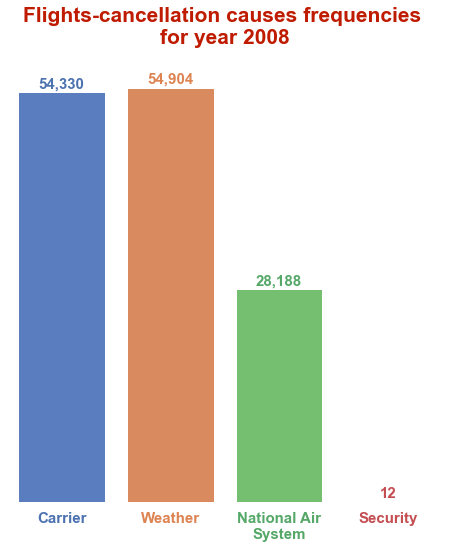

In [4]:
# times of flight cancellation causes for year 2008 (7,009,724 rows)
# A = carrier, B = weather, C = NAS, D = security

plt.figure(figsize=(20,8))
default_color = sns.color_palette()[0]
sns.set(style='white')
ax = sns.countplot(data = df_inv, x = 'CancellationCode',
                  order = df_inv['CancellationCode'].value_counts().sort_index().index,
                  color = default_color,palette='muted')
ax.set_box_aspect(4/len(ax.patches)) # change 5 (numerator)  to modify the y/x axis ratio

sns.despine(left=True,bottom=True)

plt.title("Flights-cancellation causes frequencies \nfor year 2008",
          fontsize=21,
          color='#BF1B00',
          weight='bold',y=1.04)

#plt.xlabel('Cause',fontsize=16.5,color='blue')
#plt.ylabel('Freq.\n ',fontsize=16.5,color='blue')
plt.xlabel(''),plt.ylabel('')

#plt.yticks([0,10000,20000,30000,40000,50000],[0,'1e4','2e4','3e4','4e4','5e4'],fontsize=12.5,weight='bold')
plt.yticks([])

# Recalculating the causes_counts
causes_counts = df_inv['CancellationCode'].value_counts().sort_index()
# get the current tick locations and labels
locs, labels = plt.xticks(fontsize=15,weight='bold') 

# loop through each pair of locations and labels
text_colors=(color for color in list(sns.color_palette()))#,
for loc, label in zip(locs, labels):

    # get the text property for the label to get the correct count
    count = causes_counts[label.get_text()]
    # print the annotation just above the top of the bar
    plt.text(loc, count+600, s=f"{count:,}", ha = 'center',fontsize=15,weight='bold',color=next(text_colors))
    
ax.set_xticklabels(causes)

# coloring xticks labels
colors = [color for color in list(sns.color_palette())]
for xtick, color in zip(ax.get_xticklabels(), colors):
    xtick.set_color(color);

## <font color='#AD1FFF'>2<sup>nd</sup></font> <font color='#5FB1FF'>Arrival delays distribution</font> <a id='2nd'></a>

- **Most arrival delays were of 15 minutes to about 78 minutes** , the median for the data points arrival delays was 37 minutes. The violin plot clearly assures the huge distribution near to the median.

    
        


From 1,524,733 flights of 15 minutes arrival delay or more:
*****
'20,726' flights exceeded "250" min. arrival delay
'5,824' flights exceeded "350" min. arrival delay
'3,439' flights exceeded "400" min. arrival delay
'1,562' flights exceeded "500" min. arrival delay
'189' flights exceeded "1000" min. arrival delay
'9' flights exceeded "1500" min. arrival delay
'2' flights exceeded "2000" min. arrival delay
'0' flights exceeded "2500" min. arrival delay


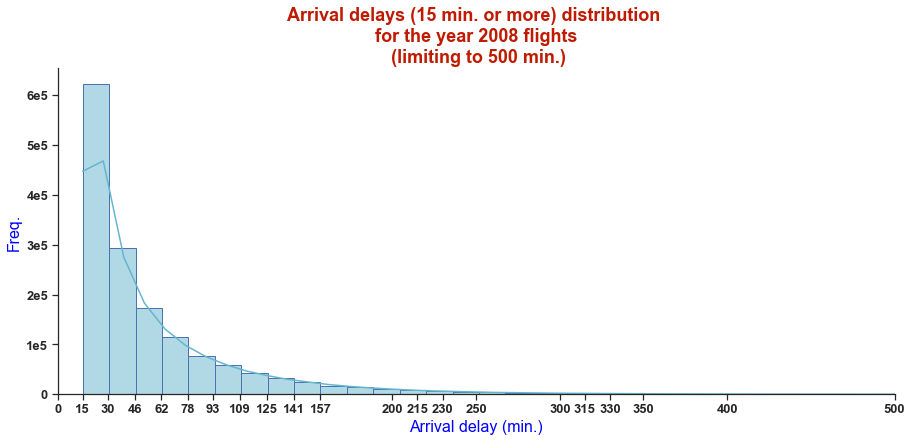

In [5]:
# polished histogram

sns.set_theme(style='ticks')
plt.figure(figsize=(15,6))

sns.histplot(df_inv_15['ArrDelay'],bins=155,kde=True,
             color=sns.color_palette()[9],
             edgecolor=sns.color_palette()[0], linewidth=1) #,
             #hist_kws={'histtype':'bar','alpha':0.1875}),color='skyblue'
sns.despine()

plt.title('Arrival delays (15 min. or more) distribution \nfor the year 2008 flights\n (limiting to 500 min.)',
               fontsize=18,color='#BF1B00',weight='bold')

plt.xlabel('Arrival delay (min.)',color='blue',fontsize=16)
plt.ylabel('Freq.',color='blue',fontsize=16);

plt.xlim([0,500])
plt.xticks([0, 15, 30,46,62,78,93,109,125,141,157,200,215,230,250,300,315,330,350,400,500],
           fontsize=13,weight='bold')
plt.yticks(np.arange(0,7,1)*10**5,
           [0]+[str(n)+'e5' for n in range(1,7,1)],
           #[0,'1e5','2e5','3e5','4e5','5e5','6e5'],
           fontsize=13,weight='bold');

# finding arrival-delays outliers
delays = [2500,2000,1500,1000,500,400,350,250]

print(f"\nFrom {len(df_inv_15):,} flights of 15 minutes arrival delay or more:\n*****")
for delay in delays[::-1]:
    print(f"'{df_inv_15[df_inv_15.ArrDelay > delay].shape[0]:,}' flights",
          'exceeded "{}" min. arrival delay'.format(delay))
    

#     print('Flights that exceeded "{}" minutes arrival delay are'.format(delay),
#           f"'{df_inv_15[df_inv_15.ArrDelay > delay].shape[0]:,}' from",
#           f"{len(df_inv_15):,} flights of 15 minutes arrival delay or more.")

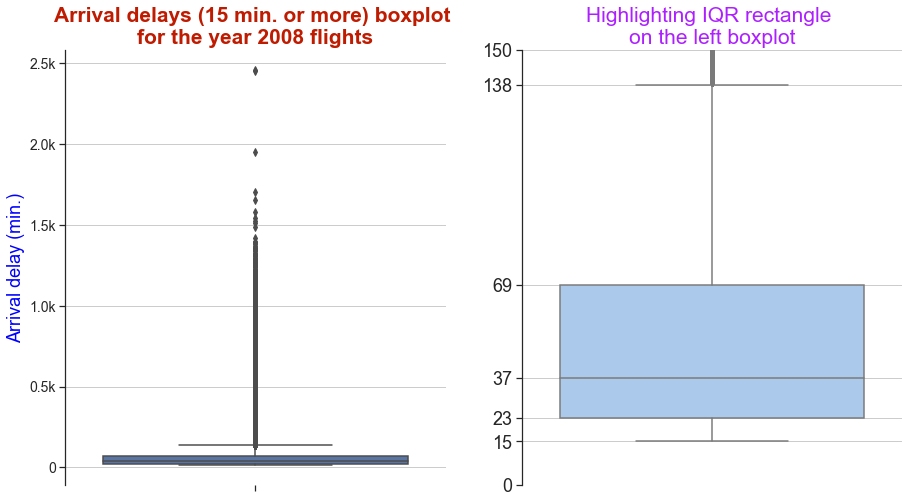

In [6]:
# univariate boxplots of 'delay-causes columns' for all flights data

plt.figure(figsize=(15,8))

plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main plot
ax = sns.boxplot(data= df_inv_15,
                 y='ArrDelay',)#palette='pastel')
plt.title('Arrival delays (15 min. or more) boxplot \nfor the year 2008 flights',
          fontsize=21,
          color='#BF1B00',
          weight='bold')

plt.ylabel('Arrival delay (min.)',fontsize=18,color='blue')
plt.xlabel('',fontsize=18,color='blue')

#ax.set_xticklabels(causes)
plt.yticks(np.arange(0,3000,500),
           [0] + [str(n)+'k' for n in np.arange(0.5,3,0.5)],
           #[0] + [str(n/10)+'k' for n in range(5,30,5)],
           fontsize=14)


sns.despine(left=True)
ax.grid(True,axis ='y')

# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.boxplot(data= df_inv_15,
                 y='ArrDelay',palette='pastel')

sns.despine(bottom=True)
plt.title('Highlighting IQR rectangle \non the left boxplot',fontsize=21,color='#AD1FFF')
plt.xlabel('')
plt.ylabel('')
ax.set_xticks([])

plt.yticks(fontsize=18)
ax.set_yticks([0,15,23,37,69,138,150])
ax.set_ylim([0,150])

ax.grid(True,axis ='y');
plt.subplots_adjust(wspace=.2);

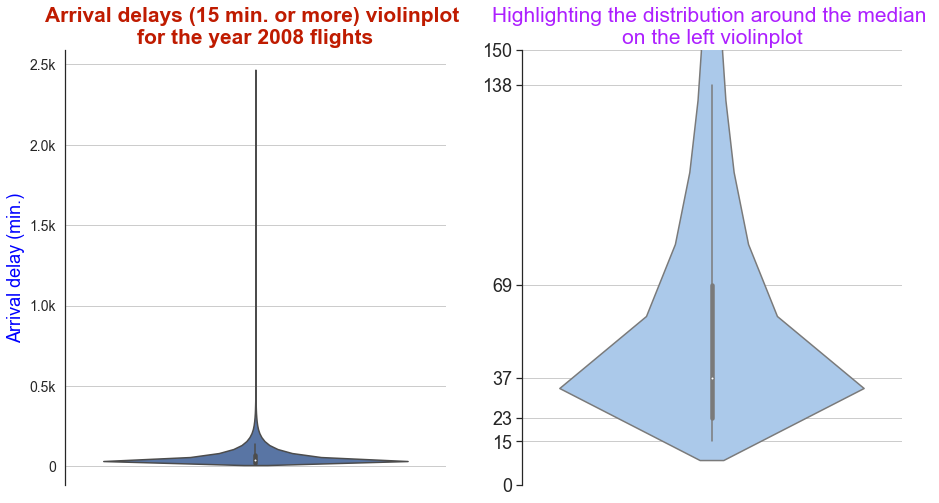

In [7]:
# univariate boxplots of 'delay-causes columns' for all flights data

plt.figure(figsize=(15,8))

plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main plot
ax = sns.violinplot(data= df_inv_15,
                 y='ArrDelay',)#palette='pastel')
plt.title('Arrival delays (15 min. or more) violinplot \nfor the year 2008 flights',
          fontsize=21,
          color='#BF1B00',
          weight='bold')

plt.ylabel('Arrival delay (min.)',fontsize=18,color='blue')
plt.xlabel('',fontsize=18,color='blue')

#ax.set_xticklabels(causes)
plt.yticks(np.arange(0,3000,500),
           [0] + [str(n)+'k' for n in np.arange(0.5,3,0.5)],
           #[0] + [str(n/10)+'k' for n in range(5,30,5)],
           fontsize=14)


sns.despine(left=True)
ax.grid(True,axis ='y')

# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.violinplot(data= df_inv_15,
                 y='ArrDelay',palette='pastel')

sns.despine(bottom=True)
plt.title('Highlighting the distribution around the median \non the left violinplot',fontsize=21,color='#AD1FFF')
plt.xlabel('')
plt.ylabel('')
ax.set_xticks([])

plt.yticks(fontsize=18)
ax.set_yticks([0,15,23,37,69,138,150])
ax.set_ylim([0,150])

ax.grid(True,axis ='y');
plt.subplots_adjust(wspace=.2);

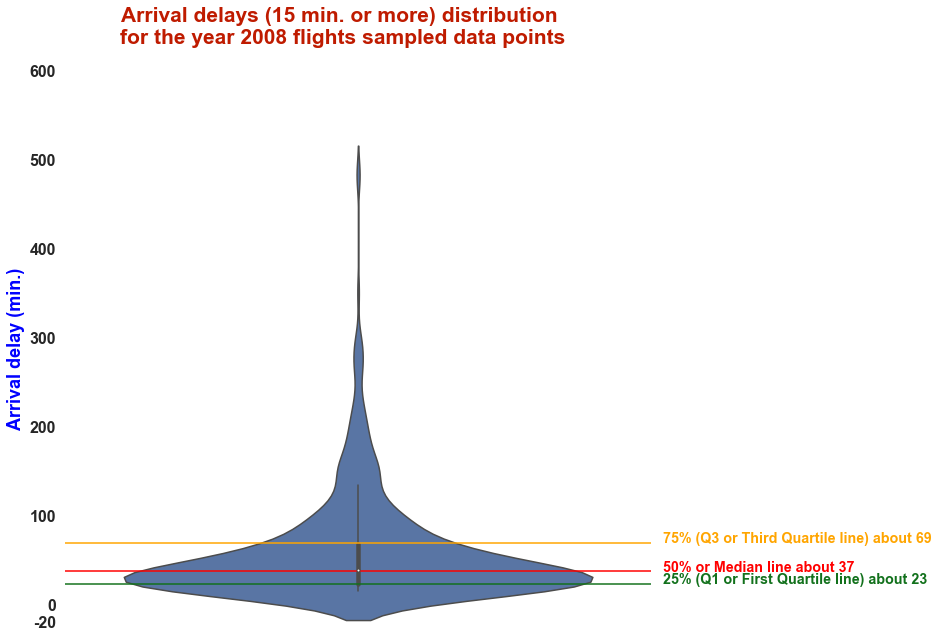

In [8]:
# univariate "Arrival Delays" violinplot for flights sample data (500 rows)

g = sns.FacetGrid(data = melt_samp_15,
                  #col = 'Cause',hue='Cause',
                 ylim=(-25,600),height=9)

title = 'Arrival delays (15 min. or more) distribution \nfor the year 2008 flights sampled data points'
g.fig.suptitle(title,
               fontsize=21,
               color='#BF1B00',
               weight='bold')#,y=1.04)

sns.despine(left=True,bottom=True)

g.map(sns.violinplot,y=melt_samp_15['ArrDelay'])

# g.set_titles('{col_name}')

#g.set_titles('{col_name}')
#xticks = [-60,0,100,200,300,400]
#g.set(xticks=xticks)
#g.set_xticklabels(xticks,fontsize=13.5)

yticks= [-20]+list(np.arange(0,700,100))
#g.axes[0,0].set_yticks(yticks)
plt.yticks(yticks,yticks,
           fontsize=16,weight='bold')

g.set_ylabels('Arrival delay (min.)',color='blue',fontsize=18,weight='bold')
#g.set_ylabels('');

#for i in range(4):
#    g.axes[0,i].set_title(causes[i]+' delay (min.)',fontsize=18,color='blue')
#   g.axes[0,i].grid(True);


# drawing quartiles lines using dictionary of lists
# creating lines dictionary
quartile_dict = {23 : ['25% (Q1 or First Quartile line) about 23' , sns.color_palette('dark')[2]], #'g'
                 37 : ['50% or Median line about 37', 'red'],
                 69 : ['75% (Q3 or Third Quartile line) about 69' , 'orange']}
#colors = (color for color in list(sns.color_palette()))
for yloc, l_list in quartile_dict.items():
    #color = color=next(colors)#
    plt.axhline(yloc,color=l_list[1])
    plt.text(.52,yloc,l_list[0],color=l_list[1],fontsize=14.2,weight='bold')

# # drawing quartiles lines using dictionary of dictionaries (3 ways )
# creating lines dictionary
# quartile_dict = {23 : {'25% (Q1 or First Quartile line) about 23' : 'g'},
#                  37 : {'50% or Median line = 37': 'red'},
#                  69 : {'75% (Q3 or Third Quartile line) about 69' : 'orange'}}

# for yloc, l_dict in quartile_dict.items():               # --------------- first way
#     key_str =list(l_dict.keys())[0]
#     color=l_dict[key_str]
#     plt.axhline(yloc,color=color)
#     plt.text(.52,yloc,key_str,color=color)

# for yloc in quartile_dict:                               # --------------- second way (More general and short)
#     for string,color in quartile_dict[yloc].items():
#         plt.axhline(yloc,color=color)
#         plt.text(.52,yloc,string,color=color)

# for yloc in quartile_dict:                               # --------------- third way
#     for line in quartile_dict[yloc]:
#         color = quartile_dict[yloc][line]
#         plt.axhline(yloc,color=color)
#         plt.text(.52,yloc,line,color=color)

## <font color='#AD1FFF'>3<sup>rd</sup></font> <font color='#5FB1FF'>Causes-delays distributions</font> <a id='3rd'></a>

- **More higher frequencies were for "Carrier" and "National Air System" lower-delays values than other delay-causes delays**. However, 'Carrier' delays had the highest range distribution or spread, up to about 2500 min., leading to a higher number of outliers. At last place 'Security' delays had the lowest frequencies and distribution among all other delay causes.


- **'Carrier' delays exceeded with the highest spread and outliers**. They had a wide spread range with a bit surprising delays-outliers values.


- **'NAS' delays had more lower-values frequencies**, then 'Carrier', for flights with 15+ minutes arrival delay.


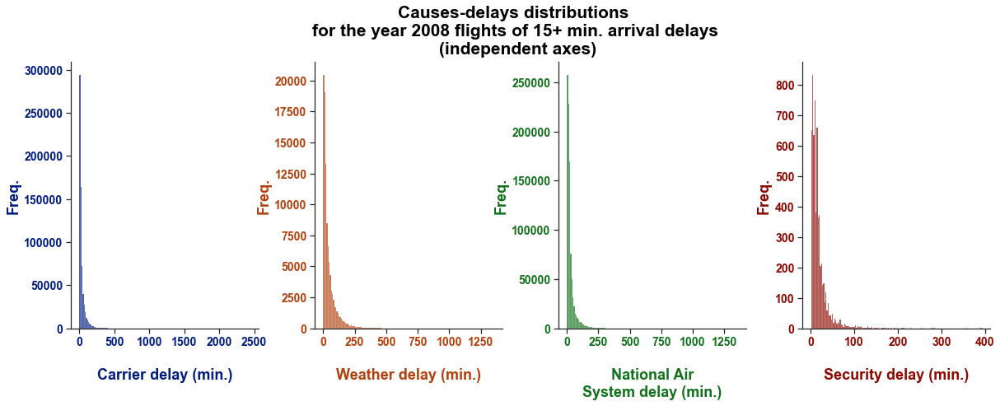

In [9]:
# plotting delay causes distributions in df_inv_15 without zero or missing values (filtering from 1,524,733 rows)

# histograms
plt.figure(figsize=(20,5.95))

sns.set(style='ticks')

title='Causes-delays distributions \nfor the year 2008 flights of 15+ min. arrival delays'
plt.suptitle(title+'\n (independent axes)',y=1.04,
             fontsize=21,color='black',# '#BF1B00',
             weight='bold')

colors = (color for color in list(sns.color_palette('dark')))    

for i,delay_col in enumerate(delay_causes_cols):
    
    mask = df_inv_15[delay_col].isin(zero_or_null)
    cause_col = df_inv_15[~mask][delay_col]
    
    plt.subplot(1,4,i+1)
    
    color = next(colors)
    ax = sns.histplot(cause_col,bins=155,kde=False,color = color)
    
    sns.despine()
    
    plt.xlabel('\n'+causes[i]+' delay (min.)',color=color,fontsize=18,weight='bold')
    plt.ylabel('Freq.',color=color,fontsize=18,weight='bold')
    
    #plt.xlim((0,2500))
    #xtick = [0,300,700,1300,1800,2400,3000,3800]
    #plt.xticks(xtick,xtick,fontsize=13.5)
    plt.xticks(fontsize=14,weight='bold',color=color)
    
    #plt.ylim((0,300000))
    #ytick = [0,450,850]
    #plt.yticks(ytick,ytick,fontsize=13.5)
    
    plt.yticks(fontsize=14,weight='bold',color=color)
    

plt.subplots_adjust(wspace=.3)

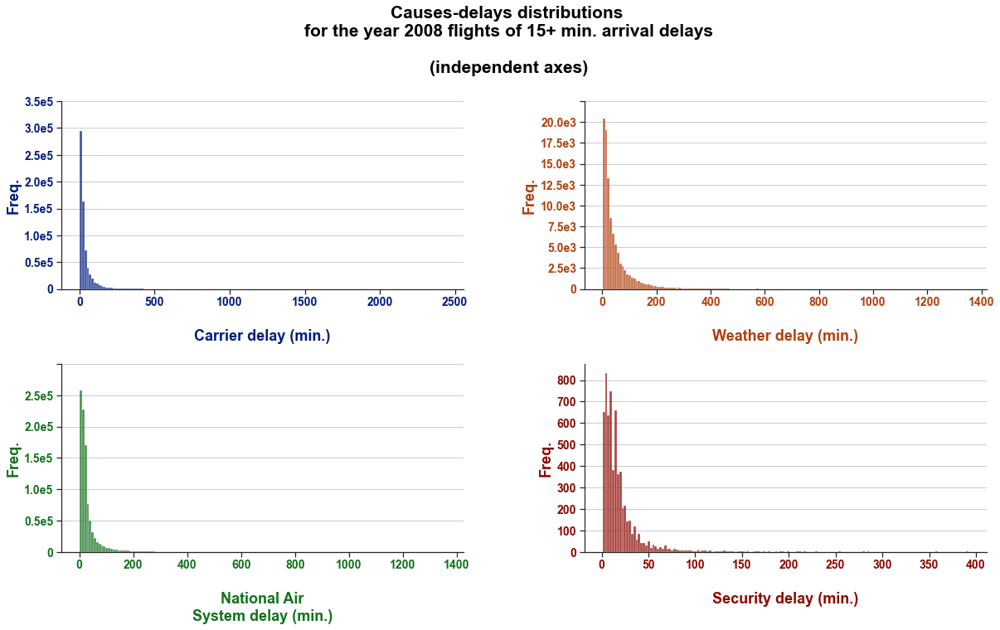

In [10]:
# plotting delay causes distributions in df_inv_15 without zero or missing values (filtering from 1,524,733 rows)
# limiting max minutes to 3000 to avoid  a number of outliers

# histograms
plt.figure(figsize=(20,10))

sns.set(style='ticks')

title='Causes-delays distributions \nfor the year 2008 flights of 15+ min. arrival delays'
plt.suptitle(title+'\n\n(independent axes)',y=1.04,
             fontsize=21,color='black',# '#BF1B00',
             weight='bold')

colors = (color for color in sns.color_palette('dark'))    

for i,delay_col in enumerate(delay_causes_cols):
    
    mask = df_inv_15[delay_col].isin(zero_or_null)
    cause_col = df_inv_15[~mask][delay_col]
    
    plt.subplot(2,2,i+1)
    
    color = next(colors)
    ax = sns.histplot(cause_col,bins=155,kde=False,color = color)
    
    sns.despine()
    
    plt.xlabel('\n'+causes[i]+' delay (min.)',color=color,fontsize=18,weight='bold')
    plt.ylabel('Freq.',color=color,fontsize=18,weight='bold')
    
    #plt.xlim((0,2500))
    #xtick = [0,300,700,1300,1800,2400,3000,3800]
    #plt.xticks(xtick,xtick,fontsize=13.5)
    plt.xticks(fontsize=14,weight='bold',color=color)
    
    #plt.ylim((0,300000))
    #ytick = [0,450,850]
    #plt.yticks(ytick,ytick,fontsize=13.5)
    
    plt.yticks(fontsize=14,weight='bold',color=color)
    
    # adjusting yticklabels
    if i == 0:
        yticks = (ax.get_yticks()).astype('int')
        yticklabels = [0] + [str(n/100000)+'e5' for n in yticks[1:]]
        plt.yticks(ticks=yticks,
                   labels=yticklabels,
                   fontsize=14,weight='bold',color=color)
    elif i == 1:
        yticks = (ax.get_yticks()).astype('int')
        yticklabels = [0] + [str(n/1000)+'e3' for n in yticks[1:9]] +['']
        plt.yticks(ticks=yticks,
                   labels=yticklabels,
                   fontsize=14,weight='bold',color=color)
    elif i == 2:
        yticks = (ax.get_yticks()).astype('int')
        yticklabels = [0] + [str(n/100000)+'e5' for n in yticks[1:6]] +['']
        plt.yticks(ticks=yticks,
                   labels=yticklabels,
                   fontsize=14,weight='bold',color=color)
        
    plt.grid(True,axis='y')

plt.subplots_adjust(hspace=.4,wspace=.3)

In [11]:
# finding zero delays or less of delay causes 

print(f"\nFrom {len(df_inv_15):,} flights of 15 minutes arrival delay or more:\n*****") 

for i,col in enumerate(delay_causes_cols):
    outliers = df_inv_15[df_inv_15[col] <=0].shape[0]
    print(f"'{outliers:,}' flights",
          'had "{}" min. or less of {}-delay'.format(0,causes[i].replace('\n',' ').lower()))
print('-----------------------')

# finding causes-delay times outliers
delays = [2500,2000,1500,1000,500,400,350,250]

for i,col in enumerate(delay_causes_cols):
    total = df_inv_15[~df_inv_15[col].isin(zero_or_null)]
    print('\nFrom {:,} {}-delay times:\n*****'.format(len(total),causes[i].replace('\n',' ').lower()))
    
    for delay in delays[::-1]:
        outliers = df_inv_15[df_inv_15[col] > delay].shape[0]
        print(f"'{outliers:,}' flights",
              'exceeded "{}" min. {}-delay'.format(delay,causes[i].replace('\n',' ').lower()))
        if outliers == 0:
            break


From 1,524,733 flights of 15 minutes arrival delay or more:
*****
'854,113' flights had "0" min. or less of carrier-delay
'1,424,748' flights had "0" min. or less of weather-delay
'596,703' flights had "0" min. or less of national air system-delay
'1,518,531' flights had "0" min. or less of security-delay
-----------------------

From 670,620 carrier-delay times:
*****
'6,445' flights exceeded "250" min. carrier-delay
'2,642' flights exceeded "350" min. carrier-delay
'1,837' flights exceeded "400" min. carrier-delay
'1,026' flights exceeded "500" min. carrier-delay
'116' flights exceeded "1000" min. carrier-delay
'6' flights exceeded "1500" min. carrier-delay
'1' flights exceeded "2000" min. carrier-delay
'0' flights exceeded "2500" min. carrier-delay

From 99,985 weather-delay times:
*****
'1,535' flights exceeded "250" min. weather-delay
'500' flights exceeded "350" min. weather-delay
'315' flights exceeded "400" min. weather-delay
'156' flights exceeded "500" min. weather-delay
'12

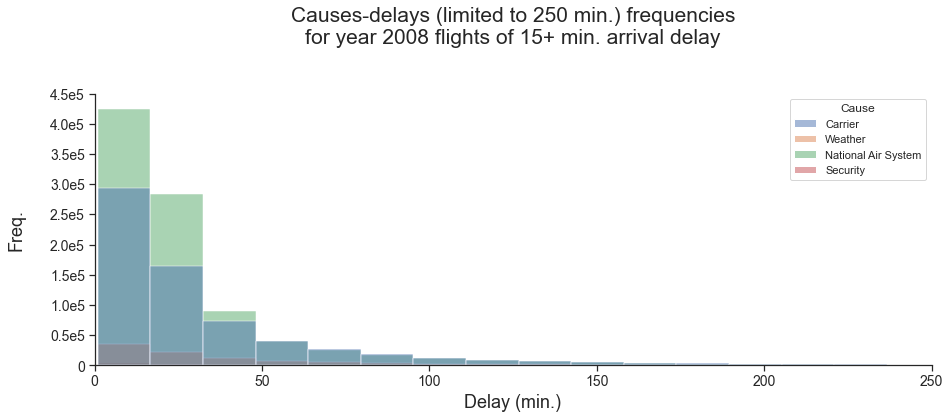

In [12]:
# delay-causes delays bivariate histogram for flights with 15+ minutes arrival delay

plt.figure(figsize=(15,5))

order = melt_15.Cause.unique()

ax = sns.histplot(data=melt_15,x='Minutes',bins=155,
                  hue='Cause',hue_order=order,
                 )#palette='bright')
sns.despine()
plt.xlim((0,250))
plt.title('Causes-delays (limited to 250 min.) frequencies\nfor year 2008 flights of 15+ min. arrival delay\n\n',
         fontsize=21)
plt.xlabel('Delay (min.)',fontsize=18)
plt.ylabel('Freq.\n',fontsize=18)

plt.xticks(fontsize=14)
yticks = ax.get_yticks()
plt.yticks(yticks,
          [0]+[str(n/100000) +'e5' for n in yticks[1:]],
          fontsize=14);

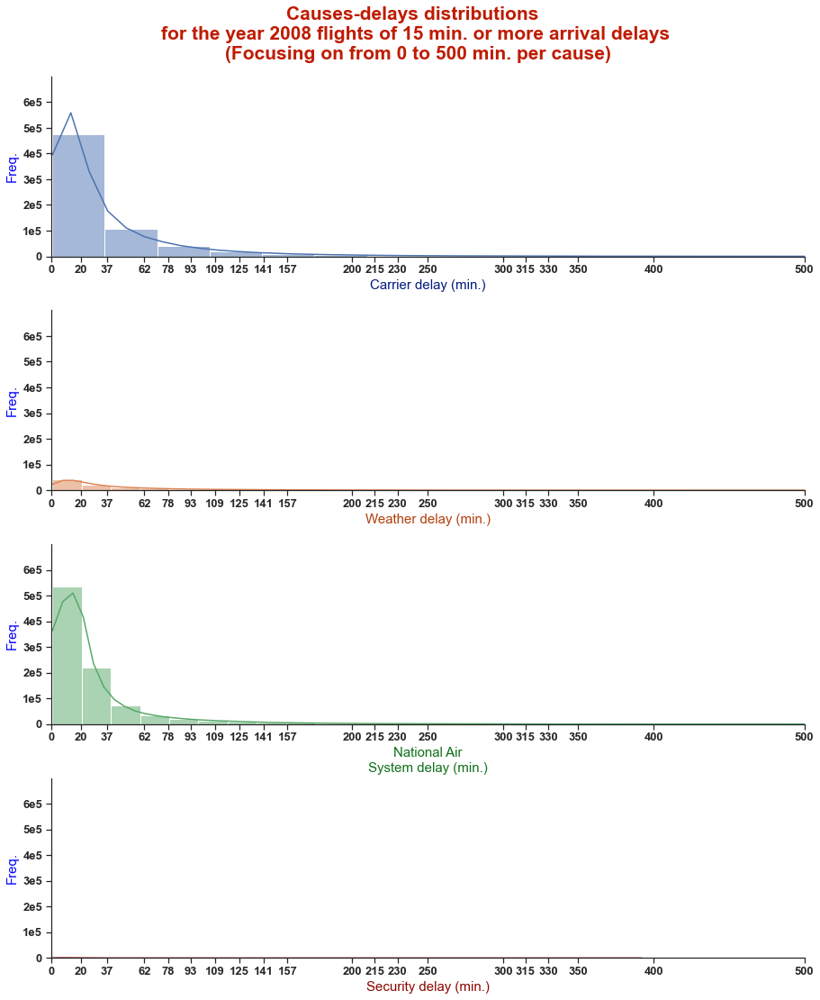

In [13]:
# polished histogram

sns.set_theme(style='ticks')
plt.figure(figsize=(15,18))

title = 'Causes-delays distributions \nfor the year 2008 flights of 15 min. or more arrival delays'
plt.suptitle(title + '\n (Focusing on from 0 to 500 min. per cause)',
            fontsize=21,color='#BF1B00',weight='bold',y=.94)   

colors = (color for color in list(sns.color_palette('dark')))    

for i,delay_col in enumerate(delay_causes_cols):
    
    mask = df_inv_15[delay_col].isin(zero_or_null)
    cause_col = df_inv_15[~mask][delay_col]
    
    plt.subplot(4,1,i+1)
    sns.histplot(cause_col,bins=70,kde=True,
                 color=sns.color_palette()[i])#[9])#,hist_kws={'histtype':'bar','alpha':0.1875}),color='skyblue'
    sns.despine()
    plt.xlabel(causes[i]+' delay (min.)',color=next(colors),fontsize=15)
    plt.ylabel('Freq.',color='blue',fontsize=15);
    plt.xlim([0,500])
    plt.xticks([0, 20, 37,62,78,93,109,125,141,157,200,215,230,250,300,315,330,350,400,500],
               fontsize='13',weight='bold')
    plt.ylim((0,700000))
    plt.yticks(np.arange(0,7,1)*10**5,
               [0]+[str(n)+'e5' for n in range(1,7,1)],
               #[0,'1e5','2e5','3e5','4e5','5e5','6e5'],
               fontsize='13',weight='bold')
plt.subplots_adjust(hspace=.3);

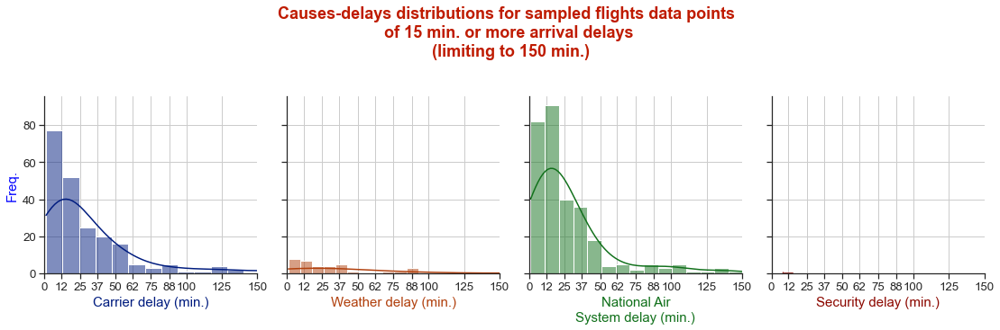

In [14]:
# plotting Delay causes distributions for sampled flights (500 rows)
# with limiting up to 80 minutes for delay cause in the analysed sample

# histplots
sns.set_theme(font_scale=1.21,style='ticks')

g = sns.FacetGrid(data = melt_samp_15 ,
                  col = 'Cause',hue='Cause',palette='dark',
                  xlim=(0,150),
                  #height=3.9,aspect=.90)
                  height=5,aspect=.77)

title = 'Causes-delays distributions for sampled flights data points \nof 15 min. or more arrival delays'
g.fig.suptitle(title + '\n (limiting to 150 min.)',
               fontsize=18,color='#BF1B00',weight='bold')

g.map(sns.histplot,'Minutes',bins=35,kde=True)
#g.set_titles('{col_name}')

g.set_titles('')

xticks = [0,12,25,37,50,62,75,88,100,125,150]
g.set(xticks=xticks)

colors = (color for color in list(sns.color_palette('dark')))    

for i in range(4):
    g.axes[0,i].set_xlabel(causes[i]+' delay (min.)',color=next(colors),fontsize=15)
    g.axes[0,i].grid(True)
g.set_ylabels('Freq.',color='blue',fontsize=15);

## <font color='#AD1FFF'>4<sup>th</sup></font> <font color='#5FB1FF'>More causes-delays distributions, means, more statistics</font> <a id='4th'></a>

- **In general, Weather-delays had the highest mean, median, the wider IQR, and a wider range from its higher median to its third quartile over other-causes delays**. However, delays of other-causes had much more distributions around their lower medians. Carrier-delays had the second highest delays mean, then NAS's came third. At last, security-delays had the lowest delays mean.


- Delays due to 'Weather' had a wider IQR range, from about 10 min. to about 57 min. as well a wider distribution from about 20 min to about 150 min, also with a higher median, mean, and a wider range from the median to the third quartile, even than 'Carrier' and 'NAS' delays. 'Carrier' delays came second then 'NAS' in related to mean, IQR, and distributions in the same range, but with much more distributions around or below their lower medians. At last 'Security' delays came with a smaller mean and IQR as well a more lower delays values around and below the lowest median.


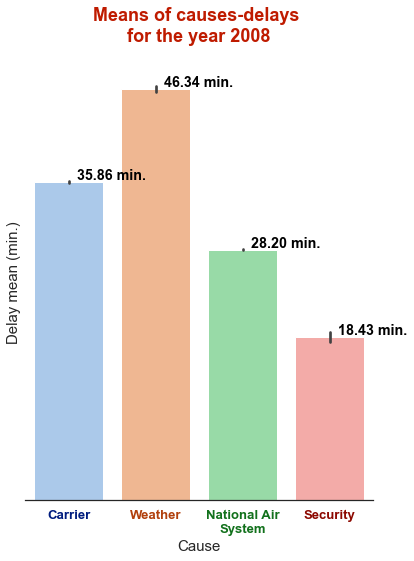

In [15]:
# bivarite bar plot for delay causes time means
# for all flights of 15 minutes or more arrival delays (1,524,733  rows) 

plt.figure(figsize=(15,8))
sns.set(font_scale=1.19,style='white')

ax = sns.barplot(data = melt_15, x='Cause',y='Minutes', palette='pastel')

ax.set_box_aspect(5/len(ax.patches)) # change 5 (numerator)  to modify the y/x axis ratio

sns.despine(left=True)
plt.title('Means of causes-delays \nfor the year 2008',fontsize=18,
          color='#BF1B00',weight='bold',y=1.04)
plt.xlabel('Cause',fontsize=15)
plt.ylabel('Delay mean (min.)',fontsize=15)

#ytick = [0,20,40]
plt.yticks([])
#plt.grid(True)

# get the current tick locations and labels
locs, labels = plt.xticks() 

# grouping melt_15 to calculate columns means by delay causes
means_15 = melt_15.groupby('Cause').mean()

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):

    # get the text property for the label to get the correct mean
    mean_15 = means_15.loc[label.get_text(),'Minutes']
    # print the annotation just above the top of the bar
    plt.text(loc+.1, mean_15+.2, s='{:0.2f} min.'.format(mean_15), ha = 'left', color = 'black',weight='bold')

ax.set_xticklabels(causes,weight='bold')

# coloring xticks labels
colors = [color for color in list(sns.color_palette('dark'))]
for xtick, color in zip(ax.get_xticklabels(), colors):
    xtick.set_color(color);

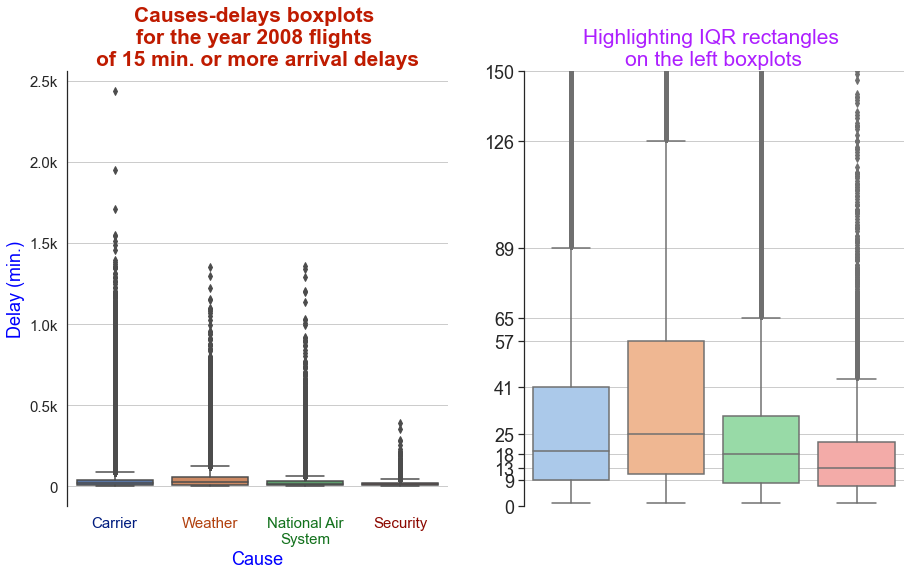

In [16]:
# univariate boxplots of 'delay-causes columns' for all flights data

plt.figure(figsize=(15,8))

plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main plot
ax = sns.boxplot(data= melt_15,
                 y='Minutes',x='Cause',)#palette='pastel')
plt.title('Causes-delays boxplots \nfor the year 2008 flights \nof 15 min. or more arrival delays',
          fontsize=21,
          color='#BF1B00',
          weight='bold')

plt.ylabel('Delay (min.)',fontsize=18,color='blue')
plt.xlabel('Cause',fontsize=18,color='blue')

ax.set_xticklabels(causes)
plt.xticks(fontsize=15)

plt.yticks(np.arange(0,26,5)*100,
           [0] + [str(n)+'k' for n in np.arange(0.5,2.6,0.5)],
           fontsize=15)

sns.despine(left=True)
ax.grid(True,axis ='y')

# coloring xticks labels
colors = [color for color in list(sns.color_palette('dark'))]
for xtick, color in zip(ax.get_xticklabels(), colors):
    xtick.set_color(color);
    
# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.boxplot(data= melt_15,
                 y='Minutes',x='Cause',palette='pastel')

sns.despine(bottom=True)
plt.title('Highlighting IQR rectangles \non the left boxplots',fontsize=21,color='#AD1FFF')
plt.xlabel('')
plt.ylabel('')
ax.set_xticks([])

plt.yticks(fontsize=18)
ax.set_yticks([0,9,13,18,25,41,57,65,89,126,150])
ax.set_ylim([0,150])

ax.grid(True,axis ='y');
plt.subplots_adjust(wspace=.2);

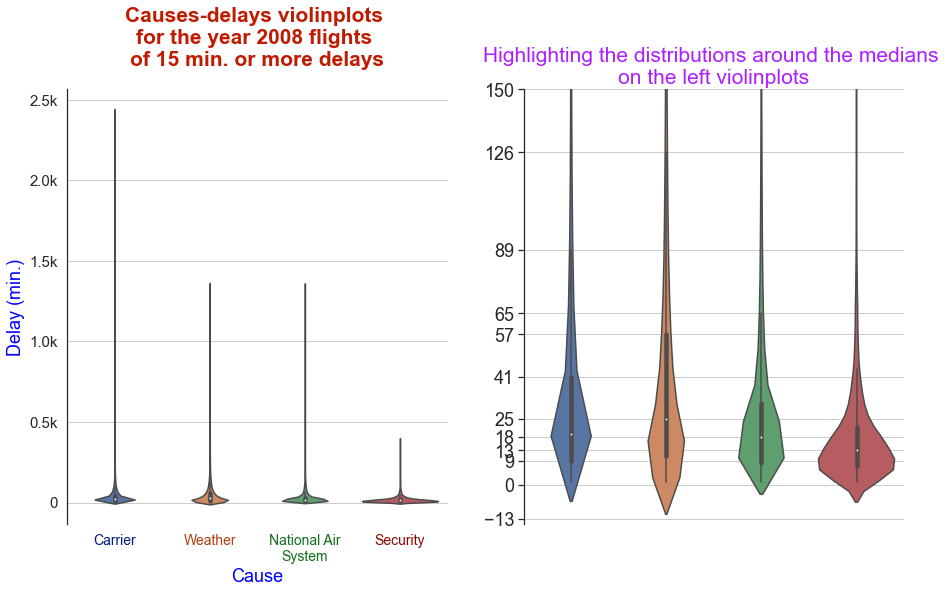

In [17]:
# univariate violinplots of 'delay-causes columns' for all flights data

plt.figure(figsize=(15,8))

plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main plot
ax = sns.violinplot(data= melt_15,
                 y='Minutes',x='Cause',palette='deep')

plt.title('Causes-delays violinplots \nfor the year 2008 flights \nof 15 min. or more delays',
          fontsize=21,
          color='#BF1B00',
          weight='bold',y=1.04)

sns.despine(left=True)

plt.xlabel('Cause',fontsize=18,color='blue')
ax.set_xticklabels(causes)
plt.xticks(fontsize=14)

plt.ylabel('Delay (min.)',fontsize=18,color='blue')

plt.yticks(np.arange(0,26,5)*100,
           [0] + [str(n)+'k' for n in np.arange(0.5,2.6,0.5)],
           fontsize=15)

ax.grid(True,axis ='y')

# coloring xticks labels
colors = [color for color in list(sns.color_palette('dark'))]
for xtick, color in zip(ax.get_xticklabels(), colors):
    xtick.set_color(color);
    
# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes # ------------
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.violinplot(data= melt_15,
                 y='Minutes',x='Cause',palette='deep')

sns.despine(bottom=True)
plt.title('Highlighting the distributions around the medians \non the left violinplots',fontsize=21,color='#AD1FFF')
plt.xlabel('')
plt.ylabel('')

ax.set_xticks([])

ax.set_yticks([-13,0,9,13,18,25,41,57,65,89,126,150])
ax.set_ylim([-15,150])
plt.yticks(fontsize=18)

ax.grid(True,axis ='y');

plt.subplots_adjust(wspace=.2);

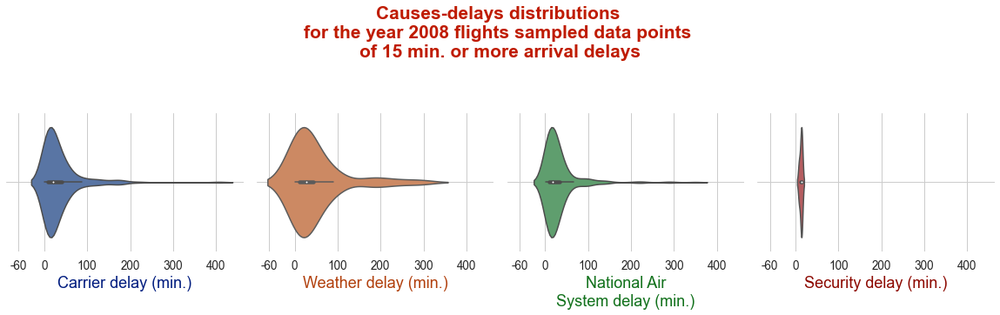

In [18]:
# plotting faceted univariate violinplots 'delay-causes columns' for flights sample data (500 rows)

g = sns.FacetGrid(data = melt_samp_15,
                  col = 'Cause',hue='Cause',
                  height=4.5,aspect=.9)

title = 'Causes-delays distributions \nfor the year 2008 flights sampled data points \nof 15 min. or more arrival delays'
g.fig.suptitle(title,
               fontsize=21,
               color='#BF1B00',
               weight='bold',y=1.04)

sns.despine(left=True,bottom=True)

g.map(sns.violinplot,'Minutes')

# g.set_titles('{col_name}')

g.set_titles('')
xticks = [-60,0,100,200,300,400]
g.set(xticks=xticks)
g.set_xticklabels(xticks,fontsize=13.5)

g.set_ylabels('')

# coloring xticks labels
colors = (color for color in list(sns.color_palette('dark')))

for i in range(4):
    g.axes[0,i].set_xlabel(causes[i]+' delay (min.)',fontsize=18,color=next(colors))#sns.color_palette()[i])
    g.axes[0,i].grid(True);

## <font color='#AD1FFF'>5<sup>th</sup></font> <font color='#5FB1FF'>Arrival delays means, statistics & distributions per delay cause</font> <a id='5th'></a>

- **Flights that had weather-delays were probably to have the most arrival delays in general**. In the second stage, flights with carrier-delays were more probably to arrive before weather-delayed flights. At third, National Air System-delays stood up, and the NAS-delayed flights were more probably to arrive earlier than the first both causes. At last, in general, security-delayed flights were more probably to arrive faster than other delayed flights.


- **Arrival delays due to 'Weather' had a higher mean, median (which is about 62 minutes), with a larger third quartile range, and a more wider greater values distribution from about 55 minutes to about 225 minutes than arrival delays due to other causes**. Arrival delays due to 'Carrier and NAS' had much more distributions around and below their lower-medians, indicating the higher frequencies of lower-values of arrival-delays due to both of those delay causes. As well, both were the most to reach higher outliers values in general. Probably, this made them to have a wider general ranges. However, arrival delays due to weather still have the highest median with a larger third quartile range as stated at first.


- **For the whole flights of 15+ min. arrival delay, in general, arrival-delays due to 'Security' had the lowest** median, ranges, as well outliers, and the largest distribution around and below this lowest median, than arrival-delays due to other delay-causes.


- There were **much more frequencies for arrival delays due to 'NAS'**; then due to 'Carrier', 'Weather' and 'Security' in order. As well, higher frequencies of arrival lower-delays values were due to 'NAS'. However, arrival delays due to 'Security' may had much lower values than all.


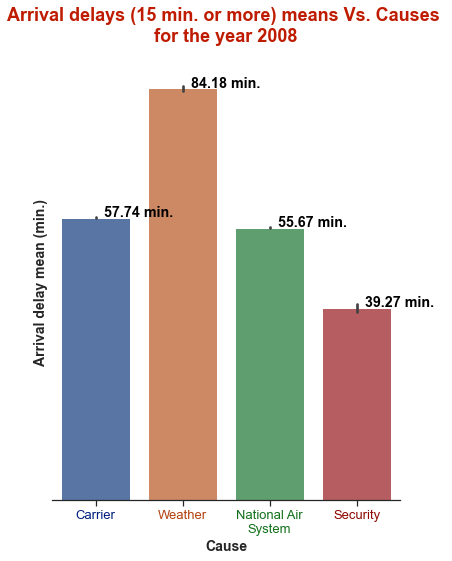

In [19]:
# bivarite bar plot for delay causes time means
# for all flights of 15 minutes or more arrival delays (1,524,733  rows) 

plt.figure(figsize=(15,8))
sns.set(font_scale=1.19,style='ticks')

ax = sns.barplot(data = melt_15, x='Cause',y='ArrDelay',)# palette='pastel')
ax.set_box_aspect(5/len(ax.patches)) # change 5 (numerator)  to modify the y/x axis ratio

sns.despine(left=True)
plt.title('Arrival delays (15 min. or more) means Vs. Causes \nfor the year 2008',fontsize=18,
          color='#BF1B00',weight='bold',y=1.04)
plt.xlabel('Cause',fontsize = 14,weight='bold')
plt.ylabel('Arrival delay mean (min.)',fontsize = 14,weight='bold')

#ytick = [0,20,40,60,80]
#plt.yticks(ytick,ytick)
plt.yticks([])
#plt.grid(True)

# get the current tick locations and labels
locs, labels = plt.xticks() 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    
    # get the text property for the label to get the correct mean
    mean_15 = means_15.loc[label.get_text(),'ArrDelay']
    
    # print the annotation just above the top of the bar
    plt.text(loc+.1, mean_15+.2, s='{:0.2f} min.'.format(mean_15), ha = 'left', color = 'black',weight='bold')

ax.set_xticklabels(causes,fontsize=13)

# coloring xticks labels
colors = [color for color in list(sns.color_palette('dark'))]
for xtick, color in zip(ax.get_xticklabels(), colors):
    xtick.set_color(color);

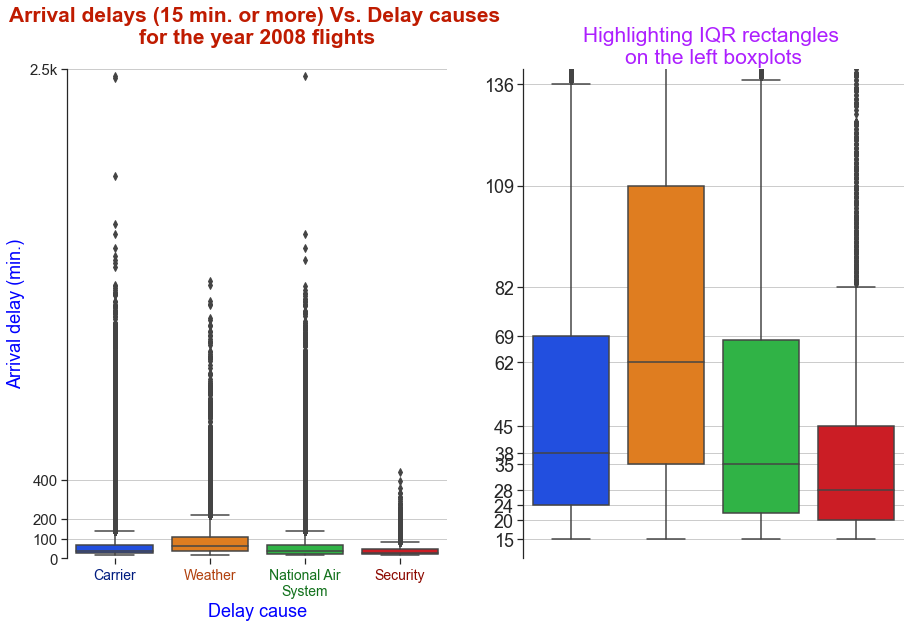

In [20]:
# boxplot of ArrDelay against delay causes
# for all data points df_inv_15 (1,524,733 rows)

plt.figure(figsize=(15,9))

plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main plot
ax = sns.boxplot(data= melt_15,
                 y='ArrDelay',
                 x='Cause',palette='bright')
sns.despine(left=True)
ax.grid(True,axis ='y')

plt.title('Arrival delays (15 min. or more) Vs. Delay causes \nfor the year 2008 flights',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)
plt.ylabel('Arrival delay (min.)',fontsize=18,color='blue')
plt.xlabel('Delay cause',fontsize=18,color='blue')

ax.set_ylim([0,2500])
yticks=[0,100,200,400,2500]
plt.yticks(yticks,
           [0,100,200,400,'2.5k'],
           fontsize=15)

ax.set_xticklabels(causes)
plt.xticks(fontsize=14)

# coloring xticks labels
colors = [color for color in list(sns.color_palette('dark'))]
for xtick, color in zip(ax.get_xticklabels(), colors):
    xtick.set_color(color);

# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.boxplot(data= melt_15,
                 y='ArrDelay',
                 x='Cause',palette='bright')

sns.despine(bottom=True)

plt.title('Highlighting IQR rectangles \non the left boxplots',fontsize=21,color='#AD1FFF')
plt.xlabel('',fontsize=18)
plt.ylabel('')

plt.yticks(fontsize=18)
ax.set_yticks([15,20,24,28,35,38,45,62,69,82,109,136,150])
ax.set_ylim([10,140])
ax.set_xticks([])

ax.grid(True,axis ='y');

plt.subplots_adjust(wspace=.2);

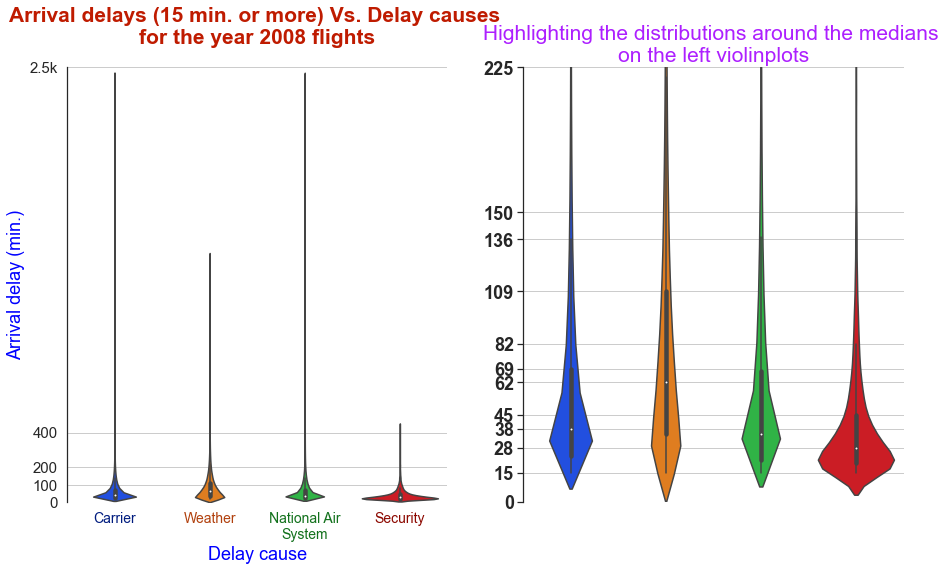

In [21]:
# bivariate violinplots of ArrDelay against delay causes
# for all filghts data points df_inv_15 (1,524,733 rows)

plt.figure(figsize=(15,8))
plt.subplot(121)
sns.set(font_scale=1.19,style='ticks')

# main violinplot
ax = sns.violinplot(data= melt_15,
                 y='ArrDelay',x='Cause',palette='bright')

sns.despine(left=True)
ax.grid(True,axis ='y')

plt.title('Arrival delays (15 min. or more) Vs. Delay causes \nfor the year 2008 flights',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)
plt.ylabel('Arrival delay (min.)',fontsize=18,color='blue')
plt.xlabel('Delay cause',fontsize=18,color='blue')

ax.set_ylim([0,2500])
yticks=[0,100,200,400,2500]
plt.yticks(yticks,
           [0,100,200,400,'2.5k'],
           fontsize=15)

ax.set_xticklabels(causes)
plt.xticks(fontsize=14)

# coloring xticks labels
colors = [color for color in list(sns.color_palette('dark'))]
for xtick, color in zip(ax.get_xticklabels(), colors):
    xtick.set_color(color);

# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)

sns.set(font_scale=1.19,style='white')

ax = sns.violinplot(data= melt_15,
                    y='ArrDelay',
                    x='Cause',palette='bright')

sns.despine(bottom=True)
plt.title('Highlighting the distributions around the medians \non the left violinplots',fontsize=21,color='#AD1FFF')

plt.xlabel('',fontsize=18,weight='bold')
plt.ylabel('')

plt.yticks(fontsize=18,weight='bold')

ax.set_yticks([0,15,28,38,45,62,69,82,109,136,150,225])
ax.set_ylim([0,225])

ax.set_xticks([])

ax.grid(True,axis ='y');
plt.subplots_adjust(wspace=.2);

The findings or results here regarding arrival-delays due to security are not the same of the data population.


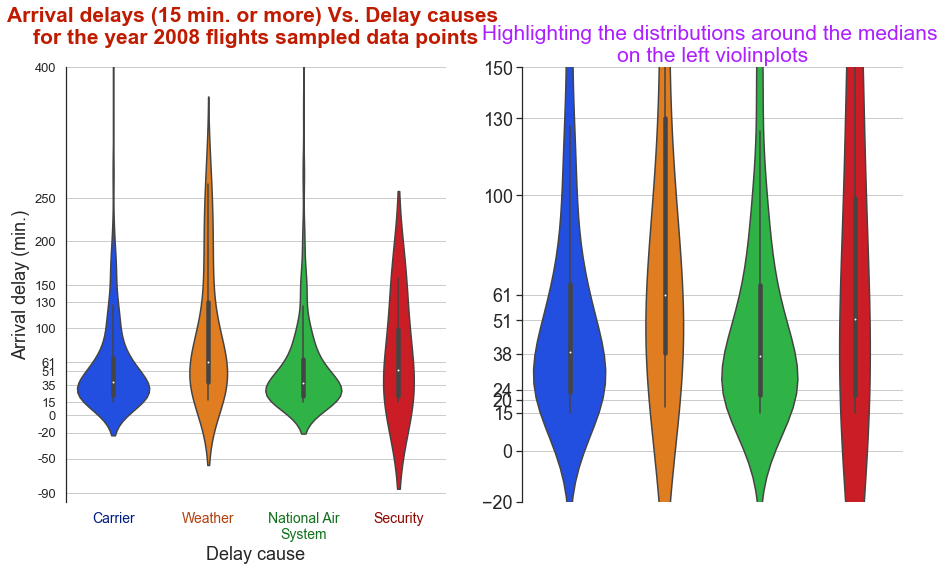

In [22]:
# bivariate boxplots of ArrDelay against delay causes
# for the 500 data points sample df_inv_15_samp (500 rows)

plt.figure(figsize=(15,8))
plt.subplot(121)


# main violinplot
ax = sns.violinplot(data= melt_samp_15,
                 y='ArrDelay',x='Cause',palette='bright')
sns.set(font_scale=1.19,style='ticks')
sns.despine(left=True)

plt.title('Arrival delays (15 min. or more) Vs. Delay causes \nfor the year 2008 flights sampled data points',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)
plt.ylabel('Arrival delay (min.)',fontsize=18)#,color='blue')
plt.xlabel('Delay cause',fontsize=18)#,color='blue')

ax.set_xticklabels(causes)
plt.xticks(fontsize=14)

ax.set_ylim([-100,400])
yticks=[-90,-50,-20,0,15,35,51,61,100,130,150,200,250,400]
plt.yticks(yticks,yticks,fontsize=13)

ax.grid(True,axis ='y')

# coloring xticks labels
colors = [color for color in list(sns.color_palette('dark'))]
for xtick, color in zip(ax.get_xticklabels(), colors):
    xtick.set_color(color);

# second plot for focusing on IQR rectangles and limiting arrival delay axis to 150 minutes 
plt.subplot(122)
sns.set(font_scale=1.19,style='white')

ax = sns.violinplot(data= melt_samp_15,
                    y='ArrDelay',x='Cause',
                    palette='bright')

sns.despine(bottom=True)
plt.title('Highlighting the distributions around the medians \non the left violinplots',fontsize=21,color='#AD1FFF')
plt.xlabel('',fontsize=18,weight='bold')
plt.ylabel('')

ax.set_xticks([])

ax.set_ylim([-20,150])
plt.yticks(fontsize=18)
ax.set_yticks([-20,0,15,20,24,38,51,61,100,130,150])


ax.grid(True,axis ='y')

plt.subplots_adjust(wspace=.2);

print('The findings or results here regarding arrival-delays due to security are not the same of the data population.')

## <font color='#AD1FFF'>6<sup>th</sup></font> <font color='#5FB1FF'>Arrival Delay Vs. delay causes delays (scattering)</font><a id='6th'></a>

- **For all delayed or flights of 15+ arrival delay, there were some kind of linearity between arrival delays and delays of different delay-causes, at some point before 250 minutes of causes-delays (and about 50 minutes for sampled data)**. 'Carrier' and NAS-delays had moderate correlations to arrival delays. There was a more spread range for carrier-delays overall, even than NAS-delays which come secondly with higher frequencies of lower values. At third, weather-delays come with a weaker correlation to arrival delay. Security-delays seemed not to have a significant correlation to arrival delays, with a small distribution range compared to other delay-causes.

    
- For the sample data, after log scaling causes-delays axes against original arrival delays axis, the kind of linearity started from about 10<sup>1.1</sup> logarithmic minutes of delay-causes, between the log scaled values and original arrival delays.


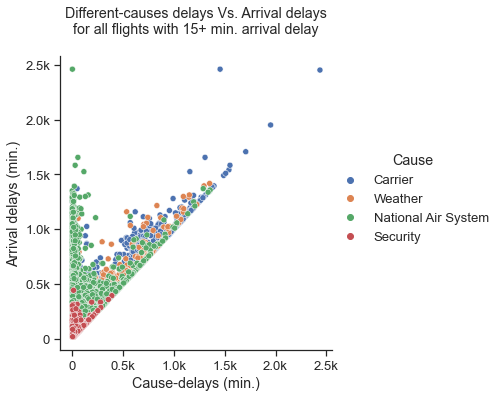

In [23]:
# Different-causes delays Vs. Arrival delays for all flights with 15+ min. arrival delay (polished)

sns.set(font_scale=1.19,style='ticks')
g = sns.PairGrid(melt_15, x_vars='Minutes',y_vars='ArrDelay',
                 hue="Cause",#palette=sns.color_palette(n_colors=4),
                 height=5,aspect=1)
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

plt.title('Different-causes delays Vs. Arrival delays\nfor all flights with 15+ min. arrival delay\n')
plt.xlabel('Cause-delays (min.)')
plt.ylabel('Arrival delays (min.)')

yticklabels = [str(n/1000) + 'k' for n in g.axes[0][0].get_yticks()]
yticklabels = [label.replace('0.0k','0') for label in yticklabels]
g.axes[0,0].set_yticklabels(labels = yticklabels)

xticklabels = [str(n/1000) + 'k' for n in g.axes[0][0].get_xticks()]
xticklabels = [label.replace('0.0k','0') for label in xticklabels]
g.axes[0,0].set_xticklabels(labels = xticklabels);

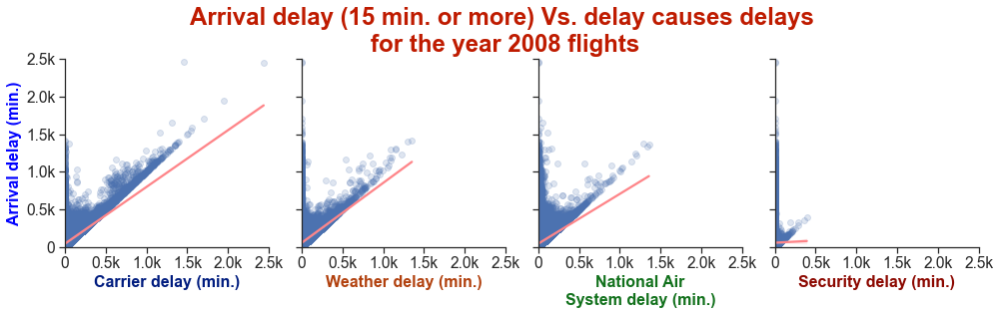

In [24]:
# Arrival Delay Vs. delay causes
# for the flight data points of 15 minutes ArrDelay or more (1,524,733  rows)
# limiting to delays to 2500 minutes

sns.set(font_scale=1.19,style='ticks')

g = sns.PairGrid(data = df_inv_15[~zeros_mask],
                 x_vars = delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True,height=3.5)

title = 'Arrival delay (15 min. or more) Vs. delay causes delays \nfor the year 2008 flights'

plt.suptitle(title,fontsize=24,color='#BF1B00',weight='bold',y=1.15)

g.map(sns.regplot, scatter_kws={'alpha':1.85/10}, line_kws={"color": "#fe8589"});
g.set(xlim=(0,2500),ylim=(0,2500))

# labeling y axis, adjusting ytick labels
g.axes[0,0].set_ylabel('Arrival delay (min.)',color='blue',fontsize=16,weight='bold')
g.axes[0,0].set_yticks(ticks = np.arange(0,3,0.5)*1000)
yticklabels = [0] + [str(n/1000) + 'k' for n in g.axes[0][0].get_yticks()[1:]]
g.axes[0,0].set_yticklabels(labels = yticklabels,fontsize=15.5)

# labeling x axes, coloring x axes labels, adjusting xtick labels
colors = (color for color in list(sns.color_palette('dark')))
for i in range(4):
    g.axes[0][i].set_xlabel(causes[i]+ ' delay (min.)',color=next(colors),weight='bold',fontsize=16)#;sns.color_palette()[i],
    g.axes[0,i].set_xticks(ticks = np.arange(0,3,0.5)*1000)
    xticklabels = [0] + [str(n/1000) + 'k' for n in g.axes[0][i].get_xticks()[1:]]
    g.axes[0,i].set_xticklabels(xticklabels,fontsize=15.5);

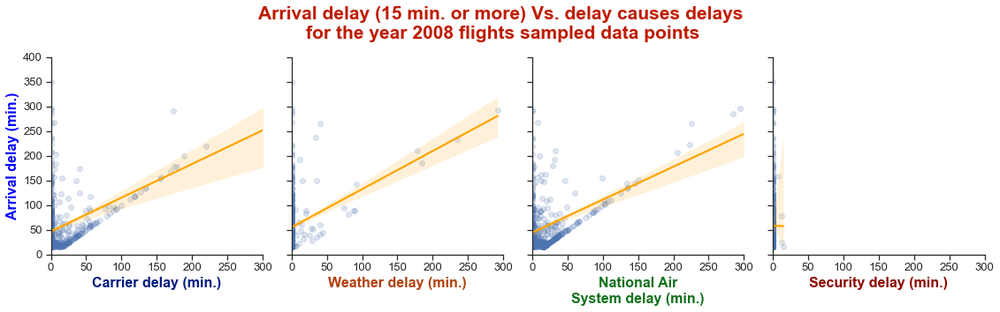

In [25]:
# plots of Arrival Delay Vs. delay causes
# for the 500 flights data points sample df_inv_15_samp (500 rows)
# limiting visualizing delays to 250 minutes

#sns.set(font_scale=1.19,style='ticks')

g = sns.PairGrid(data = df_inv_15_samp[~samp_zeros_mask],
                 x_vars=delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True, height=4)
suptitle = 'Arrival delay (15 min. or more) Vs. delay causes delays \nfor the year 2008 flights sampled data points'

plt.suptitle(suptitle,fontsize=21,color='#BF1B00',weight='bold',y=1.15)

g.map(sns.regplot, scatter_kws={'alpha':1.85/10}, line_kws={"color": "orange"});
g.set(xlim=(0,300),ylim=(0,400))
g.axes[0,0].set_ylabel('Arrival delay (min.)',color='blue',weight='bold',fontsize=16)

for i in range(4):
    g.axes[0][i].set_xlabel(causes[i]+ ' delay (min.)',color=sns.color_palette('dark')[i],weight='bold',fontsize=16);

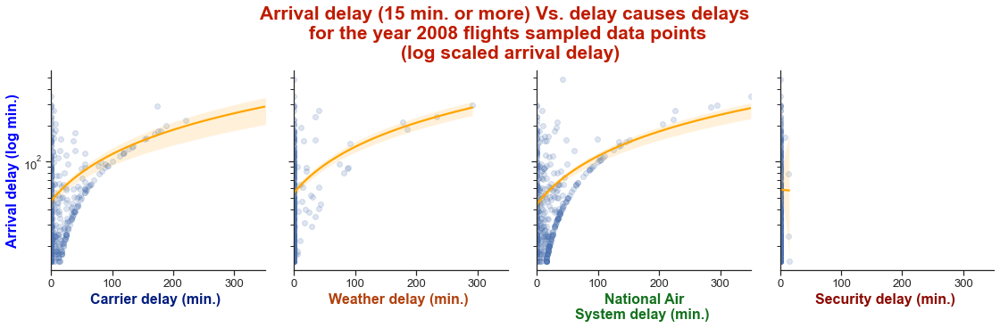

In [26]:
# plots of Arrival Delay Vs. delay causes
# for the 500 flights data points sample df_inv_15_samp (500 rows)
# limiting visualizing delays to 250 minutes
# with arrival delay log scale

sns.set(font_scale=1.19,style='ticks')

g = sns.PairGrid(data = df_inv_15_samp[~samp_zeros_mask],
                 x_vars=delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True, height=4)
title = 'Arrival delay (15 min. or more) Vs. delay causes delays \nfor the year 2008 flights sampled data points' 

plt.suptitle(title+'\n (log scaled arrival delay)',fontsize=21,color='#BF1B00',weight='bold',y=1.2)
g.map(sns.regplot, scatter_kws={'alpha':1.85/10}, line_kws={"color": "orange"});
# log scale
g.set(yscale='log',xlim=(0,350))#,xscale='log');

g.axes[0,0].set_ylabel('Arrival delay (log min.)',color='blue',weight='bold',fontsize=16)

for i in range(4):
    g.axes[0][i].set_xlabel(causes[i]+ ' delay (min.) ',color=sns.color_palette('dark')[i],weight='bold',fontsize=16);

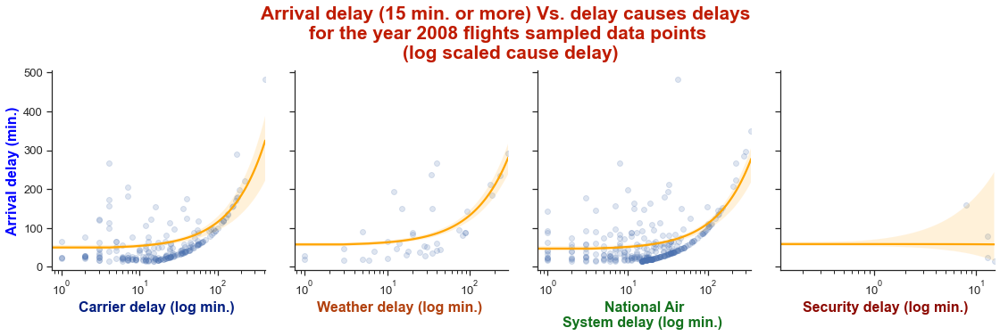

In [27]:
# plots of Arrival Delay Vs. delay causes
# for the 500 flights data points sample df_inv_15_samp (500 rows)
# limiting visualizing delays to 250 minutes
# with log scaled cause delay

sns.set(font_scale=1.19,style='ticks')

g = sns.PairGrid(data = df_inv_15_samp[~samp_zeros_mask],
                 x_vars=delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True, height=4)
title = 'Arrival delay (15 min. or more) Vs. delay causes delays \nfor the year 2008 flights sampled data points' 

plt.suptitle(title+'\n (log scaled cause delay)',fontsize=21,color='#BF1B00',weight='bold',y=1.2)
g.map(sns.regplot, scatter_kws={'alpha':1.85/10}, line_kws={"color": "orange"});
# log scale
g.set(xscale='log')#,yscale='log');

g.axes[0,0].set_ylabel('Arrival delay (min.)',color='blue',weight='bold',fontsize=16)

for i in range(4):
    g.axes[0][i].set_xlabel(causes[i]+ ' delay (log min.) ',color=sns.color_palette('dark')[i],weight='bold',fontsize=16);

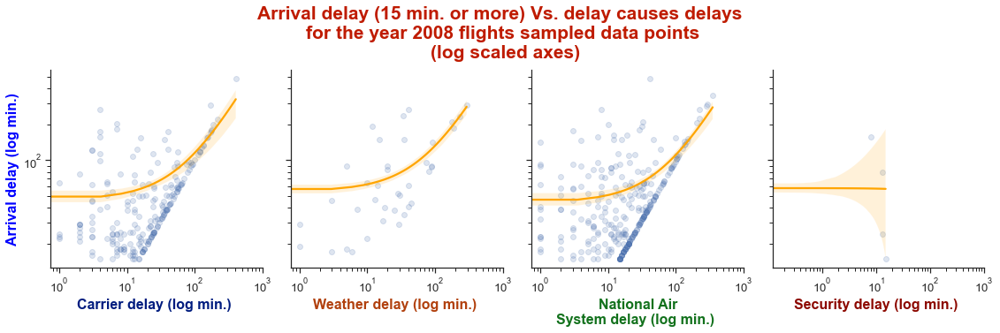

In [28]:
# plots of Arrival Delay Vs. delay causes
# for the 500 flights data points sample df_inv_15_samp (500 rows)
# limiting visualizing delays to 250 minutes
# with log scaled axes

sns.set(font_scale=1.19,style='ticks')

g = sns.PairGrid(data = df_inv_15_samp[~samp_zeros_mask],
                 x_vars=delay_causes_cols,
                 y_vars = 'ArrDelay',
                 despine=True, height=4)
title = 'Arrival delay (15 min. or more) Vs. delay causes delays \nfor the year 2008 flights sampled data points' 

plt.suptitle(title+'\n (log scaled axes)',fontsize=21,color='#BF1B00',weight='bold',y=1.2)
g.map(sns.regplot, scatter_kws={'alpha':1.85/10}, line_kws={"color": "orange"});

# log scale
g.set(xscale='log',yscale='log',xlim=(0,10**3))

g.axes[0,0].set_ylabel('Arrival delay (log min.)',color='blue',weight='bold',fontsize=16)

for i in range(4):
    g.axes[0][i].set_xlabel(causes[i]+ ' delay (log min.) ',color=sns.color_palette('dark')[i],weight='bold',fontsize=16);

## <font color='#AD1FFF'>7<sup>th</sup></font> <font color='#5FB1FF'>Correlation between Arrival delays and delay causes delays</font> <a id='7th'></a>

- **In general, arrival delays had more stronger moderate correlation with carrier-delays**, than the moderate one between arrival delays and NAS-delays.
    
    
- Multivariate investigation assures the **stronger moderate correlation between arrival delays and carrier delays which was about positive 0.551**; than the **moderate one between arrival delays and NAS delays** which was positive 0.380**; and than the **weaker one between arrival delays and weather delays** which was positive 0.286. However, **The correlation between arrival delays and security delays was almost nonexistent**, where the correlation was positive 0.002.


- Before investigation, it could be possible to think of arrival delays to have at least the highest correlation with weather delays. However, it wasn't the truth by the investigation. **'Carrier' and 'NAS'-delays had more higher correlation than 'Weather'-delays with arrival delays**.

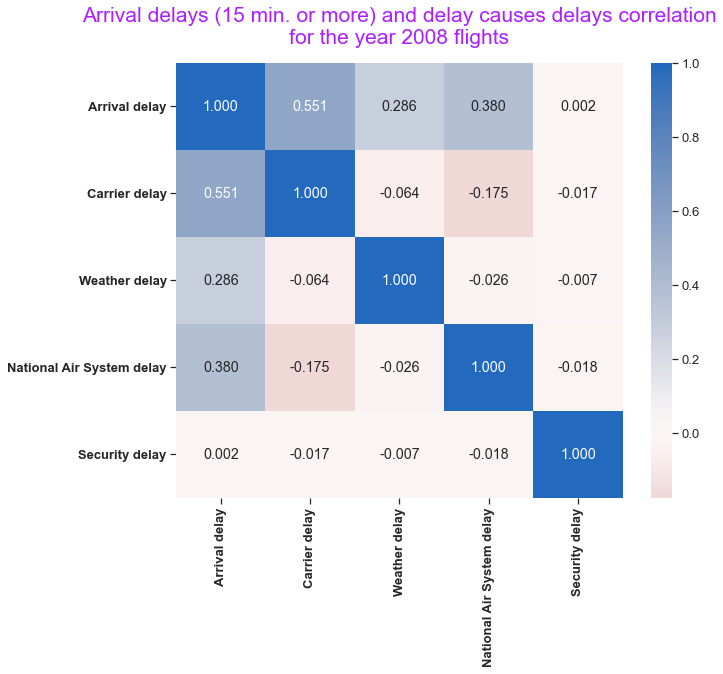

In [29]:
# correlation plot for ArrDelay and delay causes,
# for arrival delays of 15 minutes or more df_inv_15 (1,524,733 rows)

delays_cols = ['ArrDelay','CarrierDelay','WeatherDelay','NASDelay','SecurityDelay']
plt.figure(figsize = [10, 8])
ax = sns.heatmap(df_inv_15[~zeros_mask][delays_cols].corr(),
                annot = True, fmt = '.3f',
                cmap = 'vlag_r', center = 0)

plt.title('Arrival delays (15 min. or more) and delay causes delays correlation\nfor the year 2008 flights',
          fontsize=21,color='#AD1FFF',y=1.03)

ticklabels=['Arrival delay','Carrier delay','Weather delay','National Air System delay','Security delay']
ax.set_xticklabels(labels=ticklabels,rotation=90,fontsize=13,weight='bold')
ax.set_yticklabels(labels=ticklabels,rotation=0,fontsize=13,weight='bold');

## <font color='#AD1FFF'>8<sup>th</sup></font> <font color='#5FB1FF'>Flights frequencies and proportions per Months </font> <a id='8th'></a>

- **All 2008 months had close-ratios of recorded total flights frequencies**, starting from about 7.5% up to about 9%. However, 9 months had close-ratios of flights delayed for 15+ minutes. 6 months had the ratios from about 9% up to 11%, and 3 others had a ratio about 8%.
        

In [30]:
# creating 'prop' dataframe and sorting by total flights
prop_month = df_inv['Month'].value_counts().to_frame('Flights').sort_values('Flights',ascending=False)

prop_month['On-time'] = df_inv[(df_inv.ArrDelay < 15) & (~df_inv.ArrDelay.isna())]['Month'].value_counts()
prop_month['On-time prop (per month flights)'] = round(100 * prop_month['On-time'] / prop_month['Flights'],2)
prop_month['On-time prop (per month flights)'] = prop_month['On-time prop (per month flights)'].astype('str') + ' %'

prop_month['Delayed'] = df_inv_15['Month'].value_counts()
prop_month['Del. prop (per month flights)'] = round(100 * prop_month['Delayed'] / prop_month['Flights'],2)
prop_month['Del. prop (per month flights)'] = prop_month['Del. prop (per month flights)'].astype('str') + ' %'

prop_month['Cancelled'] = airline_cancelled['Month'].value_counts()
prop_month['Canc. prop (per month flights)'] = round(100 * prop_month['Cancelled'] / prop_month['Flights'],2)
prop_month['Canc. prop (per month flights)'] = prop_month['Canc. prop (per month flights)'].astype('str') + ' %'

prop_month['Diverted'] = prop_month['Flights'] - (prop_month['On-time']+prop_month['Delayed']+prop_month['Cancelled'])
prop_month['Div. prop (per month flights)'] = round(100 * prop_month['Diverted'] / prop_month['Flights'],2)
prop_month['Div. prop (per month flights)'] = prop_month['Div. prop (per month flights)'].astype('str') + ' %'
prop_month

,Flights,On-time,On-time prop (per month flights),Delayed,Del. prop (per month flights),Cancelled,Canc. prop (per month flights),Diverted,Div. prop (per month flights)
Jul,627931,475373,75.7 %,140050,22.3 %,10598,1.69 %,1910,0.3 %
Mar,616090,440973,71.58 %,157370,25.54 %,16183,2.63 %,1564,0.25 %
Aug,612279,480269,78.44 %,120481,19.68 %,9835,1.61 %,1694,0.28 %
Jun,608665,431198,70.84 %,164260,26.99 %,10931,1.8 %,2276,0.37 %
May,606293,479084,79.02 %,120126,19.81 %,6229,1.03 %,854,0.14 %
Jan,605765,438323,72.36 %,148807,24.57 %,17308,2.86 %,1327,0.22 %
Apr,598126,464554,77.67 %,122169,20.43 %,10355,1.73 %,1048,0.18 %
Feb,569232,390686,68.63 %,156235,27.45 %,20596,3.62 %,1715,0.3 %
Oct,556205,478554,86.04 %,73517,13.22 %,3249,0.58 %,885,0.16 %
Dec,544958,356100,65.34 %,168647,30.95 %,17779,3.26 %,2432,0.45 %



Hint: Colored lines indicate the Max and Min frequencies


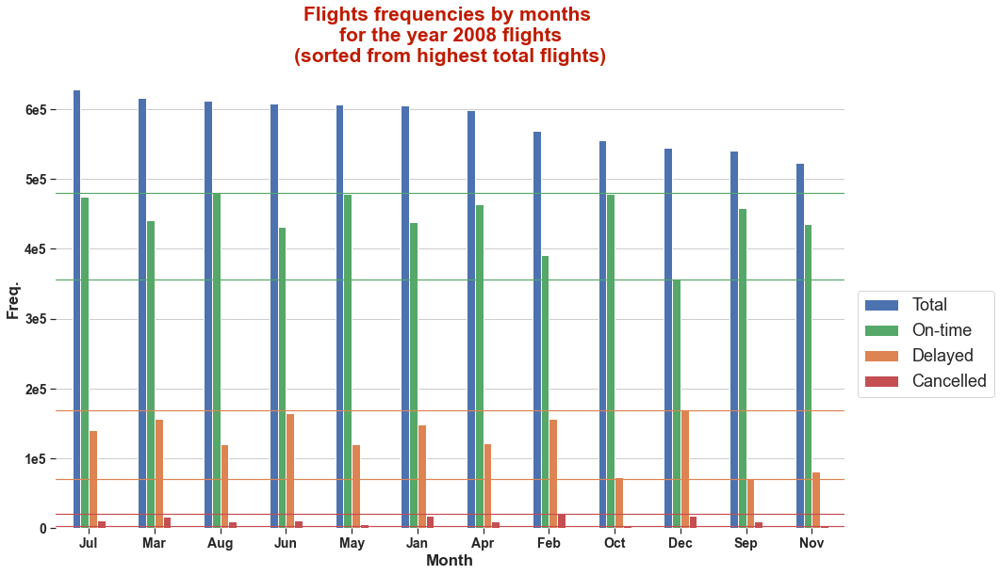

In [31]:
# month_counts.to_frame('Month').rename(columns={'Month':'Flights counts'}).sort_values('Flights counts',ascending=False)

# calculating Flights proportions and counts per each month

# # creating 'prop' dataframe and sorting by total flights
# prop_month = df_inv['Month'].value_counts().to_frame('Flights').sort_values('Flights',ascending=False)

# prop_month['On-time'] = df_inv[(df_inv.ArrDelay < 15) & (~df_inv.ArrDelay.isna())]['Month'].value_counts()
# prop_month['On-time prop (per month flights)'] = round(100 * prop_month['On-time'] / prop_month['Flights'],2)
# prop_month['On-time prop (per month flights)'] = prop_month['On-time prop (per month flights)'].astype('str') + ' %'

# prop_month['Delayed'] = df_inv_15['Month'].value_counts()
# prop_month['Del. prop (per month flights)'] = round(100 * prop_month['Delayed'] / prop_month['Flights'],2)
# prop_month['Del. prop (per month flights)'] = prop_month['Del. prop (per month flights)'].astype('str') + ' %'

# prop_month['Cancelled'] = airline_cancelled['Month'].value_counts()
# prop_month['Canc. prop (per month flights)'] = round(100 * prop_month['Cancelled'] / prop_month['Flights'],2)
# prop_month['Canc. prop (per month flights)'] = prop_month['Canc. prop (per month flights)'].astype('str') + ' %'

# prop_month['Diverted'] = prop_month['Flights'] - (prop_month['On-time']+prop_month['Delayed']+prop_month['Cancelled'])
# prop_month['Div. prop (per month flights)'] = round(100 * prop_month['Diverted'] / prop_month['Flights'],2)
# prop_month['Div. prop (per month flights)'] = prop_month['Div. prop (per month flights)'].astype('str') + ' %'


#### plotting clustered bar chart for flights counts month

colors = [sns.color_palette()[0] , sns.color_palette()[2] , sns.color_palette()[1] , sns.color_palette()[3]] 

prop_month.iloc[:,[0,1,3,5]].plot(kind='bar',figsize=(15,9),rot=0, color=colors)

sns.set(font_scale=1.19,style='ticks')
sns.despine(left=True,bottom=True)

plt.title('Flights frequencies by months \nfor the year 2008 flights\n(sorted from highest total flights)',
          fontsize=21,color='#BF1B00',weight='bold',y=1)

plt.xlabel('Month',fontsize=17,weight='bold')
plt.ylabel('Freq.',fontsize=17,weight='bold')

plt.xticks(fontsize=14,weight='bold')
plt.yticks(np.arange(0,7,1)*10**5,
           [0]+[str(n)+'e5' for n in range(1,7,1)],
           #[0,'1e5','2e5','3e5','4e5','5e5','6e5'],
           fontsize=14,weight='bold')
plt.legend(labels=['Total','On-time','Delayed','Cancelled'],
           #ncol=4,
           loc='center right',bbox_to_anchor=(1.2,.4),#,bbox_to_anchor=(.5,1.047),
           prop={'size':18})
plt.grid(True,axis='y')


# drawing max and min lines
max_min_lines = {'on-time':(480269,356100),
                 'delayed':(168647,71149),
                 'cancelled':(20596,3249)}
colors = (color for color in colors[1:])
for m in max_min_lines:
    color=next(colors)
    max,min = max_min_lines[m]
    plt.axhline(max ,color=color,linewidth=1.2, linestyle ='-')
    plt.axhline(min ,color=color,linewidth=1.2, linestyle ='-');

#'-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'

print('\nHint: Colored lines indicate the Max and Min frequencies')


Hint: Colored lines indicate the Max and Min frequencies


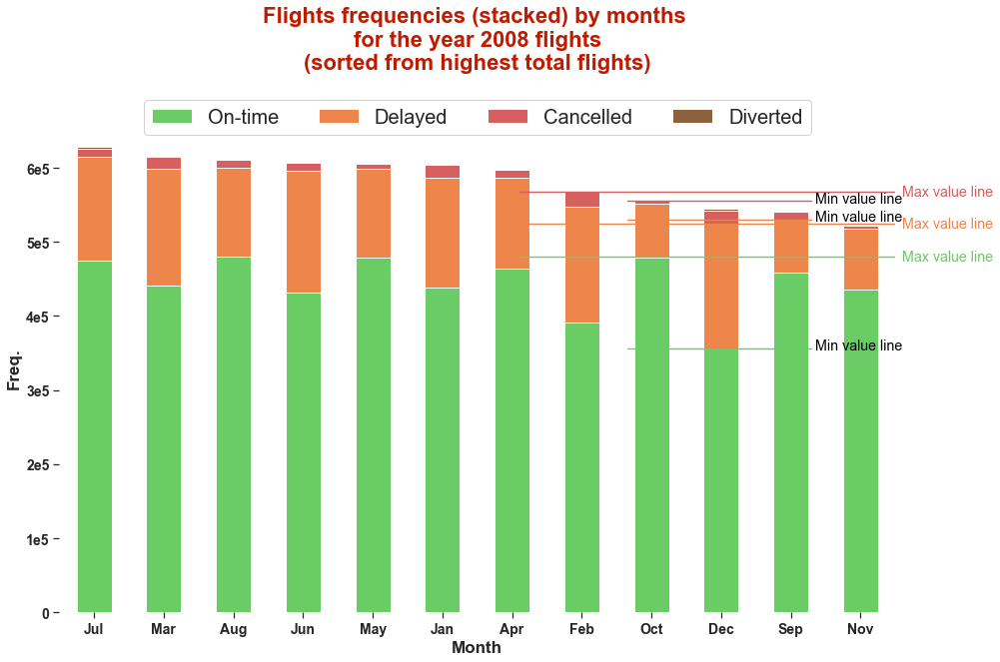

In [32]:

colors = [sns.color_palette('muted')[2],sns.color_palette('muted')[1],
          sns.color_palette('muted')[3],sns.color_palette('muted')[-5]]

prop_month.iloc[:,[1,3,5,7]].plot(kind='bar',figsize=(15,9),rot=0,stacked=True, color=colors)

sns.set(font_scale=1.19,style='ticks')
sns.despine(left=True,bottom=True)

plt.title('Flights frequencies (stacked) by months \nfor the year 2008 flights\n(sorted from highest total flights)',
          fontsize=22,color='#BF1B00',weight='bold',y=1.1)
plt.xlabel('Month',fontsize=17,weight='bold')
plt.ylabel('Freq.',fontsize=17,weight='bold')

plt.xticks(fontsize=14,weight='bold')
plt.yticks(np.arange(0,7,1)*10**5,
           [0]+[str(n)+'e5' for n in range(1,7,1)],
           #[0,'1e5','2e5','3e5','4e5','5e5','6e5'],
           fontsize='14',weight='bold')
plt.legend(loc='upper center',bbox_to_anchor=(.5,1.07),
           fontsize=13,framealpha =.9,
           ncol=4,
           #loc='center right',bbox_to_anchor=(1.2,.4),#,bbox_to_anchor=(.5,1.047),
           prop={'size':20})
#plt.grid(True,axis='y')
#ax.xaxis.tick_top()


# drawing max and min lines
max_min_lines = {'on-time':(480269,356100),
                 'delayed':((168647 + 356100) , (71149+459127))  ,
                 'cancelled':((20596 + 156235 + 390686) , (3249 + 73517+478554))
                }

color_gen = (color for color in colors)
    
for flights in max_min_lines:
    max,min = max_min_lines[flights]
    
    color=next(color_gen)
    
    plt.axhline(max,color=color,xmin=.55,linewidth=1.4,linestyle ='-')
    plt.text(11.6,max,'Max value line',color=color,va='center')
    
    plt.axhline(min,color=color,xmin=.68,xmax=.899,linewidth=1.4,linestyle ='-')
    plt.text(10.35,min+3500,'Min value line',color='black',va='center') 

print('\nHint: Colored lines indicate the Max and Min frequencies')

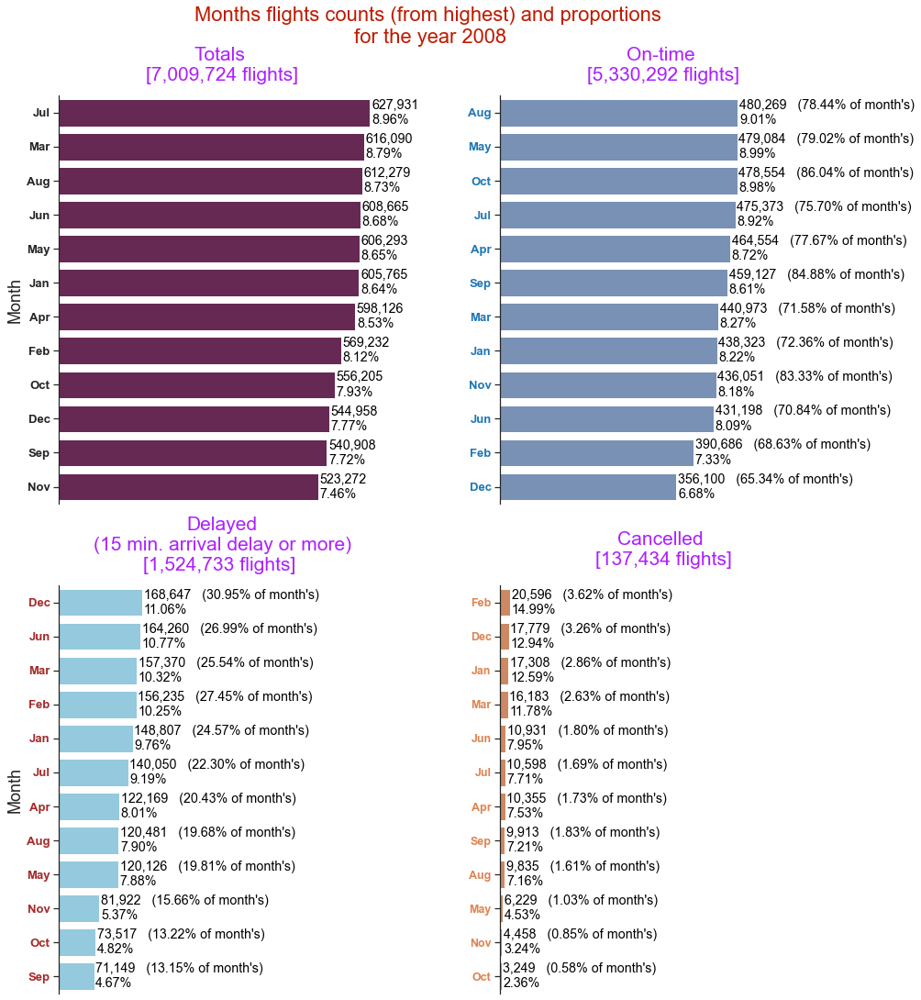

In [33]:
# Months against flights counts
# for the whole data points df_inv (7,009,728 rows), against on_time (5,330,292 rows),
# df_inv_15 (1,524,733  rows) , airline_cancelled (137,434 rows)

fig , ax = plt.subplots(2,2,sharex=True,figsize=(15,18))
#ax = ax.flatten()

plt.suptitle('Months flights counts (from highest) and proportions \nfor the year 2008',
             fontsize=22,color='#BF1B00',
             #x=.45,
            y=.955)#y=1.08)
# first subplot

# Total flights per months
ax[0,0] = plt.subplot(2,2,1)

month_counts = df_inv['Month'].value_counts()

sns.countplot(data = df_inv, y = 'Month',
              order = month_counts.index,
              color = sns.color_palette('rocket')[1],
              #sns.color_palette('vlag')[-1],#sns.color_palette('rocket')[0],#default_color,
              ax=ax[0,0])
sns.set(font_scale=1.19,style='white')

sns.despine(bottom=True)

plt.title('Totals \n[7,009,724 flights]',fontsize=21,color='#AD1FFF',y=1.023)#x=.45,y=1.0365)
plt.xlabel('')
plt.ylabel('Month',fontsize=18)#weight='bold',

plt.xticks([])

# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = month_counts[label.get_text()]
    
    percentage_total = 100*count/7009724
    
    string = str(f"{count:,}") + "\n{:0.2f}%".format(percentage_total) #+ ' flights'
    
    # print the annotation next to the bar
    plt.text(count+3000, loc, s= string, va = 'center', color = 'black');

    
#########    
# second subplot

# on-time flights by Months 
ax[0,1] = plt.subplot(2,2,2)

month_counts = on_time['Month'].value_counts()

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

sns.countplot(data = on_time, y = 'Month',
              order = month_counts.index,
              color = sns.color_palette('vlag')[0],#sns.color_palette('viridis')[-3],# 'skyblue',
              ax=ax[0,1])

plt.title('On-time \n[5,330,292 flights]',fontsize=21,color='#AD1FFF',y=1.023)#,x=.25

plt.xlabel('')
plt.ylabel('')
#plt.ylabel('Month',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = default_color)

# Recalculating the total flights counts for months

month_flights_count_whole = df_inv['Month'].value_counts()   # to be used in calculating percentages of month flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against month total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = month_counts[label.get_text()]
    count_whole = month_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/5330292
    
    string = str(f"{count:,}") + "   ({:0.2f}% of month's)\n{:0.2f}%".format(percentage_value,percentage_total)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');
    
##################################    
# third subplot

# delayed flights by Months
ax[1,0] = plt.subplot(2,2,3)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

month_counts  = df_inv_15['Month'].value_counts()

sns.countplot(data = df_inv_15, y = 'Month',
              order = month_counts.index,
              color = 'skyblue',
              ax=ax[1,0])

plt.title('Delayed\n(15 min. arrival delay or more)\n[1,524,733 flights] ',fontsize=21,color='#AD1FFF',y=1.023)
#,x=.45,y=1.0365)
          #,y=1.023)#,x=.25

plt.xlabel('')
plt.ylabel('')
plt.ylabel('Month',fontsize=18)#weight='bold',

plt.xticks([])
plt.yticks(color = 'brown')

# Recalculating the total flights counts for months

month_flights_count_whole = df_inv['Month'].value_counts()   # to be used in calculating percentages of month flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against month total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = month_counts[label.get_text()]
    count_whole = month_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/1524733
    
    string = str(f"{count:,}") + "   ({:0.2f}% of month's)\n{:0.2f}%".format(percentage_value,percentage_total)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');
#################
# fourth subplot

# cancelled flights by Months
ax[1,1] = plt.subplot(2,2,4)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

month_counts = airline_cancelled['Month'].value_counts()

sns.countplot(data = airline_cancelled ,
              y = 'Month',
              order = month_counts.index,
              color = sns.color_palette()[1],
              ax=ax[1,1])

plt.title('Cancelled \n[137,434 flights]',fontsize=21,color='#AD1FFF',y=1.0365)#x=.45,y=1.0365)#x=.205,y=1.0365)

plt.xlabel('')
plt.ylabel('')
#plt.ylabel('Month',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = sns.color_palette()[1],fontsize=12.5)

# Recalculating the total flights counts for months

month_flights_count_whole = df_inv['Month'].value_counts()   # to be used in calculating percentages of month flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against month total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = month_counts[label.get_text()]
    count_whole = month_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/137434
    
    string = str(f"{count:,}") + "   ({:0.2f}% of month's)\n{:0.2f}%".format(percentage_value,percentage_total)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');#,fontsize=12.5);

######### 
plt.subplots_adjust(wspace=0.35);

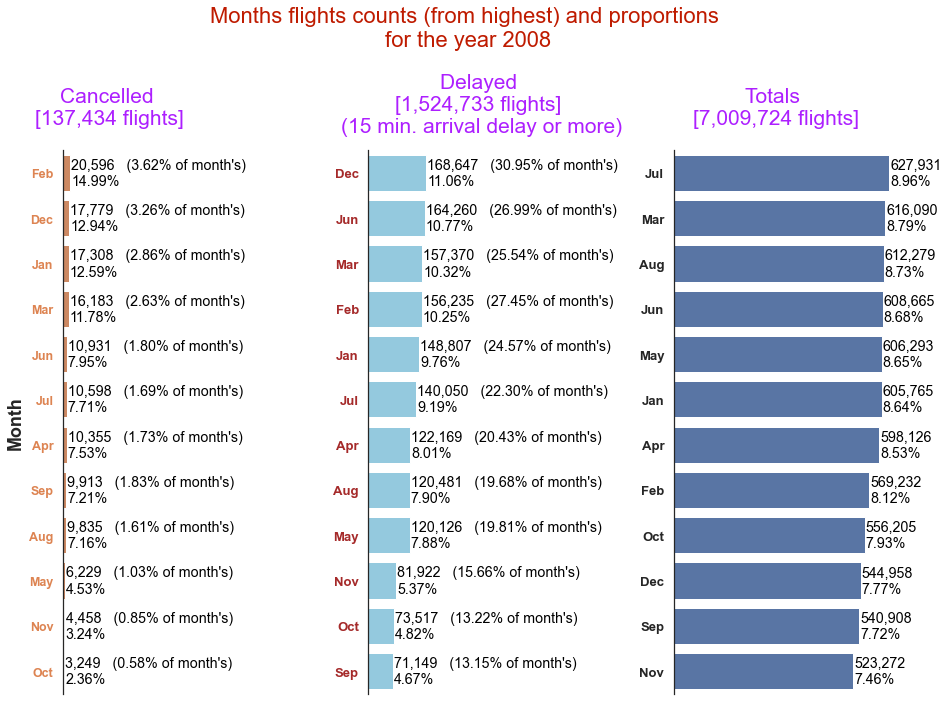

In [34]:
# Months against flights counts
# for the whole data points df_inv (7,009,728 rows),
# against df_inv_15 (1,524,733  rows) , airline_cancelled (137,434 rows)

default_color = sns.color_palette()[0]

fig, ax = plt.subplots(1, 3, sharex=True,figsize=(15,10))

plt.suptitle('Months flights counts (from highest) and proportions \nfor the year 2008',
             fontsize=22,color='#BF1B00',
             #x=.45,
             y=1.08)
# first subplot
ax[0] = plt.subplot(1,3,1)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

month_counts = airline_cancelled['Month'].value_counts()

sns.countplot(data = airline_cancelled ,
              y = 'Month',
              order = month_counts.index,
              color = sns.color_palette()[1],
              ax=ax[0])

plt.title('Cancelled \n[137,434 flights]',fontsize=21,color='#AD1FFF',x=.205,y=1.0365)

plt.xlabel('')
plt.ylabel('Month',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = sns.color_palette()[1],fontsize=12.5)

# Recalculating the total flights counts for months

month_flights_count_whole = df_inv['Month'].value_counts()   # to be used in calculating percentages of month flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against month total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = month_counts[label.get_text()]
    count_whole = month_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/137434
    
    string = str(f"{count:,}") + "   ({:0.2f}% of month's)\n{:0.2f}%".format(percentage_value,percentage_total)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');#,fontsize=12.5);
    
##################################    
# second subplot
ax[1] = plt.subplot(1,3,2)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

month_counts = df_inv_15['Month'].value_counts()

sns.countplot(data = df_inv_15, y = 'Month',
              order = month_counts.index,
              color = 'skyblue',
              ax=ax[1])

plt.title('Delayed \n[1,524,733 flights] \n(15 min. arrival delay or more)',fontsize=21,color='#AD1FFF',y=1.023)#,x=.25

plt.xlabel('')
plt.ylabel('')
#plt.ylabel('Carrier',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = 'brown')

# Recalculating the total flights counts for months

month_flights_count_whole = df_inv['Month'].value_counts()   # to be used in calculating percentages of month flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against month total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = month_counts[label.get_text()]
    count_whole = month_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/1524733
    
    string = str(f"{count:,}") + "   ({:0.2f}% of month's)\n{:0.2f}%".format(percentage_value,percentage_total)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');
    
##################################    
# third subplot
ax[2] = plt.subplot(1,3,3)

month_counts = df_inv['Month'].value_counts()

sns.countplot(data = df_inv, y = 'Month',
              order = month_counts.index,
              color = default_color,
              ax=ax[2])
sns.set(font_scale=1.19,style='white')

sns.despine(bottom=True)

plt.title('Totals \n[7,009,724 flights]',fontsize=21,color='#AD1FFF',x=.45,y=1.0365)
plt.xlabel('')
plt.ylabel('')

plt.xticks([])

# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = month_counts[label.get_text()]
    
    percentage_total = 100*count/7009724
    
    string = str(f"{count:,}") + "\n{:0.2f}%".format(percentage_total) #+ ' flights'
    
    # print the annotation next to the bar
    plt.text(count+3000, loc, s= string, va = 'center', color = 'black');

    
#########    
plt.subplots_adjust(wspace=0.35);

    #if percentage_value >;
#plt.yticks([])
# y=.99
# y=1.0365
# y=1.023
# y=1.0365

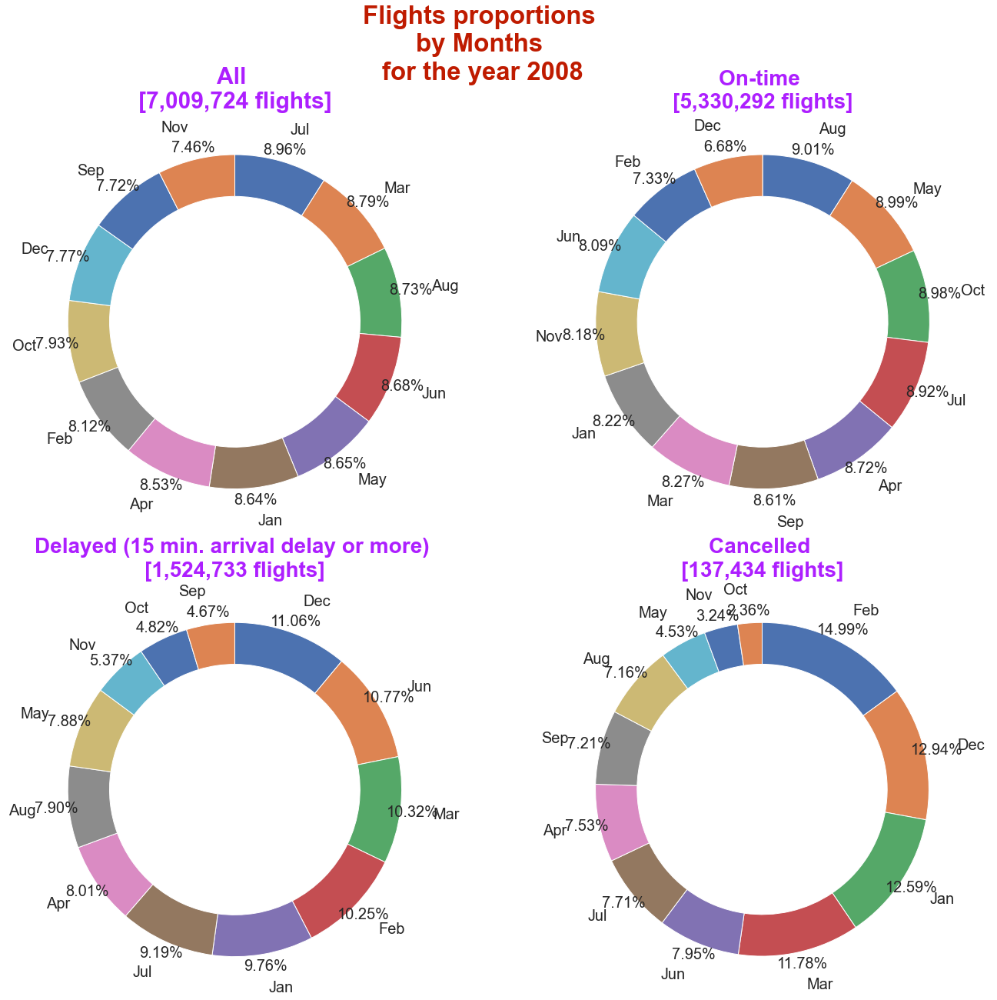

In [35]:
# Flights proportions by Months donut plots
plt.subplots(2,2)#,sharex=True,sharey=True)

plt.suptitle("Flights proportions \nby Months \nfor the year 2008",color='#BF1B00',fontsize=33,weight='bold', y=1)

plt.subplot(221)
# Total flights proportions by Months 
plt.title("All \n[7,009,724 flights]",color='#AD1FFF',y=1.068, fontsize=30,weight='bold')

month_counts = df_inv['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(23,20),pctdistance=1.073, labeldistance=1.197,wedgeprops = {'width' : .25},#radius=7.5,
                    label='',#labels=n_list,
                    counterclock=False,startangle=90,
                    #explode=(0.1, 0.1, 0.1, 0.1),
                    autopct="%1.2f%%", colors=sns.color_palette(),fontsize=20)
plt.axis("equal")


plt.subplot(222)
# Total on-time flights proportions by Months 

plt.title("On-time \n[5,330,292 flights]" ,color='#AD1FFF', y=1.068,fontsize=28,weight='bold')

month_counts = on_time['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(23,20),pctdistance=1.073, labeldistance=1.2,wedgeprops = {'width' : .25},##radius=7.5,
                    label='',#labels=n_list,
                    counterclock=False,startangle=90,
                    #explode=(0.1, 0.1, 0.1, 0.1),
                    autopct="%1.2f%%", colors=sns.color_palette(),fontsize=20)
plt.axis("equal");

plt.subplot(223)
# Total delayed flights proportions by Months 
plt.title("Delayed (15 min. arrival delay or more) \n[1,524,733 flights]", color='#AD1FFF',y=1.068, fontsize=28,weight='bold')

month_counts = df_inv_15['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(23,20),pctdistance=1.073, labeldistance=1.2,wedgeprops = {'width' : .25},##radius=7.5,
                    label='',#labels=n_list,
                    counterclock=False,startangle=90,
                    #explode=(0.1, 0.1, 0.1, 0.1),
                    autopct="%1.2f%%", colors=sns.color_palette(),fontsize=20)
plt.axis("equal")

plt.subplot(224)
# Total cancelled flights proportions by Months 

plt.title("Cancelled \n[137,434 flights]" ,color='#AD1FFF', y=1.068,fontsize=28,weight='bold')

month_counts = airline_cancelled['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(23,20),pctdistance=1.073, labeldistance=1.2,wedgeprops = {'width' : .25},##radius=7.5,
                    label='',#labels=n_list,
                    counterclock=False,startangle=90,
                    #explode=(0.1, 0.1, 0.1, 0.1),
                    autopct="%1.2f%%", colors=sns.color_palette(),fontsize=20)
plt.axis("equal")

plt.subplots_adjust(wspace=.15,hspace=.27);


In [36]:
print('\nYear 2008 flights aggregated counts and proportions per Months\n\n(sorted from the highest total flights of month)')

prop_month

# columns are sorted by total flights number of month


Year 2008 flights aggregated counts and proportions per Months

(sorted from the highest total flights of month)


,Flights,On-time,On-time prop (per month flights),Delayed,Del. prop (per month flights),Cancelled,Canc. prop (per month flights),Diverted,Div. prop (per month flights)
Jul,627931,475373,75.7 %,140050,22.3 %,10598,1.69 %,1910,0.3 %
Mar,616090,440973,71.58 %,157370,25.54 %,16183,2.63 %,1564,0.25 %
Aug,612279,480269,78.44 %,120481,19.68 %,9835,1.61 %,1694,0.28 %
Jun,608665,431198,70.84 %,164260,26.99 %,10931,1.8 %,2276,0.37 %
May,606293,479084,79.02 %,120126,19.81 %,6229,1.03 %,854,0.14 %
Jan,605765,438323,72.36 %,148807,24.57 %,17308,2.86 %,1327,0.22 %
Apr,598126,464554,77.67 %,122169,20.43 %,10355,1.73 %,1048,0.18 %
Feb,569232,390686,68.63 %,156235,27.45 %,20596,3.62 %,1715,0.3 %
Oct,556205,478554,86.04 %,73517,13.22 %,3249,0.58 %,885,0.16 %
Dec,544958,356100,65.34 %,168647,30.95 %,17779,3.26 %,2432,0.45 %


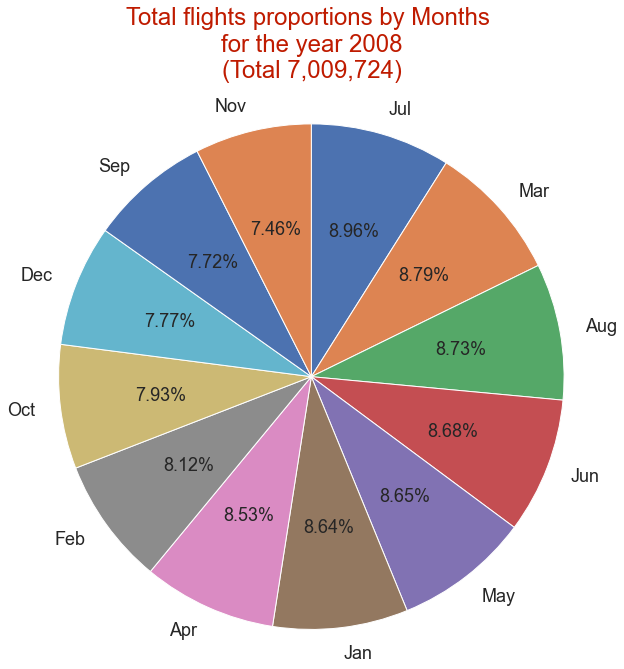

In [37]:
# Total flights proportions by Months 

month_counts = df_inv['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(10,10),radius=1.5,
                  label='',#labels=n_list,
                  counterclock=False,startangle=90,
                  #explode=(0.1, 0.1, 0.1, 0.1),
                  autopct="%1.2f%%", colors=sns.color_palette(),fontsize=18)

plt.title("Total flights proportions by Months \nfor the year 2008\n(Total 7,009,724)",y=1.04, color='#BF1B00', fontsize=24)
plt.axis("equal");

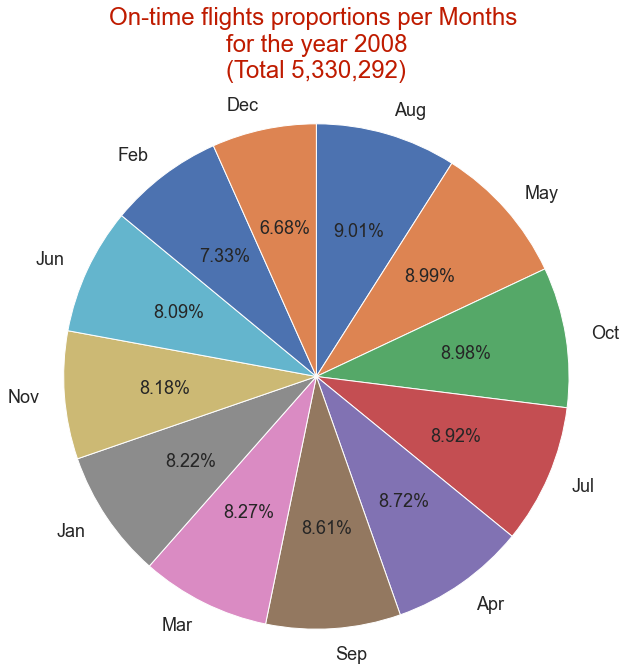

In [38]:
# Total flights proportions by Months 

month_counts = on_time['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(10,10),radius=1.5,
                  label='',#labels=n_list,
                  counterclock=False,startangle=90,
                  #explode=(0.1, 0.1, 0.1, 0.1),
                  autopct="%1.2f%%", colors=sns.color_palette(),fontsize=18)

plt.title("On-time flights proportions per Months \nfor the year 2008\n(Total 5,330,292)",y=1.04, color='#BF1B00', fontsize=24)
plt.axis("equal");

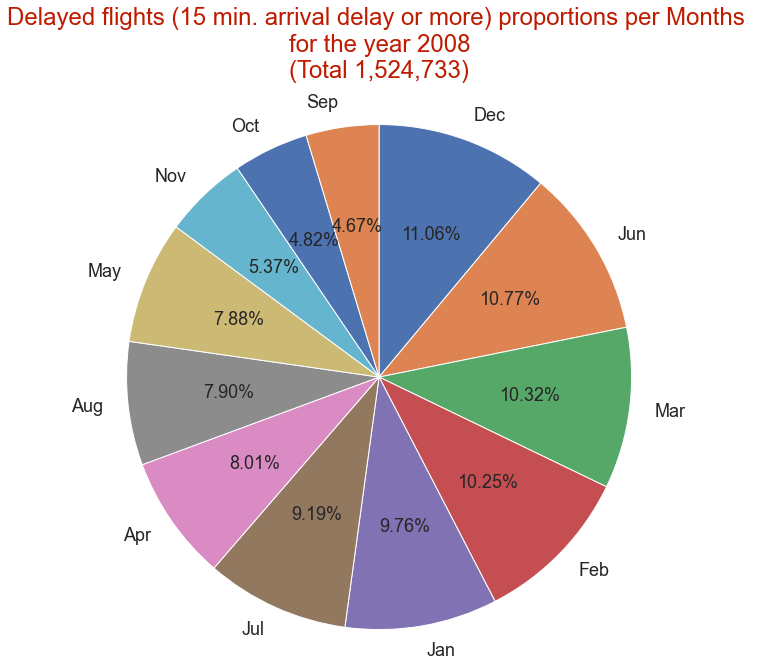

In [39]:
# Total delayed flights proportions by Months 

month_counts = df_inv_15['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(10,10),radius=1.5,
                  label='',#labels=n_list,
                  counterclock=False,startangle=90,
                  #explode=(0.1, 0.1, 0.1, 0.1),
                  autopct="%1.2f%%", colors=sns.color_palette(),fontsize=18)

plt.title("Delayed flights (15 min. arrival delay or more) proportions per Months \nfor the year 2008\n(Total 1,524,733)",
          y=1.04, color='#BF1B00', fontsize=24)
plt.axis("equal");

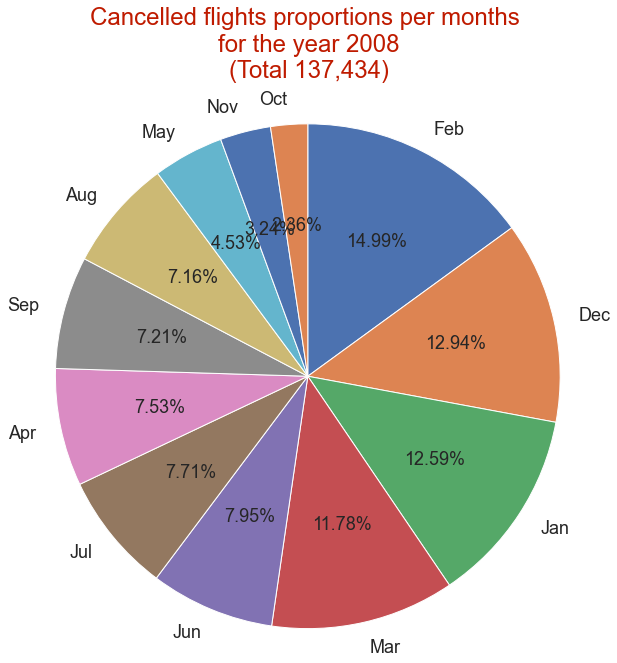

In [40]:
# Total cancelled flights proportions by Months 

month_counts = airline_cancelled['Month'].value_counts()

month_counts.plot(kind='pie',figsize=(10,10),radius=1.5,
                  label='',#labels=n_list,
                  counterclock=False,startangle=90,
                  #explode=(0.1, 0.1, 0.1, 0.1),
                  #pctdistance=.8,
                  autopct="%1.2f%%", colors=sns.color_palette(),fontsize=18)

plt.title("Cancelled flights proportions per months \nfor the year 2008\n(Total 137,434)",y=1.04, color='#BF1B00', fontsize=24)
plt.axis("equal");

## <font color='#AD1FFF'>9<sup>th</sup></font> <font color='#5FB1FF'>Flights-cancellation per Months</font> <a id='9th'></a>

- **Months 'Feb', 'Dec', 'Jan', and 'Mar', had the highest flights-cancellation counts** exceeding 16.1k up to about 20.6k flights during year 2008. However, **'May', 'Nov', and 'Oct' had the lowest flights-cancellation counts** from about 3.25k to about 6.23k flights amongst the other months.


- **'Feb' exceeded in the ratio of cancelled flights**, with about 15% of total 2008 cancelled flights. **Then 'Dec' and 'Jan'** respectively with about 13%. All of **these months are notable to be of 'Winter' season** and its hard weather.

        

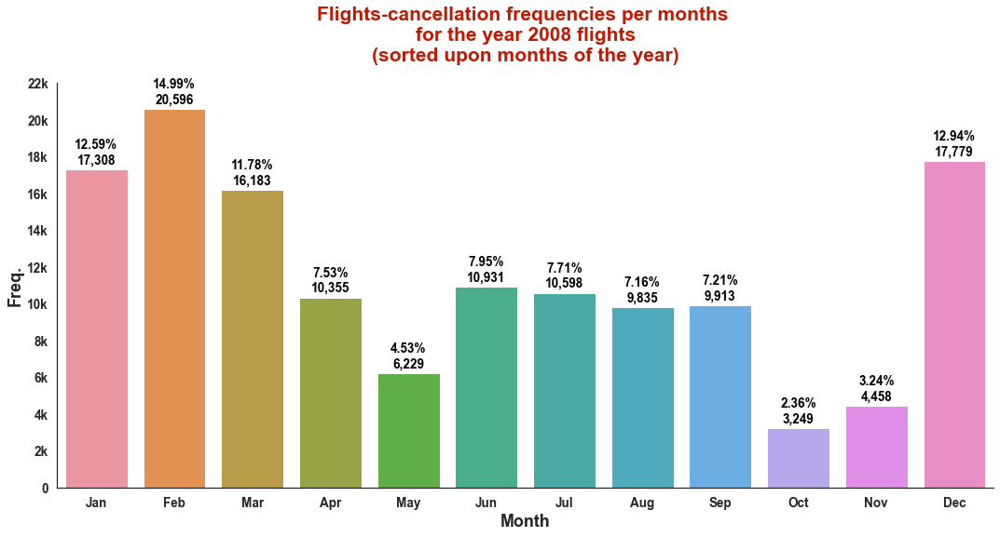

In [41]:
# Months Vs. flight cancellation times

plt.figure(figsize=(18,8))

ax = sns.countplot(data=airline_cancelled,
                   x='Month',# order = airline_cancelled['Month'].value_counts().index,
                   #hue='CancellationCode',hue_order=['A','B','C','D'],
                  )#palette='pastel');
sns.despine()

title = 'Flights-cancellation frequencies per months \nfor the year 2008 flights'
plt.title(title + '\n(sorted upon months of the year)',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)

plt.xlabel('Month',fontsize=18,weight='bold')
plt.ylabel('Freq.',fontsize=18,weight='bold')

plt.xticks(fontsize=13.5,weight='bold')
plt.yticks(np.arange(0,23,2)*1000,
           [0]+[str(int(n))+'k' for n in np.arange(2,23,2)],
           #[0,'2k','4k','6k','8k','10k','12k','14k','16k','18k','20k','22k'],
           fontsize=13.5,weight='bold')

#plt.grid(True,axis='y')

months_canc = airline_cancelled['Month'].value_counts()

# get the current tick locations and labels
locs, labels = plt.xticks() 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = months_canc[label.get_text()]
    
    percentage_total = 100*count/137434
    
    string =  "{:0.2f}%\n{:,}".format(percentage_total,count) #+ str(f"{count:,}")
    
    # print the annotation next to the bar
    plt.text(loc, count+300, s=string, ha = 'center', color = 'black',fontsize=13.5,weight='bold');

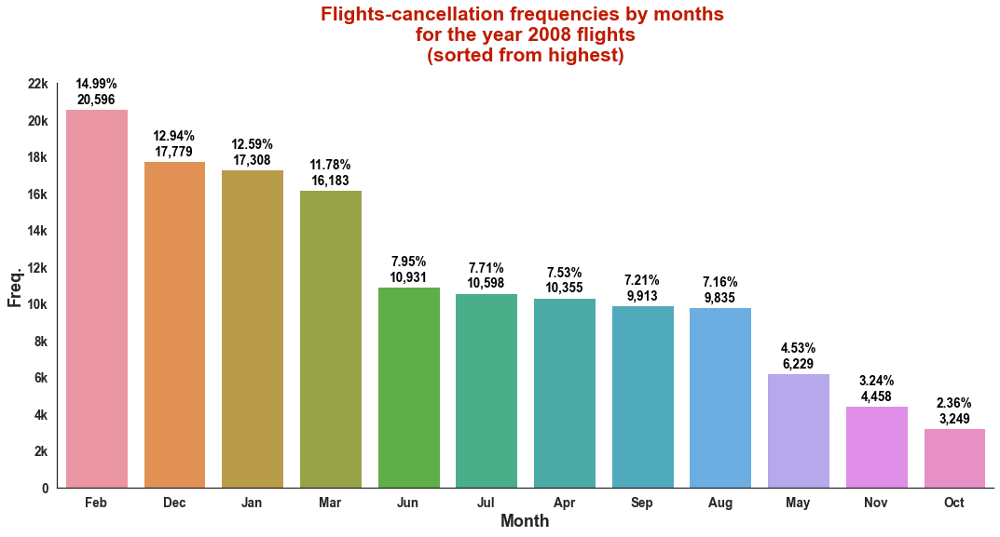

In [42]:
# Months Vs. flight cancellation times

plt.figure(figsize=(18,8))

ax = sns.countplot(data=airline_cancelled,
                   x='Month', order = airline_cancelled['Month'].value_counts().index,
                   #hue='CancellationCode',hue_order=['A','B','C','D'],
                  )#palette='pastel');
sns.despine()

plt.title('Flights-cancellation frequencies by months \nfor the year 2008 flights\n(sorted from highest)',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)

plt.xlabel('Month',fontsize=18,weight='bold')
plt.ylabel('Freq.',fontsize=18,weight='bold')

plt.xticks(fontsize=13.5,weight='bold')
plt.yticks(np.arange(0,23,2) * 1000,
           [0]+[str(n)+'k' for n in np.arange(2,23,2)],
           #[0,'2k','4k','6k','8k','10k','12k','14k','16k','18k','20k','22k'],
           fontsize=13.5,weight='bold')

#plt.grid(True,axis='y')

months_canc = airline_cancelled['Month'].value_counts()

# get the current tick locations and labels
locs, labels = plt.xticks() 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = months_canc[label.get_text()]
    
    percentage_total = 100*count/137434
    
    string =  "{:0.2f}%\n{:,}".format(percentage_total,count) #+ str(f"{count:,}")
    
    # print the annotation next to the bar
    plt.text(loc, count+300, s=string, ha = 'center', color = 'black',fontsize=13.5,weight='bold');

In [43]:
print('\nYear 2008 cancelled flights aggregated data per Months\n\n(sorted from the highest total flights per month)')

prop_month.sort_values('Flights',ascending=False).iloc[:,[0,5,6]]

# columns are sorted by total flights number of month


Year 2008 cancelled flights aggregated data per Months

(sorted from the highest total flights per month)


,Flights,Cancelled,Canc. prop (per month flights)
Jul,627931,10598,1.69 %
Mar,616090,16183,2.63 %
Aug,612279,9835,1.61 %
Jun,608665,10931,1.8 %
May,606293,6229,1.03 %
Jan,605765,17308,2.86 %
Apr,598126,10355,1.73 %
Feb,569232,20596,3.62 %
Oct,556205,3249,0.58 %
Dec,544958,17779,3.26 %


In [44]:
#prop['Canc. prop (per total cancelled-flights 137,434 of year 2008'] = round(prop['Cancelled']*100/137434 ,
#                                                                             2).astype(str) + ' %'
#prop.drop(columns='Canc. prop (per total cancelled-flights 137,434 of year 2008',inplace=True)

print('\nMonths cancelled-flights proportions compared to all 137,434 total cancelled-flights of year 2008 \n\n\
(sorted from the highest proportion)')

col = 'Canc. prop (per total 137,434 cancelled-flights of year 2008)'
round(prop_month.sort_values('Flights',ascending=False)['Cancelled']*100/137434 ,2) \
                                                        .to_frame(col).sort_values(col,ascending=False).astype(str) + ' %'

# columns are sorted by total flights number of month


Months cancelled-flights proportions compared to all 137,434 total cancelled-flights of year 2008 

(sorted from the highest proportion)


,"Canc. prop (per total 137,434 cancelled-flights of year 2008)"
Feb,14.99 %
Dec,12.94 %
Jan,12.59 %
Mar,11.78 %
Jun,7.95 %
Jul,7.71 %
Apr,7.53 %
Sep,7.21 %
Aug,7.16 %
May,4.53 %


## <font color='#AD1FFF'>10<sup>th</sup></font> <font color='#5FB1FF'>Flights-cancellation by causes per Months</font> <a id='10th'></a>

- **"Weather" had the highest impact to cancel flights within months 'Feb', 'Dec', 'Jan', 'Mar', as well 'Sep'**. However, the "Carrier" procedures itself had the second highest impact within the same months, and the highest impact within all other months. "National Air system" comes third in general, except it had the second highest impact to cancel a flight within months 'Apr', 'May', 'Jul', and 'Nov'.



Hint: Colored lines indicate the Max and Min frequencies


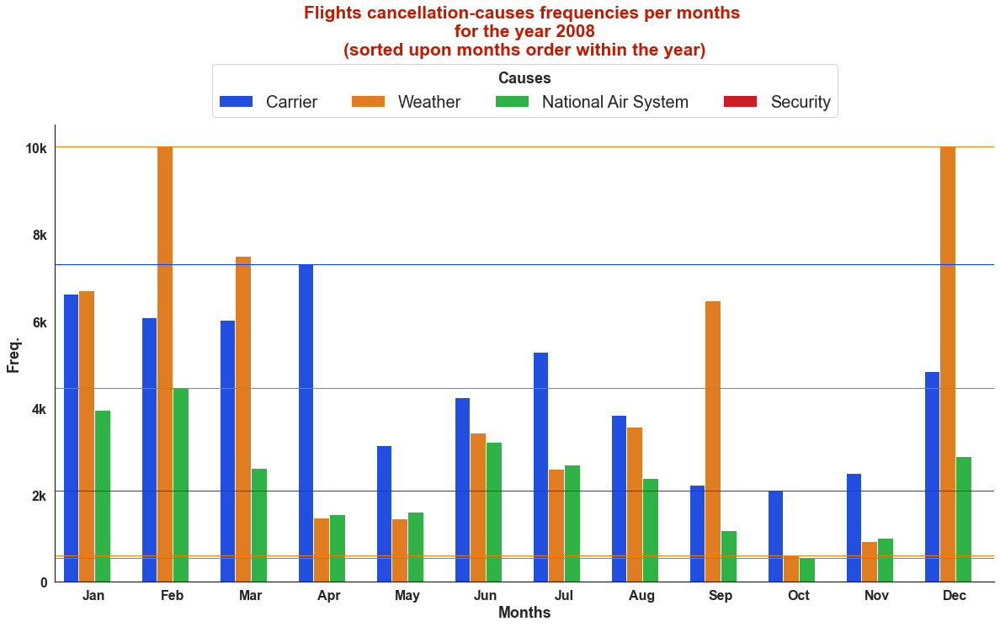

In [45]:
# Months flights cancellation Vs. delay causes times
plt.figure(figsize=(20,10))

ax = sns.countplot(data=airline_cancelled,
                   x='Month',
                   hue='CancellationCode',hue_order=['A','B','C','D'],
                   palette='bright')
sns.despine()

title = 'Flights cancellation-causes frequencies per months \nfor the year 2008'
plt.title(title + '\n(sorted upon months order within the year)',
          fontsize=21,color='#BF1B00',weight='bold',y=1.14)

plt.xlabel('Months',fontsize=18,weight='bold')
plt.ylabel('Freq.',fontsize=18,weight='bold')

plt.xticks(fontsize=16,weight='bold')
plt.yticks(np.arange(0,12000,2000),
           [0] + [str(n)+'k' for n in range(2,11,2)],
           #[0,'2k','4k','6k','8k','10k'],
           fontsize=16,weight='bold')



legend = plt.legend(title='Causes',
                    title_fontsize=18,ncol=4,loc='upper center',bbox_to_anchor=(.5,1.15),
                    labels=['Carrier','Weather','National Air System','Security'],
                    fontsize=13,prop={'size':20},framealpha =.9)
plt.setp(legend.get_title(),fontsize=18,weight='bold') 

# drawing max and min lines
max_min_lines = {'carrier':(7312,2097),
                 'weather':(10042,600),
                 'NAS':(4470,552)}
colors = (color for color in list(sns.color_palette('bright')))
for m in max_min_lines:
    max,min = max_min_lines[m]
    color=next(colors)
    plt.axhline(max,color=color,linewidth=1, linestyle ='-')
    plt.axhline(min ,color=color,linewidth=1, linestyle ='-');

#'-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'

print('\nHint: Colored lines indicate the Max and Min frequencies')
#plt.grid(True,axis='y');

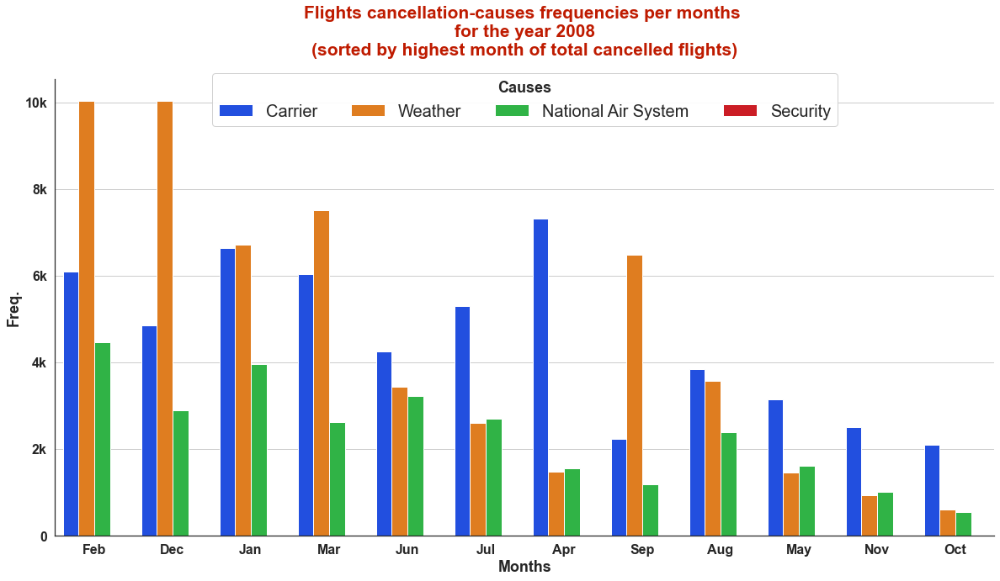

In [46]:
# Months flights cancellation Vs. delay causes times
plt.figure(figsize=(20,10))

ax = sns.countplot(data=airline_cancelled,
                   x='Month', order = airline_cancelled['Month'].value_counts().index,
                   hue='CancellationCode',hue_order=['A','B','C','D'],
                   palette='bright')
sns.despine()

title = 'Flights cancellation-causes frequencies per months \nfor the year 2008'
plt.title(title + '\n(sorted by highest month of total cancelled flights)',
          fontsize=21,color='#BF1B00',weight='bold',y=1.04)

plt.xlabel('Months',fontsize=18,weight='bold')
plt.ylabel('Freq.',fontsize=18,weight='bold')

plt.xticks(fontsize=16,weight='bold')
plt.yticks(np.arange(0,12000,2000),
           [0] + [str(n)+'k' for n in range(2,11,2)],
           #[0,'2k','4k','6k','8k','10k'],
           fontsize=16,weight='bold')

legend = plt.legend(title='Causes',
                    title_fontsize=18,ncol=4,loc='upper center',bbox_to_anchor=(.5,1.03),
                    labels=['Carrier','Weather','National Air System','Security'],
                    fontsize=13,prop={'size':20},framealpha =.9)
plt.setp(legend.get_title(),fontsize=18,weight='bold') 
plt.grid(True,axis='y');

In [47]:
# flights cancellation-causes times per months
print('\nFlights cancellation-causes times per months\n\n(Sorted from highest total cancellation times)')

airline_cancelled_dummies = pd.get_dummies(data=airline_cancelled,
                                           columns=['CancellationCode'],
                                           prefix='',
                                           prefix_sep='')
#airline_cancelled_dummies.drop(columns='Month',inplace=True)

airline_cancelled_dummies['Total flights-cancellation causes times'] = \
                                                            airline_cancelled_dummies['A'] + airline_cancelled_dummies['B'] + \
                                                            airline_cancelled_dummies['C'] + airline_cancelled_dummies['D']

airline_cancelled_dummies.rename(columns={'A':'Carrier cancellation',
                                          'B':'Weather cancellation',
                                          'C':'National Air system cancellation',
                                          'D':'Security cancellation'},
                                 inplace=True)
airline_cancelled_dummies.groupby('Month').sum()\
                                        .sort_values(by='Total flights-cancellation causes times',ascending=False)\
                                        #.iloc[:,[0,1,2,3]]\
                                        #.plot(kind='barh',figsize=(15,15));


Flights cancellation-causes times per months

(Sorted from highest total cancellation times)


,Carrier cancellation,Weather cancellation,National Air system cancellation,Security cancellation,Total flights-cancellation causes times
Month,,,,,
Feb,6090.0,10034.0,4470.0,2.0,20596.0
Dec,4850.0,10042.0,2887.0,0.0,17779.0
Jan,6635.0,6711.0,3962.0,0.0,17308.0
Mar,6038.0,7520.0,2621.0,4.0,16183.0
Jun,4251.0,3448.0,3232.0,0.0,10931.0
Jul,5292.0,2612.0,2694.0,0.0,10598.0
Apr,7312.0,1479.0,1564.0,0.0,10355.0
Sep,2246.0,6478.0,1188.0,1.0,9913.0
Aug,3852.0,3582.0,2401.0,0.0,9835.0


In [48]:
#{'A':'Carrier cancellation',
# 'B':'Weather cancellation',
# 'C':'National Air system cancellation',
# 'D':'Security cancellation'},

print('\n','Cancellation Codes: A = Carrier | B = Weather | C = National Air system | D = Security')

airline_cancelled.groupby(['Month','CancellationCode']).size().to_frame('Freq.')


 Cancellation Codes: A = Carrier | B = Weather | C = National Air system | D = Security


Freq.
Month CancellationCode       
Jan   A                  6635
      B                  6711
      C                  3962
      D                     0
Feb   A                  6090
      B                 10034
      C                  4470
      D                     2
Mar   A                  6038
      B                  7520
      C                  2621
      D                     4
Apr   A                  7312
      B                  1479
      C                  1564
      D                     0
May   A                  3157
      B                  1461
      C                  1608
      D                     3
Jun   A                  4251
      B                  3448
      C                  3232
      D                     0
Jul   A                  5292
      B                  2612
      C                  2694
      D                     0
Aug   A                  3852
      B                  3582
      C                  2401
      D                     0
Sep   A                  2246
      B                  6478
      C                  1188
      D                     1
Oct   A                  2097
      B                   600
      C                   552
      D                     0
Nov   A                  2510
      B                   937
      C                  1009
      D                     2
Dec   A                  4850
      B                 10042
      C                  2887
      D                     0

## <font color='#AD1FFF'>11<sup>th</sup></font> <font color='#5FB1FF'>Arrival delays  Vs. Months</font> <a id='11th'></a>

- **Months 'Dec', 'Jun', 'Feb', and 'Mar' had the highest arrival delays means** exceeding 11 up to about 17 minutes during year 2008. However, **'Oct', 'Sep' and 'Nov' had the lowest arrival delays means** from about 0.4 to 2 minutes amongst the other months.
        

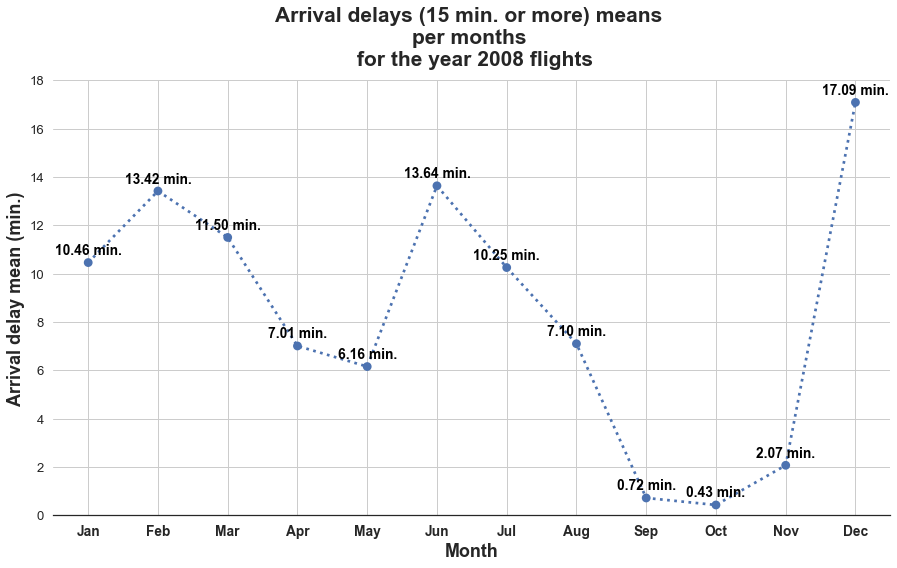

In [49]:
# plotting Month Vs ArrDelay means

month_arr_means = df_inv.loc[~(df_inv['ArrDelay'].isin(zero_or_null)),['Month','ArrDelay']] \
                        .groupby('Month').mean() #.sort_values(by='ArrDelay',ascending=False)

plt.figure(figsize=[15,8])

#sns.pointplot(data=month_arr_means, x=month_arr_means.index , y='ArrDelay',
#              order=month_arr_means.index,
#              linestyles='',color=sns.color_palette()[0])

#plt.errorbar( x=month_arr_means.index , y=month_arr_means['ArrDelay'],
#              #order=month_arr_means.index,
#              #linestyles='',
#            )#color=sns.color_palette()[0])

sns.pointplot( x=month_arr_means.index , y=month_arr_means['ArrDelay'],
              #order=month_arr_means.index,
              linestyles='dotted',
             )#color=sns.color_palette()[0])

sns.despine(left=True)
sns.set_theme(font_scale=1.19,style='ticks')

plt.title('Arrival delays (15 min. or more) means \nper months \n for the year 2008 flights',
          fontsize=21,weight='bold',y=1.02)
plt.xlabel('Month',fontsize=18,weight='bold')
plt.ylabel('Arrival delay mean (min.)',fontsize=18,weight='bold')

plt.ylim((0,18))
plt.grid(True,axis='both')

plt.xticks(fontsize=14,weight='bold')

# get the current tick locations and labels
locs, labels = plt.xticks(fontsize=13.75,weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    mean = month_arr_means.loc[label.get_text(),'ArrDelay']
    
    string = '{:0.2f} min.'.format(mean)
    
    # print the annotation next to the bar
    plt.text(loc, mean+.33, s=string, ha = 'center', color = 'black',fontsize=13.7,weight='bold');

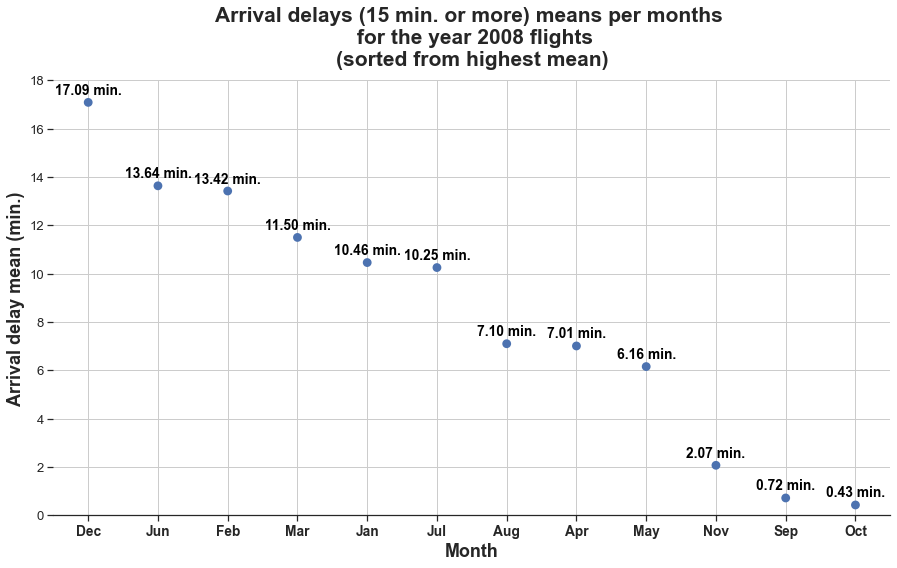

In [50]:
# plotting Month Vs ArrDelay means

month_arr_means = df_inv.loc[~(df_inv['ArrDelay'].isin(zero_or_null)),['Month','ArrDelay']] \
                        .groupby('Month').mean() \
                        .sort_values(by='ArrDelay',ascending=False)

plt.figure(figsize=[15,8])

#sns.pointplot(data=month_arr_means, x=month_arr_means.index , y='ArrDelay',
#              order=month_arr_means.index,
#              linestyles='',color=sns.color_palette()[0])

#plt.errorbar( x=month_arr_means.index , y=month_arr_means['ArrDelay'],
#              #order=month_arr_means.index,
#              #linestyles='',
#            )#color=sns.color_palette()[0])

sns.pointplot( x=month_arr_means.index , y=month_arr_means['ArrDelay'],
              order=month_arr_means.index,
              linestyles='',
             )#color=sns.color_palette()[0])

sns.despine(left=True)
sns.set_theme(font_scale=1.19,style='ticks')

plt.title('Arrival delays (15 min. or more) means per months \n for the year 2008 flights\n(sorted from highest mean)',
          fontsize=21,weight='bold',y=1.02)
plt.xlabel('Month',fontsize=18,weight='bold')
plt.ylabel('Arrival delay mean (min.)',fontsize=18,weight='bold')

plt.ylim((0,18))
plt.grid(True,axis='both')

plt.xticks(fontsize=14,weight='bold')

# get the current tick locations and labels
locs, labels = plt.xticks(fontsize=13.75,weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    mean = month_arr_means.loc[label.get_text(),'ArrDelay']
    
    string = '{:0.2f} min.'.format(mean)
    
    # print the annotation next to the bar
    plt.text(loc, mean+.33, s=string, ha = 'center', color = 'black',fontsize=13.7,weight='bold');

## <font color='#AD1FFF'>12<sup>th</sup></font> <font color='#5FB1FF'>Arrival delays by delay causes Vs. Months</font> <a id='12th'></a>

- **Arrival delays due to 'Weather' had the highest means, medians, with the widest third quartile ranges starting from those medians, and more greater-values distributions, within all 2008 months**, than arrival delays due to other causes. Arrival delays due to 'Carrier' came secondly, then due to 'NAS' or national air system at third in this, and finally arrival-delays due to 'Security'-delays, with more lower-values distribution, in order respectively in general. However, **it differed for 'Jun', and 'Jul'** when the median of arrival-delays due to 'Carrier' was equal to arrival-delays' median due to 'NAS', for both months. Meanwhile, as usual for all months, **arrival delays due to 'Security' had the lowest** means, medians, with much of lower-values distributed under their lowest medians.
        
        
- **'Weather' had the highest impact on flights arrival delays within different 2008 months**. Then 'Carrier', 'NAS' or national air system, and 'Security' at last, come in order respectively in general, except for 'Jul' where 'Carrier' was third after 'NAS'.


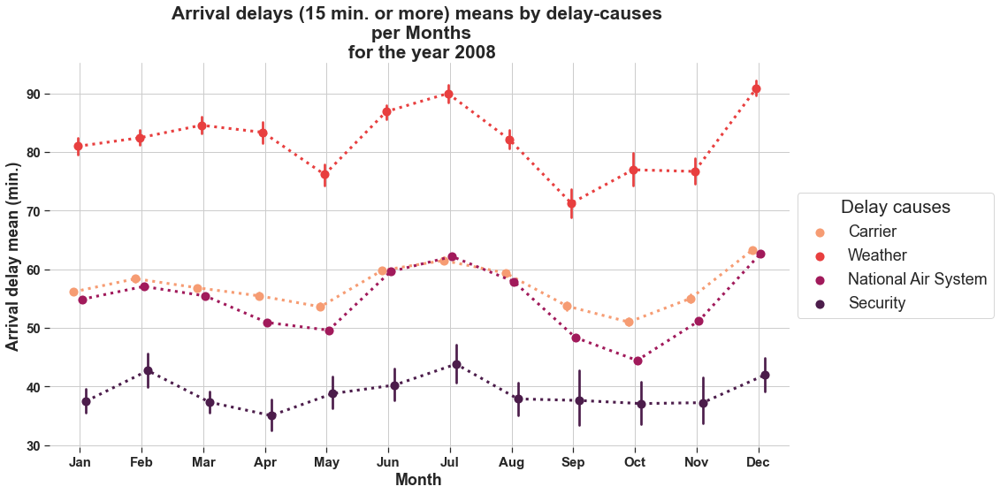

In [51]:
plt.figure(figsize = [15,8])

ax = sns.pointplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                   linestyles='dotted',dodge= 0.2,scale=1.15
                  ,palette = 'rocket_r')

ax.set_title('Arrival delays (15 min. or more) means by delay-causes \n per Months\n for the year 2008',
             fontsize=21,weight='bold')
ax.set_xlabel('Month',fontsize=18,weight='bold')
ax.set_ylabel('Arrival delay mean (min.)',fontsize=18,weight='bold')

plt.xticks(fontsize=15,weight='bold')
plt.yticks(fontsize=15,weight='bold')

legend = ax.legend(loc = 6, ncol = 1,  framealpha = .8, title = 'Delay causes',# labels=causes,  
                   fontsize=14, bbox_to_anchor = (1,0.5),prop={'size':18},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large')  

sns.despine(left=True,bottom=True)
plt.grid(True);

In [52]:
print('\nFlights delays means per months and causes')

columns={'ArrDelay':'Arrival delay mean (min.)','Minutes':'Cause delay mean (min.)'}

#melt_15[list(set(melt_15.columns) -{'Cancelled'})].groupby(['Month','Cause']).mean().rename(columns=columns)
melt_15.groupby(['Month','Cause']).mean().rename(columns=columns)


Flights delays means per months and causes


Arrival delay mean (min.)  Cause delay mean (min.)
Month Cause                                                                  
Jan   Carrier                              56.171442                36.079481
      National Air System                  54.892898                28.103122
      Security                             37.524057                16.790637
      Weather                              80.988028                43.981173
Feb   Carrier                              58.401192                36.286006
      National Air System                  57.075527                27.780957
      Security                             42.727987                17.863208
      Weather                              82.425008                44.660814
Mar   Carrier                              56.856152                34.910855
      National Air System                  55.464507                26.868463
      Security                             37.348328                17.435986
      Weather                              84.570406                46.547068
Apr   Carrier                              55.486343                35.108070
      National Air System                  50.932327                25.086923
      Security                             35.063025                16.060924
      Weather                              83.361501                48.953925
May   Carrier                              53.620574                33.535753
      National Air System                  49.617749                26.008819
      Security                             38.816701                19.859470
      Weather                              76.167979                41.997025
Jun   Carrier                              59.820534                35.793324
      National Air System                  59.588023                30.752175
      Security                             40.255499                17.959391
      Weather                              86.900625                47.672530
Jul   Carrier                              61.506064                39.506669
      National Air System                  62.192084                33.147465
      Security                             43.842610                25.193858
      Weather                              89.995229                55.242421
Aug   Carrier                              59.367418                38.772434
      National Air System                  57.919304                30.155358
      Security                             37.902116                19.613757
      Weather                              82.097683                46.223175
Sep   Carrier                              53.721025                39.542116
      National Air System                  48.372589                27.562945
      Security                             37.636816                23.995025
      Weather                              71.277867                50.443945
Oct   Carrier                              51.009869                34.557236
      National Air System                  44.460146                24.703283
      Security                             37.105634                18.609155
      Weather                              76.976979                42.444265
Nov   Carrier                              55.038367                33.525817
      National Air System                  51.180908                28.693960
      Security                             37.261411                16.958506
      Weather                              76.694975                38.078099
Dec   Carrier                              63.262444                33.489687
      National Air System                  62.661970                27.564933
      Security                             41.957162                16.306560
      Weather                              90.865911                44.833603

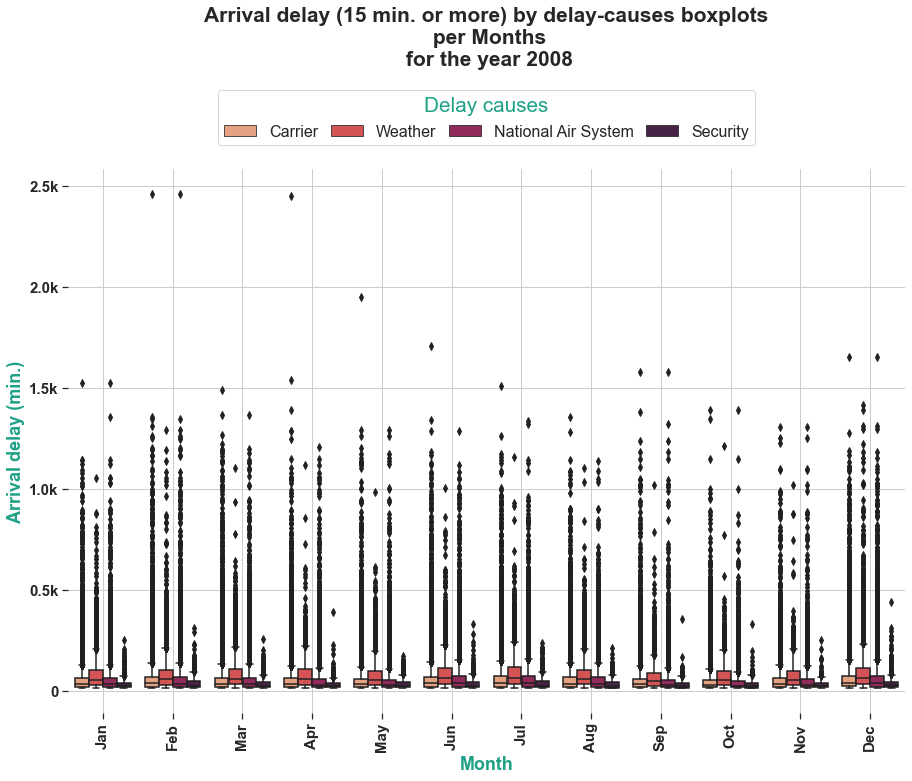

In [53]:
plt.figure(figsize = [15,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.boxplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                 dodge= 0.2,#scale=1.15 ,linestyles='',
                 palette = 'rocket_r')


ax.set_title('Arrival delay (15 min. or more) by delay-causes boxplots\n per Months\n for the year 2008',
             fontsize=21,weight='bold',y=1.18)
ax.set_xlabel('Month',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)

plt.xticks(fontsize=15,weight='bold',rotation=90)
plt.yticks(np.arange(0,3000,500),
           [0] + [str(n)+'k' for n in np.arange(0.5,3,0.5)],
           #[0] + [str(n/10)+'k' for n in range(5,30,5)],
           fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

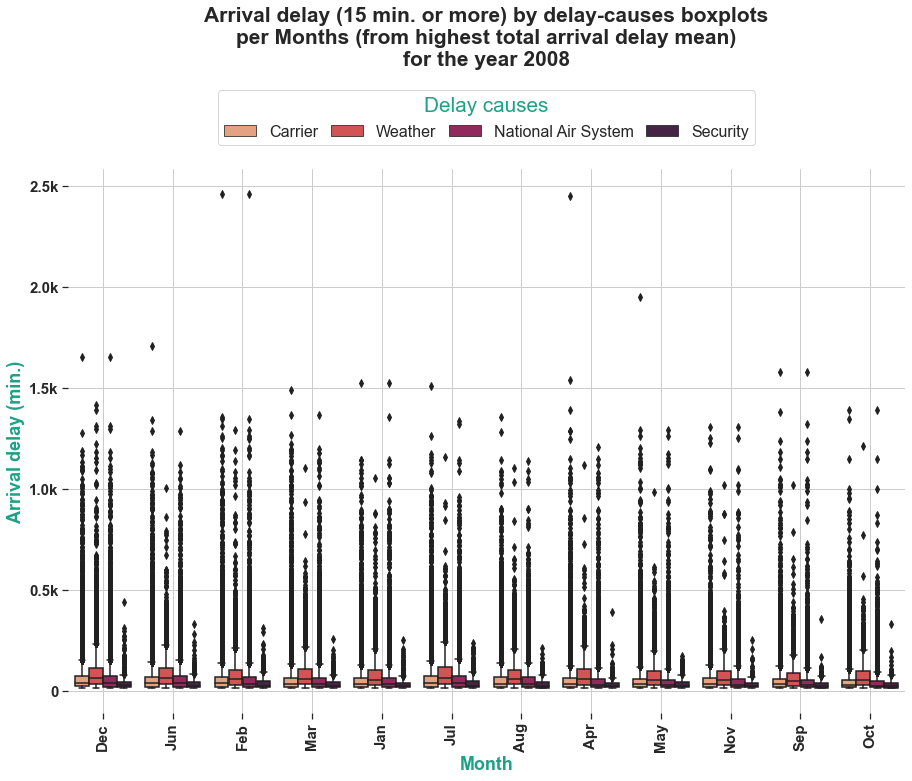

In [54]:
plt.figure(figsize = [15,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.boxplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                 order=month_arr_means.index,
                 dodge= 0.2,#scale=1.15 ,linestyles='',
                 palette = 'rocket_r')


title = 'Arrival delay (15 min. or more) by delay-causes boxplots\nper Months (from highest total arrival delay mean)'
        

ax.set_title(title+'\nfor the year 2008',fontsize=21,weight='bold',y=1.18)

ax.set_xlabel('Month',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)

plt.xticks(fontsize=15,weight='bold',rotation=90)
plt.yticks(np.arange(0,3000,500),
           [0] + [str(n)+'k' for n in np.arange(0.5,3,0.5)],
           #[0] + [str(n/10)+'k' for n in range(5,30,5)],
           fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

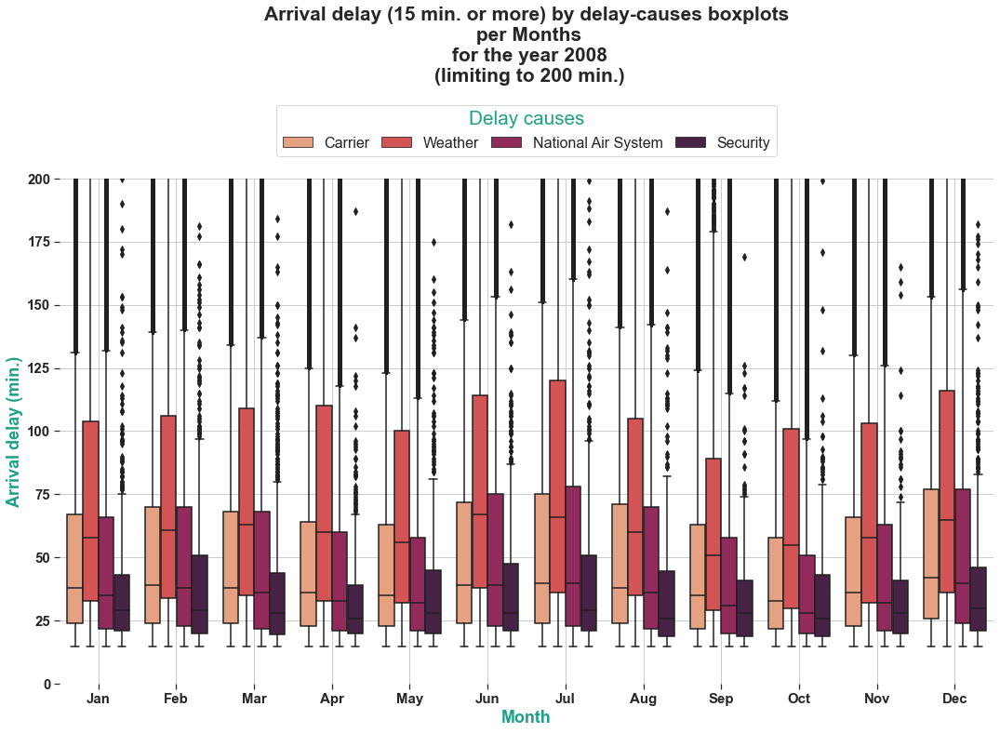

In [55]:
plt.figure(figsize = [18,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.boxplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                 dodge= 0.2,#scale=1.15 ,linestyles='',
                 palette = 'rocket_r')

title = 'Arrival delay (15 min. or more) by delay-causes boxplots\n per Months\n for the year 2008'
ax.set_title(title + '\n (limiting to 200 min.)',
             fontsize=21,weight='bold',y=1.18)
ax.set_xlabel('Month',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)
plt.ylim(0,200)
plt.xticks(fontsize=15,weight='bold')
plt.yticks(fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

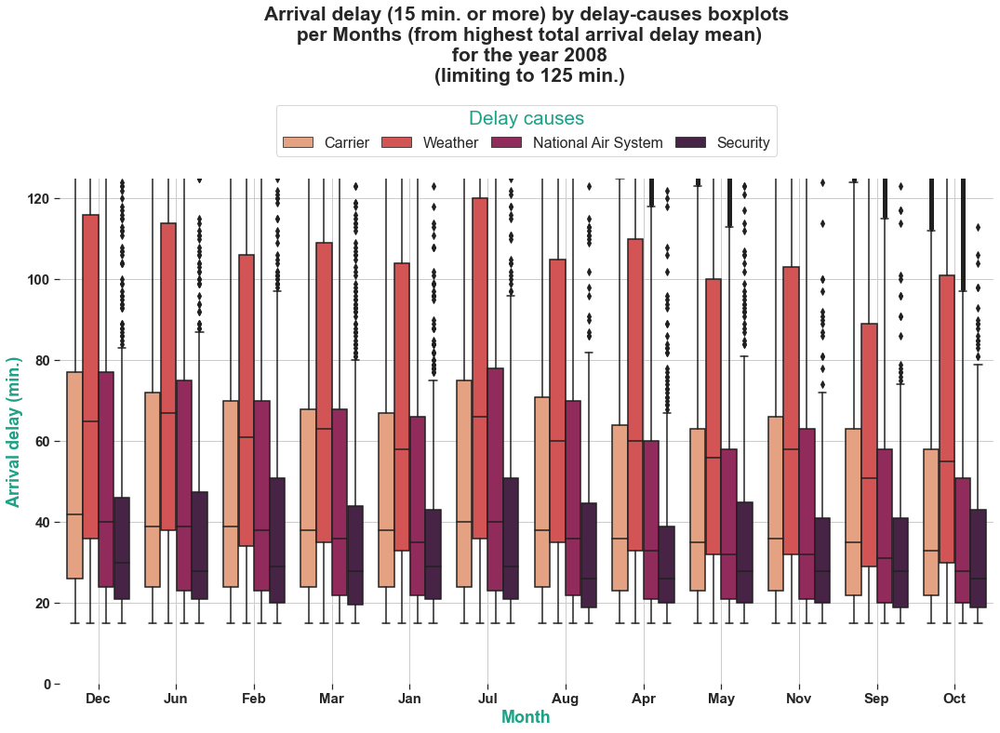

In [56]:
plt.figure(figsize = [18,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.boxplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                 order=month_arr_means.index,
                 dodge= 0.2,#scale=1.15 ,linestyles='',
                 palette = 'rocket_r')

title = 'Arrival delay (15 min. or more) by delay-causes boxplots\n per Months (from highest total arrival delay mean)'
        
ax.set_title(title + '\n for the year 2008\n (limiting to 125 min.)',
             fontsize=21,weight='bold',y=1.18)
ax.set_xlabel('Month',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)
plt.ylim(0,125)
plt.xticks(fontsize=15,weight='bold')
plt.yticks(fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

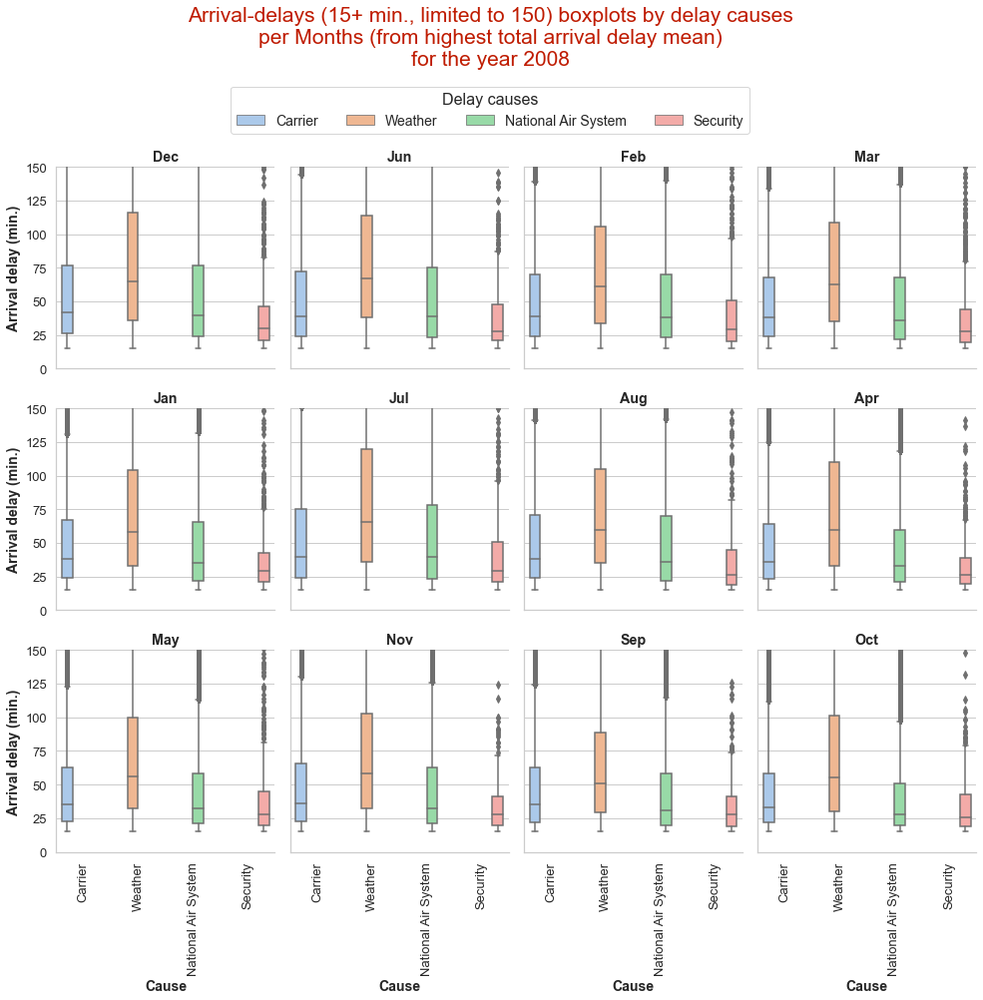

In [57]:
# # bivariate plots of Arrival-delays (15+ min., limited to 150) boxplots  per delay causes by Months for year 2008 flights
# 1.5+ million flights

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='box',
                data=melt_15,col='Month',col_order=month_arr_means.index,
                col_wrap=4,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',#'rocket_r',
                height=3.5,facet_kws=dict(ylim=(0,150))
               )
title = 'Arrival-delays (15+ min., limited to 150) boxplots by delay causes\n'
        
g.fig.suptitle(title + 'per Months (from highest total arrival delay mean)\n' + 'for the year 2008',
               color='#BF1B00',
               fontsize=21,
               x=0.331,y=1.17)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.331,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels([cause.replace('\n',' ') for cause in causes],
                  rotation=90,fontsize=13)#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

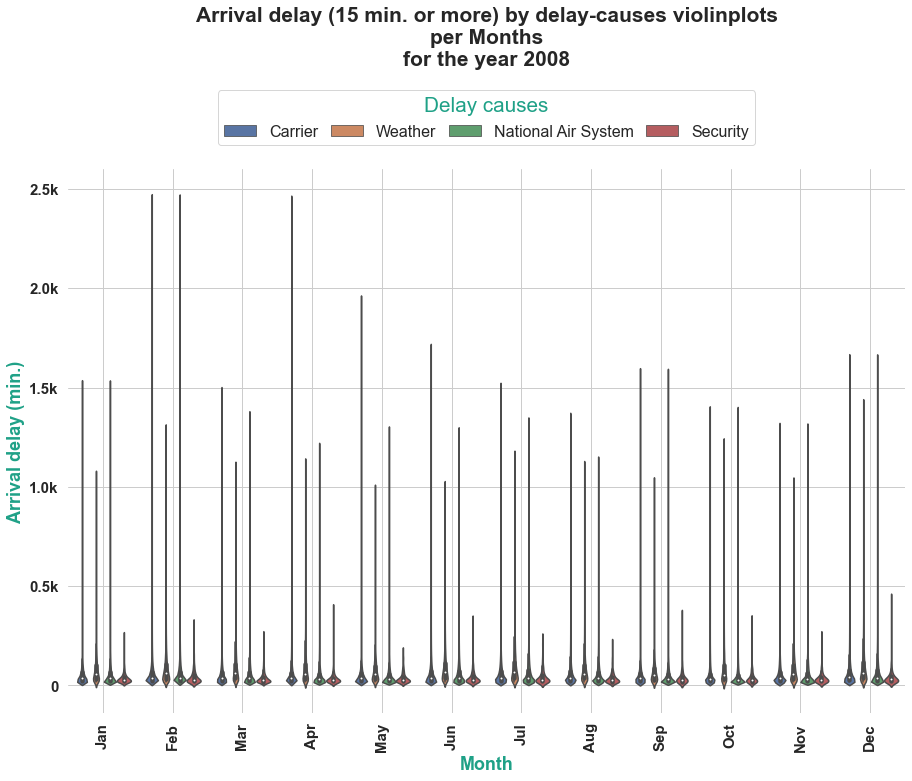

In [58]:
plt.figure(figsize = [15,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.violinplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                    #order=month_arr_means.index,
                    dodge= 0.2,#scale=1.15 ,linestyles='',
                   )#palette = 'rocket_r')


title = 'Arrival delay (15 min. or more) by delay-causes violinplots\nper Months'# (from highest total arrival delay mean)'
        

ax.set_title(title+'\nfor the year 2008',fontsize=21,weight='bold',y=1.18)

ax.set_xlabel('Month',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)

plt.xticks(fontsize=15,weight='bold',rotation=90)
plt.yticks(np.arange(0,3000,500),
           [0] + [str(n)+'k' for n in np.arange(0.5,3,0.5)],
           #[0] + [str(n/10)+'k' for n in range(5,30,5)],
           fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

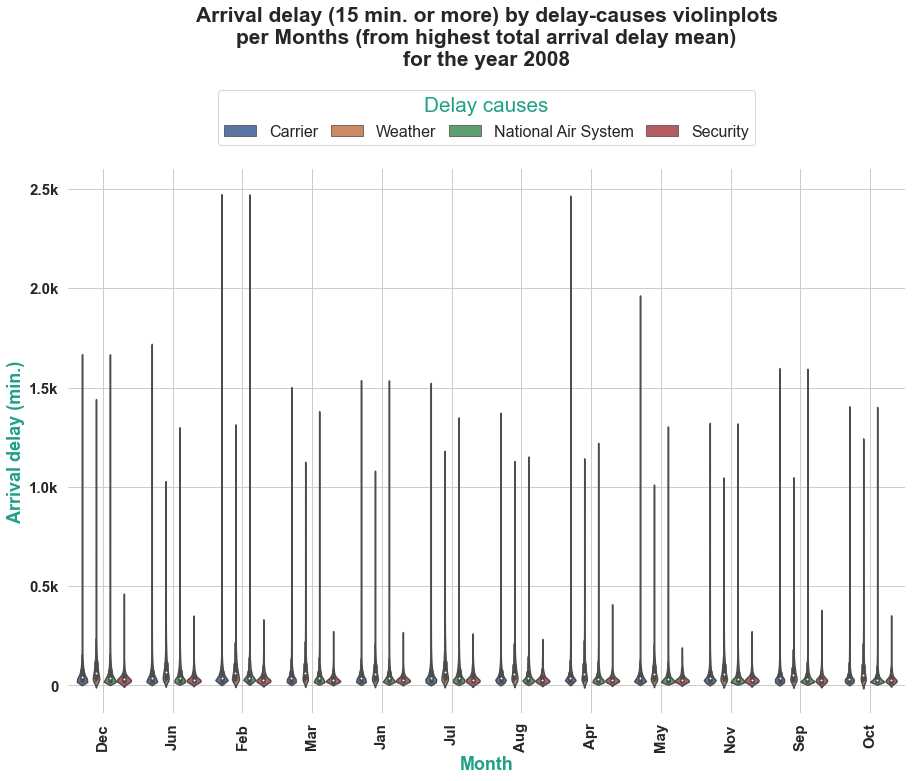

In [59]:
plt.figure(figsize = [15,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.violinplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                    order=month_arr_means.index,
                    dodge= 0.2,#scale=1.15 ,linestyles='',
                   )#palette = 'rocket_r')


title = 'Arrival delay (15 min. or more) by delay-causes violinplots\nper Months (from highest total arrival delay mean)'
        

ax.set_title(title+'\nfor the year 2008',fontsize=21,weight='bold',y=1.18)

ax.set_xlabel('Month',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)

plt.xticks(fontsize=15,weight='bold',rotation=90)
plt.yticks(np.arange(0,3000,500),
           [0] + [str(n)+'k' for n in np.arange(0.5,3,0.5)],
           #[0] + [str(n/10)+'k' for n in range(5,30,5)],
           fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

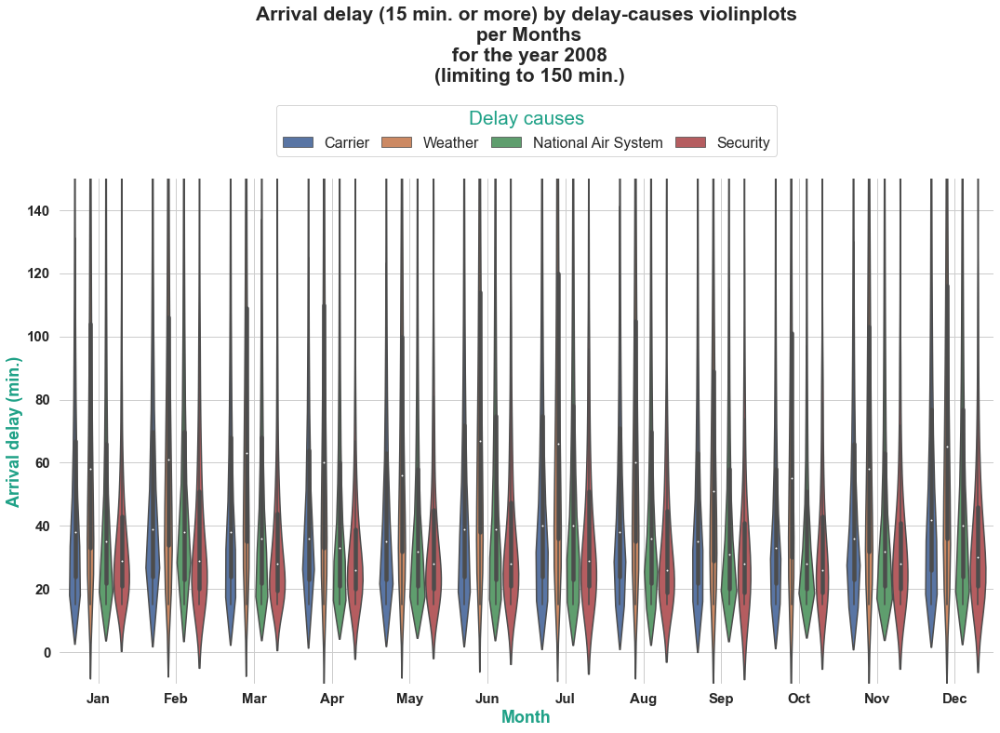

In [60]:
plt.figure(figsize = [18,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.violinplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                    #order=month_arr_means.index,
                    dodge= 0.2,#scale=1.15 ,linestyles='',
                   )#palette = 'rocket_r')

title = 'Arrival delay (15 min. or more) by delay-causes violinplots\n per Months'# (from highest total arrival delay mean)'
ax.set_title(title +'\n for the year 2008' + '\n (limiting to 150 min.)',
             fontsize=21,weight='bold',y=1.18)
ax.set_xlabel('Month',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)
plt.ylim(-10,150)
plt.xticks(fontsize=15,weight='bold')
plt.yticks(fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

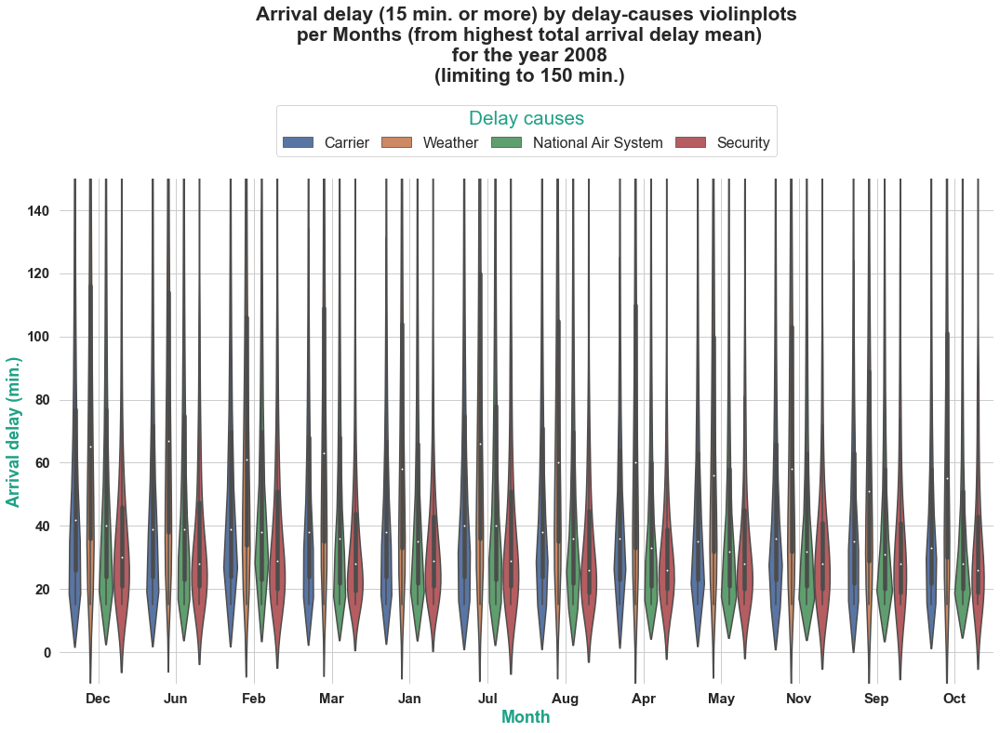

In [61]:
plt.figure(figsize = [18,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.violinplot(data = melt_15, x = 'Month', y = 'ArrDelay', hue = 'Cause',
                    order=month_arr_means.index,
                    dodge= 0.2,#scale=1.15 ,linestyles='',
                   )#palette = 'rocket_r')

title = 'Arrival delay (15 min. or more) by delay-causes violinplots\n per Months (from highest total arrival delay mean)'
ax.set_title(title +'\n for the year 2008' + '\n (limiting to 150 min.)',
             fontsize=21,weight='bold',y=1.18)
ax.set_xlabel('Month',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)
plt.ylim(-10,150)
plt.xticks(fontsize=15,weight='bold')
plt.yticks(fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

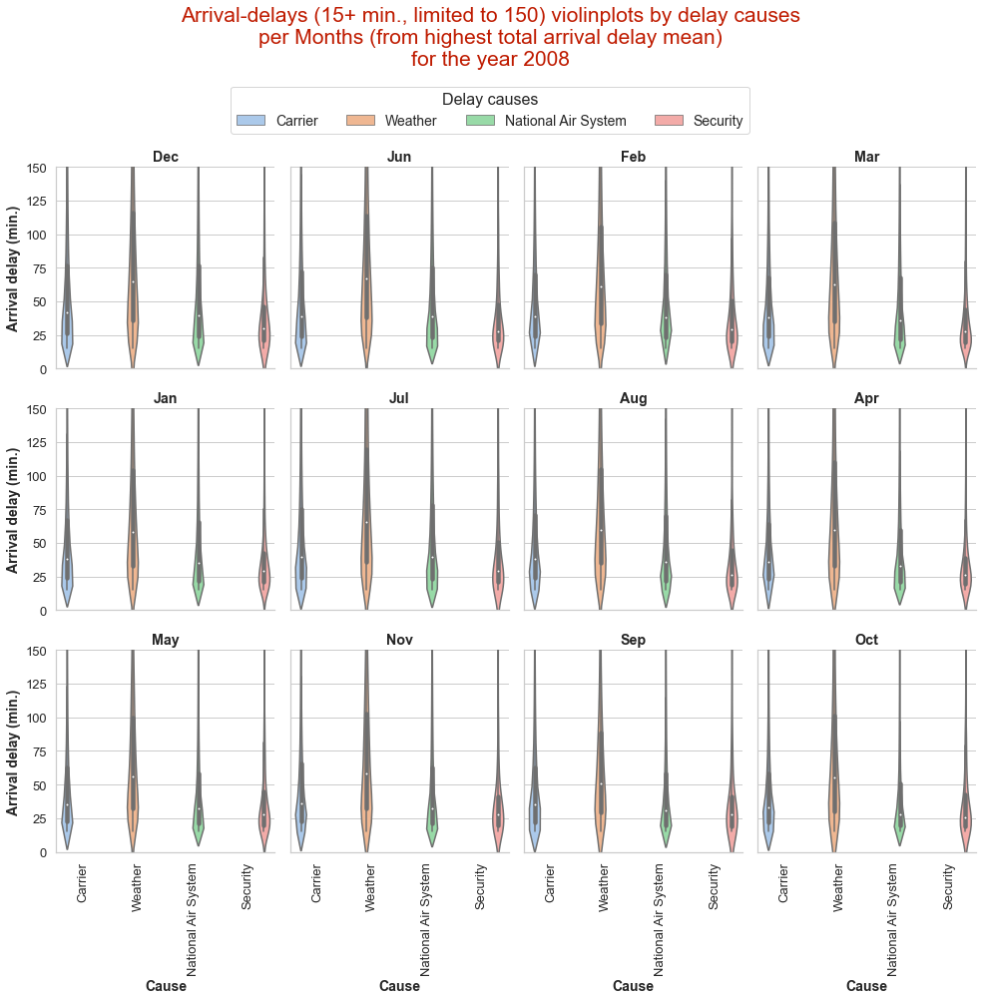

In [62]:
# # bivariate plots of Arrival-delays (15+ min., limited to 150) violinplots  per delay causes by Months for year 2008 flights
# 1.5+ million flights

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='violin',
                data=melt_15,col='Month',col_order=month_arr_means.index,
                col_wrap=4,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',#'rocket_r',
                height=3.5,facet_kws=dict(ylim=(0,150))
               )
title = 'Arrival-delays (15+ min., limited to 150) violinplots by delay causes\n'
        
g.fig.suptitle(title + 'per Months (from highest total arrival delay mean)\n' + 'for the year 2008',
               color='#BF1B00',
               fontsize=21,
               x=0.331,y=1.17)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=14,
             bbox_to_anchor=(0.331,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels([cause.replace('\n',' ') for cause in causes],
                  rotation=90,fontsize=13)#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
g.set_yticklabels(ytickslabels,fontsize=13);#fontsize=12,color='blue',weight='bold';

## <font color='#AD1FFF'>13<sup>th</sup></font> <font color='#5FB1FF'>Airlines flights counts and proportions</font> <a id='13th'></a>
    
- **'Southwest Airlines Co.' recorded**:
<br>1st: _**The highest total flights count within 2008**_. It looks that it had more recorded flights, than twice of carrier's in next order.
<br>2nd: _**The highest total count of flights with 15+ minutes arrival delay within 2008**_, then 'American Airlines Inc.' was in the next order.
<br>3rd: _**The highest total count of on-time flights during 2008**_, even than twice of the carrier's in next order.
<br>4th: _**The fourth highest total count of cancelled flights during 2008**_, after 'American Eagle Airlines Inc.', 'American Airlines Inc.', and 'Skywest Airlines Inc.' respectively.


In [63]:
prop_aireline = df_inv['Carrier'].value_counts().to_frame('Flights').sort_values('Flights',ascending=False)

prop_aireline['On-time'] = on_time['Carrier'].value_counts()
prop_aireline['On-time prop (per airline flights)'] = round(100 * prop_aireline['On-time'] / prop_aireline['Flights'],2)
prop_aireline['On-time prop (per airline flights)'] = prop_aireline['On-time prop (per airline flights)'].astype('str') + ' %'

prop_aireline['Delayed'] = df_inv_15['Carrier'].value_counts()
prop_aireline['Del. prop (per airline flights)'] = round(100 * prop_aireline['Delayed'] / prop_aireline['Flights'],2)
prop_aireline['Del. prop (per airline flights)'] = prop_aireline['Del. prop (per airline flights)'].astype('str') + ' %'

prop_aireline['Cancelled'] = airline_cancelled['Carrier'].value_counts()
prop_aireline['Canc. prop (per airline flights)'] = round(100 * prop_aireline['Cancelled'] / prop_aireline['Flights'],2)
prop_aireline['Canc. prop (per airline flights)'] = prop_aireline['Canc. prop (per airline flights)'].astype('str') + ' %'

prop_aireline['Diverted'] = prop_aireline['Flights'] - \
                                                (prop_aireline['On-time']+prop_aireline['Delayed']+prop_aireline['Cancelled'])
prop_aireline['Div. prop (per airline flights)'] = round(100 * prop_aireline['Diverted'] / prop_aireline['Flights'],2)
prop_aireline['Div. prop (per airline flights)'] = prop_aireline['Div. prop (per airline flights)'].astype('str') + ' %'
prop_aireline

,Flights,On-time,On-time prop (per airline flights),Delayed,Del. prop (per airline flights),Cancelled,Canc. prop (per airline flights),Diverted,Div. prop (per airline flights)
Southwest Airlines Co.,1201754,967154,80.48 %,219757,18.29 %,12389,1.03 %,2454,0.2 %
American Airlines Inc.,604885,422461,69.84 %,163024,26.95 %,17440,2.88 %,1960,0.32 %
Skywest Airlines Inc.,567159,448167,79.02 %,105245,18.56 %,12436,2.19 %,1311,0.23 %
American Eagle Airlines Inc.,490693,357489,72.85 %,113672,23.17 %,18331,3.74 %,1201,0.24 %
US Airways Inc.,453589,363153,80.06 %,82933,18.28 %,6582,1.45 %,921,0.2 %
Delta Air Lines Inc.,451931,345094,76.36 %,98840,21.87 %,6813,1.51 %,1184,0.26 %
United Air Lines Inc.,449515,321907,71.61 %,116072,25.82 %,10541,2.34 %,995,0.22 %
Expressjet Airlines Inc.,374510,275531,73.57 %,87883,23.47 %,9992,2.67 %,1104,0.29 %
Northwest Airlines Inc.,347652,266892,76.77 %,77218,22.21 %,2906,0.84 %,636,0.18 %
Continental Air Lines Inc.,298455,220808,73.98 %,73047,24.48 %,3702,1.24 %,898,0.3 %



Hint: Colored lines indicate the Max and Min frequencies


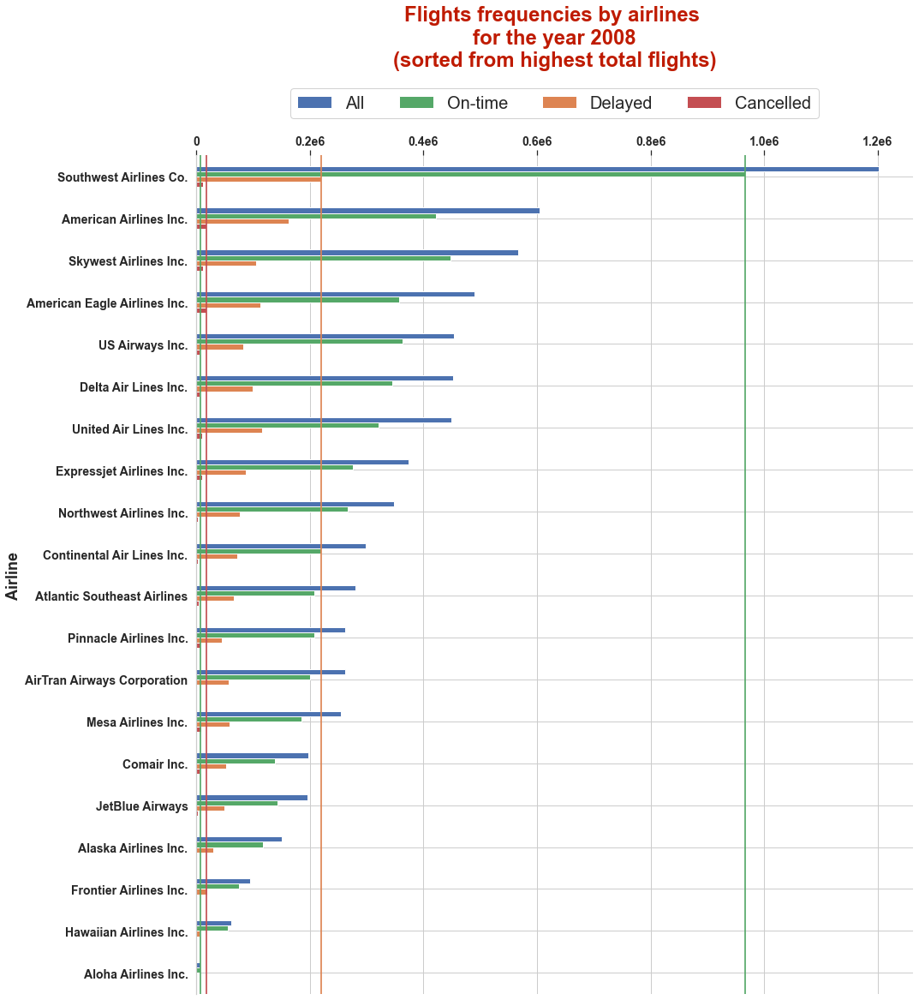

In [64]:
# month_counts.to_frame('Month').rename(columns={'Month':'Flights counts'}).sort_values('Flights counts',ascending=False)

# calculating Flights proportions and counts per each month

# creating 'prop' dataframe and sorting by total flights
# prop_aireline = df_inv['Carrier'].value_counts().to_frame('Flights').sort_values('Flights',ascending=True)

# prop_aireline['On-time'] = df_inv[(df_inv.ArrDelay < 15) & (~df_inv.ArrDelay.isna())]['Carrier'].value_counts()
# prop_aireline['On-time prop (per airline flights)'] = round(100 * prop_aireline['On-time'] / prop_aireline['Flights'],2)
# prop_aireline['On-time prop (per airline flights)'] = prop_aireline['On-time prop (per airline flights)'].astype('str') + ' %'

# prop_aireline['Delayed'] = df_inv_15['Carrier'].value_counts()
# prop_aireline['Del. prop (per airline flights)'] = round(100 * prop_aireline['Delayed'] / prop_aireline['Flights'],2)
# prop_aireline['Del. prop (per airline flights)'] = prop_aireline['Del. prop (per airline flights)'].astype('str') + ' %'

# prop_aireline['Cancelled'] = airline_cancelled['Carrier'].value_counts()
# prop_aireline['Canc. prop (per airline flights)'] = round(100 * prop['Cancelled'] / prop_aireline['Flights'],2)
# prop_aireline['Canc. prop (per airline flights)'] = prop_aireline['Canc. prop (per airline flights)'].astype('str') + ' %'

# prop_aireline['Diverted'] = prop['Flights'] - (prop_aireline['On-time']+prop_aireline['Delayed']+prop_aireline['Cancelled'])
# prop_aireline['Div. prop (per airline flights)'] = round(100 * prop_aireline['Diverted'] / prop_aireline['Flights'],2)
# prop_aireline['Div. prop (per airline flights)'] = prop_aireline['Div. prop (per airline flights)'].astype('str') + ' %'
# prop_aireline


#### plotting clustered bar chart for flights counts per airline
colors = [sns.color_palette()[0] , sns.color_palette()[2] , sns.color_palette()[1] , sns.color_palette()[3]] 

ax = prop_aireline.iloc[:,reversed([0,1,3,5])]\
                  .sort_values('Flights',ascending=True)\
                  .plot(kind='barh',figsize=(15,18),rot=0,color=colors[::-1])
                                                        #color=list(sns.color_palette()[0:4][::-1] #['r', 'g' ,'orange','b']
                                                                                  
sns.set(font_scale=1.19,style='ticks')
sns.despine(bottom=True)

plt.title('Flights frequencies by airlines \nfor the year 2008\n(sorted from highest total flights)',
          fontsize=24,color='#BF1B00',weight='bold',y=1.1)

plt.ylabel('Airline',fontsize=18,weight='bold')
plt.xlabel('')#'Freq.',fontsize=17,weight='bold')

plt.yticks(fontsize=14,weight='bold')
plt.xticks(np.arange(0,1.4,.2)*10**6,
           [0] + [str(n/10)+'e6' for n in range(2,14,2)],
           #[0,'0.2e6','0.4e6','0.6e6','0.8e6','1.0e6','1.2e6'],
           fontsize=14,weight='bold')

ax.xaxis.tick_top()

# ------ adjusting legend 

# handles, labels = ax.get_legend_handles_labels()
labels=['All','On-time','Delayed','Cancelled']
# ax.legend(handles[::-1], labels,
#            ncol=4,
#           loc='upper center',bbox_to_anchor=(.5,1.09),
#           fontsize=13,framealpha =.9,#,bbox_to_anchor=(.5,1.047),
#           prop={'size':20})

plt.legend(reversed(plt.legend().legendHandles), labels, #reversed(labels),
           ncol=4,
           loc='upper center',bbox_to_anchor=(.5,1.09),
           fontsize=13,framealpha =.9,#,bbox_to_anchor=(.5,1.047),
           prop={'size':20},
          )# colors=list(sns.color_palette()[0:4][::-1]))

plt.grid(True,axis='x')

# drawing max and min lines
max_min_lines = {'on-time':(967154,7358),
                 'delayed':(219757,394),
                 'cancelled':(18331,42)}

colors = (color for color in colors[1:])
for m in max_min_lines:
    max,min =  max_min_lines[m]
    color=next(colors)
    plt.axvline(max,color=color,linewidth=1.7, linestyle ='-');
    plt.axvline(min,color=color,linewidth=1.7, linestyle ='-');

#'-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'
print('\nHint: Colored lines indicate the Max and Min frequencies')


Hint: Colored lines indicate the Max and Min frequencies


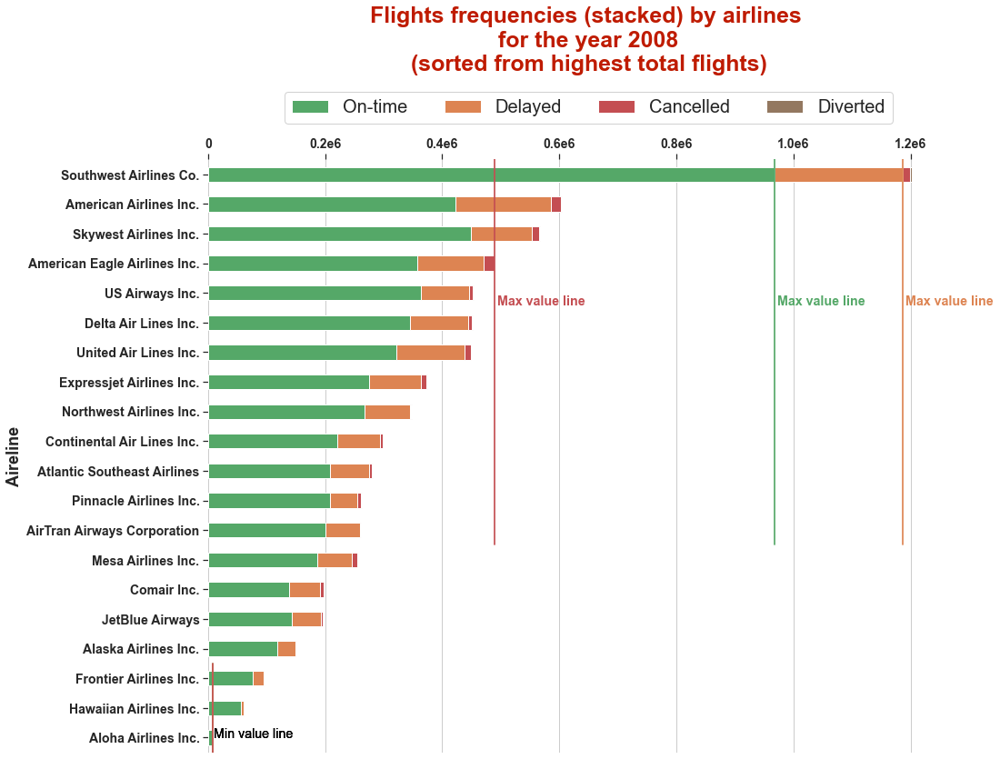

In [65]:

colors = [sns.color_palette()[2],sns.color_palette()[1],sns.color_palette()[3],sns.color_palette()[-5]]

ax = prop_aireline.sort_values('Flights',ascending=True) \
                  .iloc[:,[1,3,5,7]] \
                  .plot(kind='barh',figsize=(15,12),rot=0,stacked=True,color=colors)

sns.set(font_scale=1.19,style='ticks')
sns.despine(left=True,bottom=True)

plt.title('Flights frequencies (stacked) by airlines \nfor the year 2008\n(sorted from highest total flights)',
          fontsize=25,color='#BF1B00',weight='bold',y=1.14)

plt.ylabel('Aireline',fontsize=18,weight='bold')

plt.yticks(fontsize=14,weight='bold')#,rotation=90)
plt.xticks(np.arange(0,1.5,.2)*10**6,
           [0] + [str(n/10)+'e6' for n in range(2,15,2)],
           #[0,'0.2e6','0.4e6','0.6e6','0.8e6','1e6','1.2e6','1.4e6'],
           fontsize=14,weight='bold',)
plt.xlim(0,1.3*10**6)

plt.legend(loc='upper center',#bbox_to_anchor=(.5,1.07),
           fontsize=13,framealpha =.9,
           ncol=4,#labelcolor ='red'),
           #loc='center right',bbox_to_anchor=(1.2,.4),#,bbox_to_anchor=(.5,1.047),
           bbox_to_anchor=(.5,1.13),
           #,bbox_to_anchor=(.5,1.047),
           prop={'size':20})
          
plt.grid(True,axis='x')
ax.xaxis.tick_top()


# drawing max and min lines
max_min_lines = {'on-time':(967154,7358),
                 'delayed':((219757 + 967154) , (394+7358))  ,
                 'cancelled':((18331 + 113672 + 357489) , (42 + 394 + 7358))}

color_gen = (color for color in colors)
    
for flights in max_min_lines:
    
    max,min = max_min_lines[flights]
    
    color=next(color_gen)
    
    plt.axvline(max,color=color,ymin=.35
                   ,linewidth=1.7
                   ,linestyle ='-')
    plt.text(max+80000,14.6,'Max value line',color=color,ha='center',weight='bold')
    
    plt.axvline(min,color=color,ymax=.15#xmin=.68,xmax=.91
                   #,linewidth=1.2
                   ,linestyle ='-')
    plt.text(min+70000,1 * 10**-7,'Min value line',color='black',ha='center') 


print('\nHint: Colored lines indicate the Max and Min frequencies')

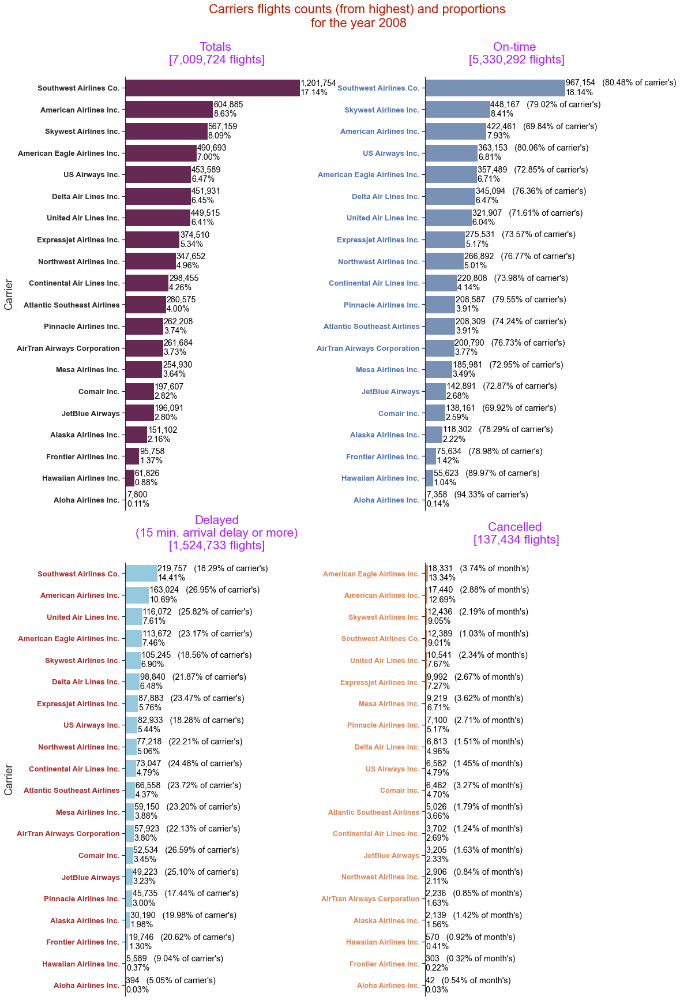

In [66]:
# Carriers against flights counts
# for the whole data points df_inv (7,009,728 rows), against on_time (5,330,292 rows),
# df_inv_15 (1,524,733  rows) , airline_cancelled (137,434 rows)

fig , ax = plt.subplots(2,2,sharex=True,figsize=(15,29.3))
#ax = ax.flatten()

plt.suptitle('Carriers flights counts (from highest) and proportions \nfor the year 2008',
             fontsize=22,color='#BF1B00',
             #x=.45,
             y=.94)
# first subplot

# Total flights per Carriers
ax[0,0] = plt.subplot(2,2,1)

carrier_counts = df_inv['Carrier'].value_counts()

sns.countplot(data = df_inv, y = 'Carrier',
              order = carrier_counts.index,
              color = sns.color_palette('rocket')[1],
              #sns.color_palette('vlag')[-1],#sns.color_palette('rocket')[0],#default_color,
              ax=ax[0,0])
sns.set(font_scale=1.19,style='white')

sns.despine(bottom=True)

plt.title('Totals \n[7,009,724 flights]',fontsize=21,color='#AD1FFF',y=1.023)#,x=.45,y=1.0365)
plt.xlabel('')
plt.ylabel('Carrier',fontsize=18)#weight='bold',

plt.xticks([])

# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_counts[label.get_text()]
    
    percentage_total = 100*count/7009724
    
    string = str(f"{count:,}") + "\n{:0.2f}%".format(percentage_total) #+ ' flights'
    
    # print the annotation next to the bar
    plt.text(count+3000, loc, s= string, va = 'center', color = 'black');

    
#########    
# second subplot

# on-time flights by Carriers 
ax[0,1] = plt.subplot(2,2,2)

carrier_counts = on_time['Carrier'].value_counts()

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

sns.countplot(data = on_time, y = 'Carrier',
              order = carrier_counts.index,
              color = sns.color_palette('vlag')[0],#sns.color_palette('viridis')[-3],# 'skyblue',
              ax=ax[0,1])

plt.title('On-time \n[5,330,292 flights]',fontsize=21,color='#AD1FFF',y=1.023)#,x=.25

plt.xlabel('')
plt.ylabel('')
#plt.ylabel('Month',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = default_color)

# Recalculating the total flights counts for months

carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_counts[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/5330292
    
    string = str(f"{count:,}") + "   ({:0.2f}% of carrier's)\n{:0.2f}%".format(percentage_value,percentage_total)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');
    
##################################    
# third subplot

# delayed flights by Months
ax[1,0] = plt.subplot(2,2,3)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

carrier_counts  = df_inv_15['Carrier'].value_counts()

sns.countplot(data = df_inv_15, y = 'Carrier',
              order = carrier_counts.index,
              color = 'skyblue',
              ax=ax[1,0])

plt.title('Delayed\n(15 min. arrival delay or more)\n[1,524,733 flights]',fontsize=21,color='#AD1FFF',y=1.023)
#,x=.45,y=1.0365)#,x=.25

plt.xlabel('')
plt.ylabel('')
plt.ylabel('Carrier',fontsize=18)#weight='bold',

plt.xticks([])
plt.yticks(color = 'brown')

# Recalculating the total flights counts for carriers

carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_counts[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/1524733
    
    string = str(f"{count:,}") + "   ({:0.2f}% of carrier's)\n{:0.2f}%".format(percentage_value,percentage_total)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');
#################
# fourth subplot

# cancelled flights by Months
ax[1,1] = plt.subplot(2,2,4)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

carrier_counts = airline_cancelled['Carrier'].value_counts()

sns.countplot(data = airline_cancelled ,
              y = 'Carrier',
              order = carrier_counts.index,
              color = sns.color_palette()[1],
              ax=ax[1,1])

plt.title('Cancelled \n[137,434 flights]',fontsize=21,color='#AD1FFF',y=1.0365)#x=.205,y=1.0365)

plt.xlabel('')
plt.ylabel('')
#plt.ylabel('Carrier',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = sns.color_palette()[1],fontsize=12.5)

# Recalculating the total flights counts for months

carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_counts[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/137434
    
    string = str(f"{count:,}") + "   ({:0.2f}% of month's)\n{:0.2f}%".format(percentage_value,percentage_total)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');#,fontsize=12.5);

######### 
plt.subplots_adjust(wspace=0.638,hspace=.12);

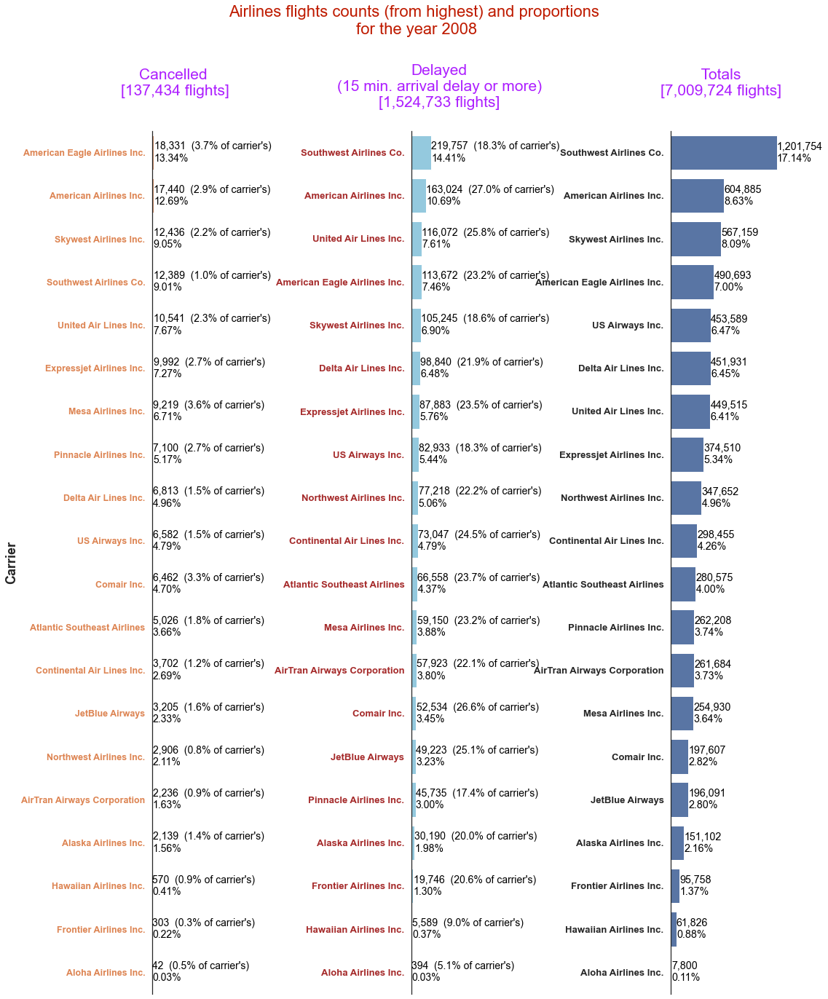

In [67]:
# Carrier against flights counts
# for the whole data points df_inv (7,009,728 rows), against df_inv_15 (1,524,733  rows) , airline_cancelled (137,434 rows)

default_color = sns.color_palette()[0]

fig, ax = plt.subplots(1, 3, sharex=True,figsize=(15.5,21.8))

plt.suptitle('Airlines flights counts (from highest) and proportions \nfor the year 2008',
             fontsize=22,color='#BF1B00',
             x=.45,y=.99)
# first subplot
ax[0] = plt.subplot(1,3,1)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)


sns.countplot(data = airline_cancelled ,
              y = 'Carrier',
              order = airline_cancelled['Carrier'].value_counts().index,
              color = sns.color_palette()[1],
              ax=ax[0])

plt.title('Cancelled \n[137,434 flights]',fontsize=21,color='#AD1FFF',x=.205,y=1.0365)

plt.xlabel('')
plt.ylabel('Carrier',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = sns.color_palette()[1],fontsize=12.5)

# Recalculating the flights_counts for carriers
carrier_flights_count = airline_cancelled['Carrier'].value_counts()
carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/137434

    string = str(f"{count:,}") + "  ({:0.1f}% of carrier's)\n{:0.2f}%".format(percentage_value,percentage_total)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black',fontsize=14);
    
##################################    
# second subplot
ax[1] = plt.subplot(1,3,2)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

sns.countplot(data = df_inv_15, y = 'Carrier',
              order = df_inv_15['Carrier'].value_counts().index,
              color = 'skyblue',
              ax=ax[1])

plt.title('Delayed\n(15 min. arrival delay or more)\n[1,524,733 flights]',fontsize=21,color='#AD1FFF',x=.25,y=1.023)

plt.xlabel('')
plt.ylabel('')
#plt.ylabel('Carrier',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = 'brown')

# Recalculating the flights_counts for carriers
carrier_flights_count = df_inv_15['Carrier'].value_counts()
carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
        
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/1524733

    string = str(f"{count:,}") + "  ({:0.1f}% of carrier's)\n{:0.2f}%".format(percentage_value,percentage_total)# flights

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black',fontsize=14);
    
##################################    
# third subplot
ax[2] = plt.subplot(1,3,3)
sns.countplot(data = df_inv, y = 'Carrier',
              order = df_inv['Carrier'].value_counts().index,
              color = default_color,
              ax=ax[2])
sns.set(font_scale=1.19,style='white')

sns.despine(bottom=True)

plt.title(' Totals \n[7,009,724 flights]',fontsize=21,color='#AD1FFF',x=.45,y=1.0365)
plt.xlabel('')
plt.ylabel('')

plt.xticks([])

# Recalculating the flights_counts for carriers
carrier_flights_count = df_inv['Carrier'].value_counts()

# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    
    percentage_total = 100*count/7009724
    
    string = str(f"{count:,}") + "\n{:0.2f}%".format(percentage_total) #+ ' flights'
    
    # print the annotation next to the bar
    plt.text(count+3000, loc, s= string, va = 'center', color = 'black');

    
#########    
plt.subplots_adjust(wspace=1.33);

    #if percentage_value >;
#plt.yticks([])


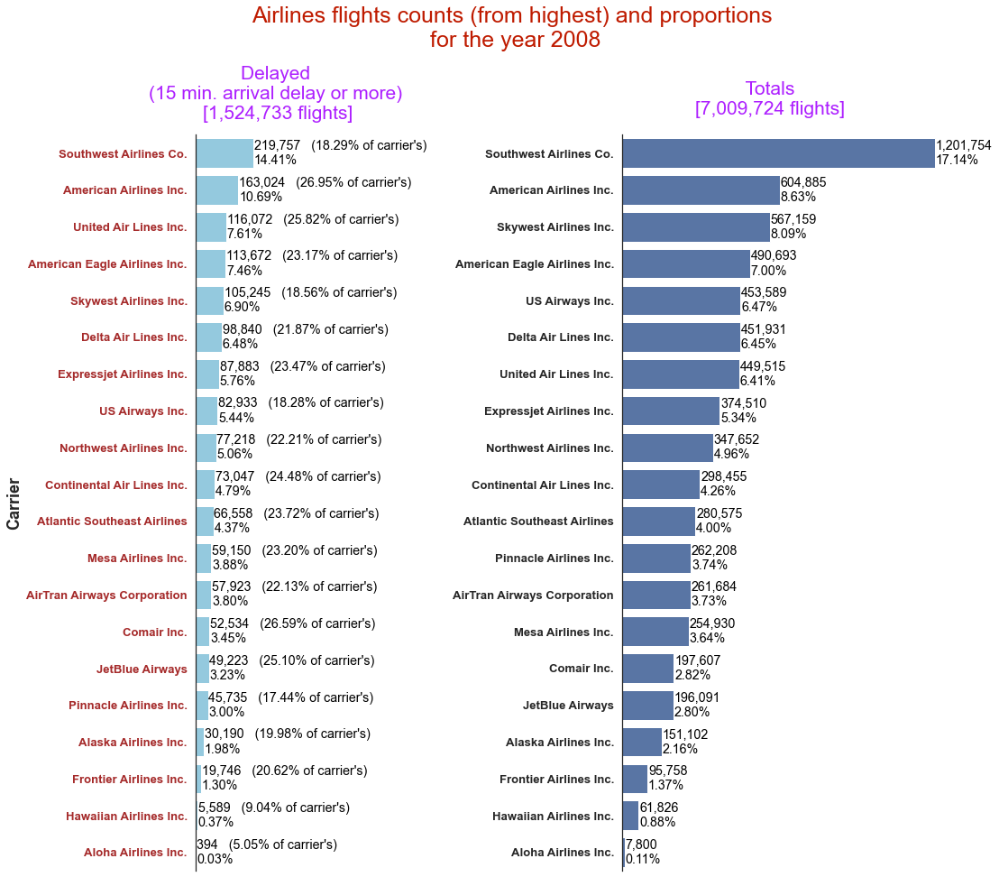

In [68]:
# Carrier against flights counts
# for the whole data points df_inv (7,009,728 rows), against df_inv_15 (1,524,733  rows) 

default_color = sns.color_palette()[0]

fig, ax = plt.subplots(1, 2, sharex=True,figsize=(15,15))

plt.suptitle('Airlines flights counts (from highest) and proportions\n for the year 2008'
          ,fontsize=25,color='#BF1B00',x=.45,y=1.012)

# first subplot
ax[0] = plt.subplot(1,2,1)

sns.set(font_scale=1.19,style='white')
sns.despine(bottom=True)

sns.countplot(data = df_inv_15, y = 'Carrier',
              order = df_inv_15['Carrier'].value_counts().index,
              color = 'skyblue',
              ax=ax[0])

plt.title('Delayed \n(15 min. arrival delay or more) \n[1,524,733 flights]',
          fontsize=21,color='#AD1FFF',x=.25,y=1.015)

plt.xlabel('')
plt.ylabel('Carrier',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = 'brown')

# Recalculating the flights_counts for carriers
carrier_flights_count = df_inv_15['Carrier'].value_counts()
carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/1524733
    
    string = str(f"{count:,}") + "   ({:0.2f}% of carrier's)\n{:0.2f}%".format(percentage_value,percentage_total)

    # print the annotation next to the bar
    plt.text(count+3000, loc, s=string, va = 'center', color = 'black');
    
##################################    
# second subplot
ax[1] = plt.subplot(1,2,2)
sns.countplot(data = df_inv, y = 'Carrier',
              order = df_inv['Carrier'].value_counts().index,
              color = default_color,
              ax=ax[1])
sns.set(font_scale=1.19,style='white')

sns.despine(bottom=True)

plt.title(' Totals \n[7,009,724 flights]',fontsize=21,color='#AD1FFF',x=.45,y=1.02)
plt.xlabel('')
plt.ylabel('')

plt.xticks([])

# Recalculating the flights_counts for carriers
carrier_flights_count = df_inv['Carrier'].value_counts()

# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    
    percentage_total = 100*count/7009724
    
    string = str(f"{count:,}") + "\n{:0.2f}%".format(percentage_total)
    
    # print the annotation next to the bar
    plt.text(count+3000, loc, s= string, va = 'center', color = 'black');

    
#########    
plt.subplots_adjust(wspace=0.3);



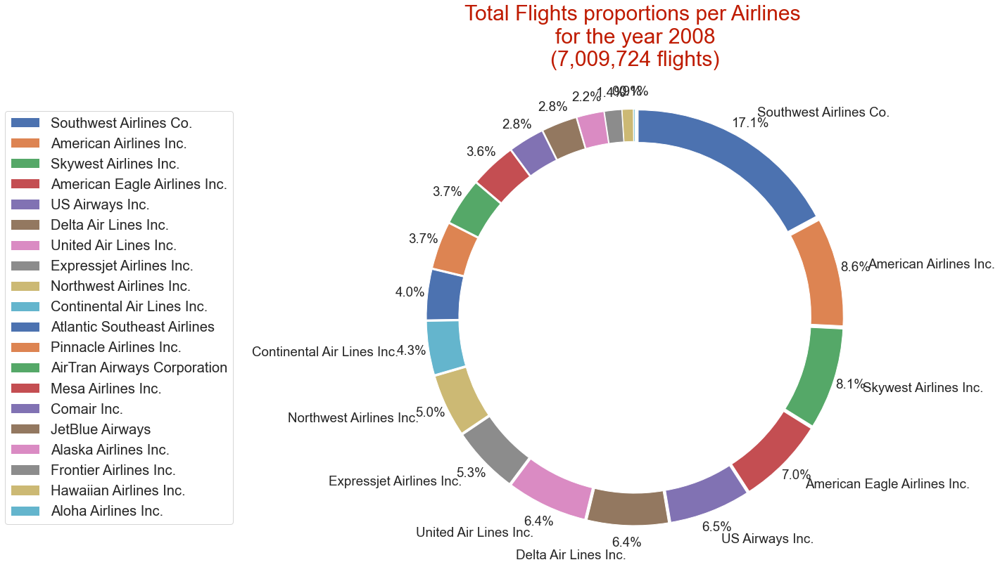

In [69]:
# All flights proportions per Airlines 

#plt.figure(figsize=(15,15))
#plt.pie()
#plt.plot()

carrier_counts = df_inv['Carrier'].value_counts()

first_10 = list(carrier_counts.head(10).index)
empty_list = ["" for i in range(len(carrier_counts)-10)]

n_list = first_10 + empty_list

carrier_counts.plot(kind='pie',figsize=(14,12),radius=2.5, wedgeprops = {'width' : .4}, pctdistance=1.086, labeldistance=1.15,
                    label='',labels=n_list,
                    counterclock=False,startangle=90,
                    #shadow=True,
                    explode=[0.08 for i in range(len(carrier_counts))],
                    autopct="%1.1f%%", colors=sns.color_palette(),fontsize=18.7)#,weight='bold')


plt.title("Total Flights proportions per Airlines \nfor the year 2008\n(7,009,724 flights)",
          color='#BF1B00', fontsize=30,y=1.04)
plt.axis("equal")
plt.legend(labels=carrier_counts.index,
           loc=6,bbox_to_anchor=(-.659,.5),
           fontsize=16,prop={'size':20.15});

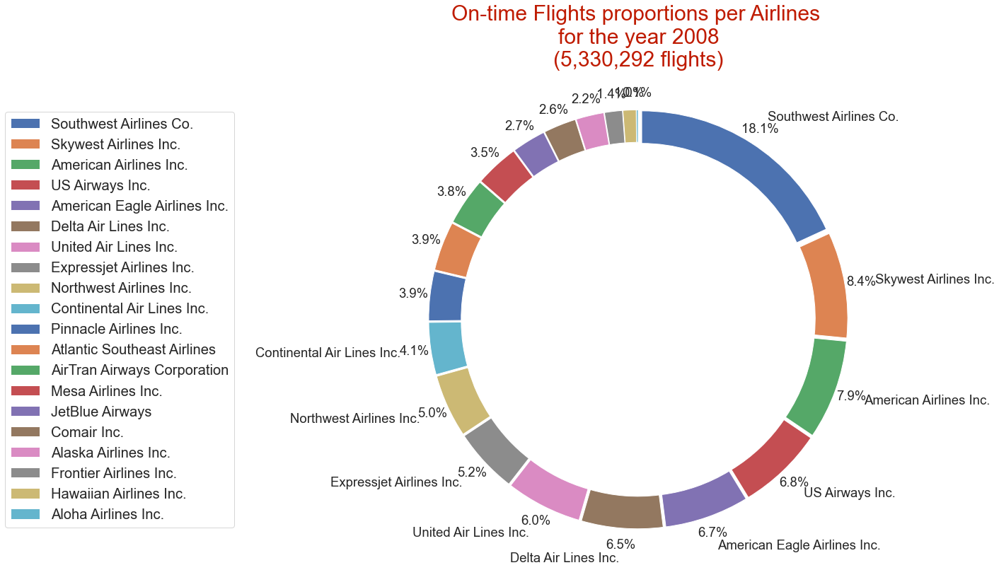

In [70]:
# on-time flights proportions per Airlines 

#plt.figure(figsize=(15,15))
#plt.pie()
#plt.plot()

carrier_counts = on_time['Carrier'].value_counts()

first_10 = list(carrier_counts.head(10).index)
empty_list = ["" for i in range(len(carrier_counts)-10)]

n_list = first_10 + empty_list

carrier_counts.plot(kind='pie',figsize=(14,12),radius=2.5, wedgeprops = {'width' : .4}, pctdistance=1.082, labeldistance=1.15,
                    label='',labels=n_list,
                    counterclock=False,startangle=90,
                    explode=[0.08 for i in range(len(carrier_counts))],
                    autopct="%1.1f%%", colors=sns.color_palette(),fontsize=18.5)#,weight='bold')


plt.title("On-time Flights proportions per Airlines \nfor the year 2008\n(5,330,292 flights)",
          color='#BF1B00', fontsize=30,y=1.04)
plt.axis("equal")
plt.legend(labels=carrier_counts.index,
           loc=6,bbox_to_anchor=(-.659,.5),
           fontsize=16,prop={'size':20.15});

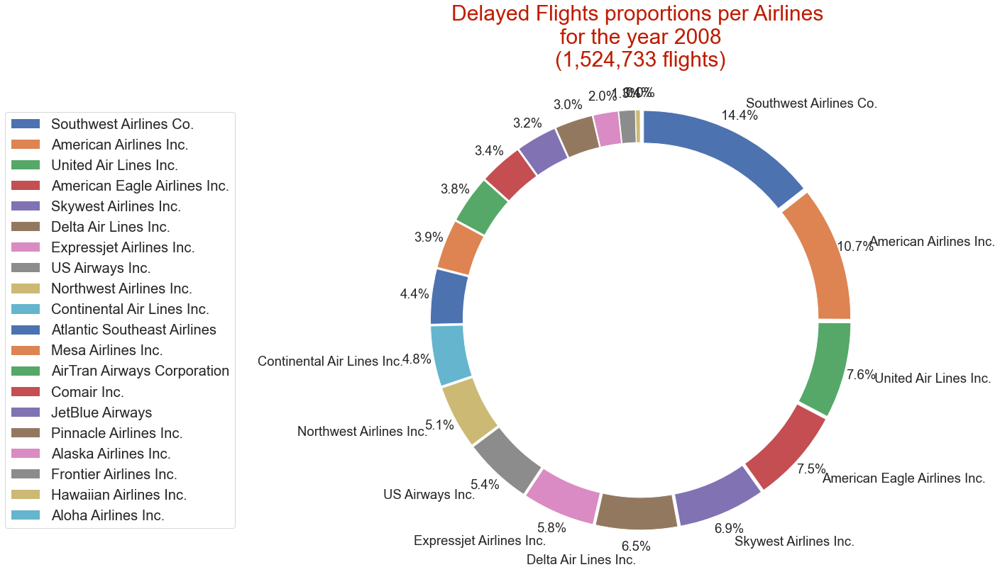

In [71]:
# on-time flights proportions per Airlines 

#plt.figure(figsize=(15,15))
#plt.pie()
#plt.plot()

carrier_counts = df_inv_15['Carrier'].value_counts()

first_10 = list(carrier_counts.head(10).index)
empty_list = ["" for i in range(len(carrier_counts)-10)]

n_list = first_10 + empty_list

carrier_counts.plot(kind='pie',figsize=(14,12),radius=2.5, wedgeprops = {'width' : .4}, pctdistance=1.082, labeldistance=1.15,
                    label='',labels=n_list,
                    counterclock=False,startangle=90,
                    explode=[0.08 for i in range(len(carrier_counts))],
                    autopct="%1.1f%%", colors=sns.color_palette(),fontsize=18.5)#,weight='bold')


plt.title("Delayed Flights proportions per Airlines \nfor the year 2008\n(1,524,733 flights)",
          color='#BF1B00', fontsize=30,y=1.04)
plt.axis("equal")
plt.legend(labels=carrier_counts.index,
           loc=6,bbox_to_anchor=(-.659,.5),
           fontsize=16,prop={'size':20.15});

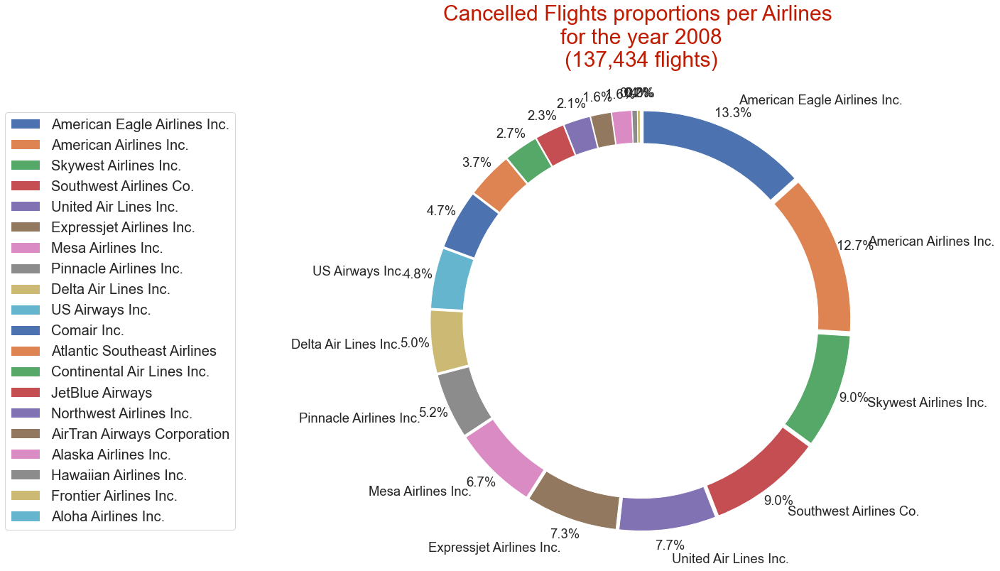

In [72]:
# on-time flights proportions per Airlines 

#plt.figure(figsize=(15,15))
#plt.pie()
#plt.plot()

carrier_counts = airline_cancelled['Carrier'].value_counts()

first_10 = list(carrier_counts.head(10).index)
empty_list = ["" for i in range(len(carrier_counts)-10)]

n_list = first_10 + empty_list

carrier_counts.plot(kind='pie',figsize=(14,12),radius=2.5, wedgeprops = {'width' : .4}, pctdistance=1.082, labeldistance=1.15,
                    label='',labels=n_list,
                    counterclock=False,startangle=90,
                    explode=[0.08 for i in range(len(carrier_counts))],
                    autopct="%1.1f%%", colors=sns.color_palette(),fontsize=18.5)#,weight='bold')


plt.title("Cancelled Flights proportions per Airlines \nfor the year 2008\n(137,434 flights)",
          color='#BF1B00', fontsize=30,y=1.04)
plt.axis("equal")
plt.legend(labels=carrier_counts.index,
           loc=6,bbox_to_anchor=(-.659,.5),
           fontsize=16,prop={'size':20.15});

In [73]:
print('\nYear 2008 flights aggregated counts and proportions per Airlines\n\n\
(sorted from the highest total flights airline had)')

prop_aireline.sort_values('Flights',ascending=False)

# columns are sorted by total flights number of airline


Year 2008 flights aggregated counts and proportions per Airlines

(sorted from the highest total flights airline had)


,Flights,On-time,On-time prop (per airline flights),Delayed,Del. prop (per airline flights),Cancelled,Canc. prop (per airline flights),Diverted,Div. prop (per airline flights)
Southwest Airlines Co.,1201754,967154,80.48 %,219757,18.29 %,12389,1.03 %,2454,0.2 %
American Airlines Inc.,604885,422461,69.84 %,163024,26.95 %,17440,2.88 %,1960,0.32 %
Skywest Airlines Inc.,567159,448167,79.02 %,105245,18.56 %,12436,2.19 %,1311,0.23 %
American Eagle Airlines Inc.,490693,357489,72.85 %,113672,23.17 %,18331,3.74 %,1201,0.24 %
US Airways Inc.,453589,363153,80.06 %,82933,18.28 %,6582,1.45 %,921,0.2 %
Delta Air Lines Inc.,451931,345094,76.36 %,98840,21.87 %,6813,1.51 %,1184,0.26 %
United Air Lines Inc.,449515,321907,71.61 %,116072,25.82 %,10541,2.34 %,995,0.22 %
Expressjet Airlines Inc.,374510,275531,73.57 %,87883,23.47 %,9992,2.67 %,1104,0.29 %
Northwest Airlines Inc.,347652,266892,76.77 %,77218,22.21 %,2906,0.84 %,636,0.18 %
Continental Air Lines Inc.,298455,220808,73.98 %,73047,24.48 %,3702,1.24 %,898,0.3 %


## <font color='#AD1FFF'>14<sup>th</sup></font> <font color='#5FB1FF'>Flights-cancellation per Airlines</font> <a id='14th'></a>

    
- **Carriers 'American Eagle Airlines Inc.', 'American Airlines Inc.', 'Skywest Airlines Inc.', 'Southwest Airlines Co.', 'United Air Lines Inc.', and 'Expressjet Airlines Inc.', had the highest flights-cancellation counts** from about 10k up to about 18.3k flights during year 2008. However, **'Hawaiian Airlines Inc.', 'Frontier Airlines Inc.', and 'Aloha Airlines Inc.' had the lowest flights-cancellation counts** which were '570', '303', and '42' flights respectively, amongst the other carriers.




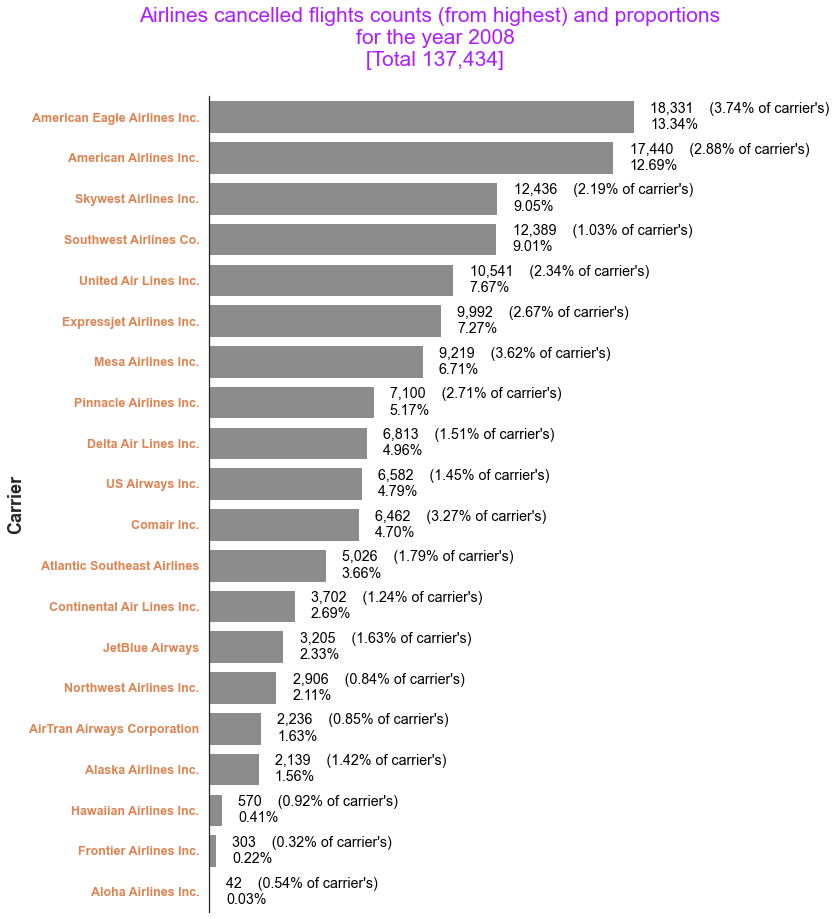

In [74]:
# Airlines cancelled flights
sns.set(font_scale=1.19,style='white')


plt.figure(figsize=(8,15))

sns.countplot(data = airline_cancelled ,
              y = 'Carrier',
              order = airline_cancelled['Carrier'].value_counts().index,
              color = sns.color_palette()[7])
sns.despine(bottom=True)

plt.title('Airlines cancelled flights counts (from highest) and proportions \n for the year 2008\n [Total 137,434]',
          fontsize=21,color='#AD1FFF',y=1.03)#,x=.205

plt.xlabel('')
plt.ylabel('Carrier',weight='bold',fontsize=18)

plt.xticks([])
plt.yticks(color = sns.color_palette()[1],fontsize=12.5)

# Recalculating the flights_counts for carriers
carrier_flights_count = airline_cancelled['Carrier'].value_counts()
carrier_flights_count_whole = df_inv['Carrier'].value_counts()   # to be used in calculating percentages of carrier flights
                                                                # counts with delays of 15 minutes or more 
                                                                # against carrier total flights number 
# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    count = carrier_flights_count[label.get_text()]
    count_whole = carrier_flights_count_whole[label.get_text()]
    
    percentage_value = 100*count/count_whole
    percentage_total = 100*count/137434
    
    string = str(f"{count:,}") + "    ({:0.2f}% of carrier's)\n{:0.2f}%".format(percentage_value,percentage_total)
    # print the annotation next to the bar
    plt.text(count+700, loc, s=string, va = 'center', color = 'black');#,fontsize=12.5);

In [75]:
print('\nYear 2008 cancelled flights aggregated data per Airlines\n\n(sorted from the highest total flights airline had)')

prop_aireline.sort_values('Flights',ascending=False).iloc[:,[0,5,6]]

# columns are sorted by total flights number of month


Year 2008 cancelled flights aggregated data per Airlines

(sorted from the highest total flights airline had)


,Flights,Cancelled,Canc. prop (per airline flights)
Southwest Airlines Co.,1201754,12389,1.03 %
American Airlines Inc.,604885,17440,2.88 %
Skywest Airlines Inc.,567159,12436,2.19 %
American Eagle Airlines Inc.,490693,18331,3.74 %
US Airways Inc.,453589,6582,1.45 %
Delta Air Lines Inc.,451931,6813,1.51 %
United Air Lines Inc.,449515,10541,2.34 %
Expressjet Airlines Inc.,374510,9992,2.67 %
Northwest Airlines Inc.,347652,2906,0.84 %
Continental Air Lines Inc.,298455,3702,1.24 %


In [76]:
#prop['Canc. prop (per total cancelled-flights 137,434 of year 2008'] = round(prop['Cancelled']*100/137434 ,
#                                                                             2).astype(str) + ' %'
#prop.drop(columns='Canc. prop (per total cancelled-flights 137,434 of year 2008',inplace=True)

print('\nAirlines cancelled-flights proportions compared to all 137,434 total cancelled-flights of year 2008 \n\n\
(sorted from the highest proportion)')

col = 'Canc. prop (per total 137,434 cancelled-flights of year 2008)'
round(prop_aireline.sort_values('Flights',ascending=False).iloc[:,[0,5,6]]['Cancelled']*100/137434 ,
      2) \
    .to_frame(col) \
    .sort_values(col,ascending=False).astype(str) + ' %'

# columns are sorted by total flights number of month


Airlines cancelled-flights proportions compared to all 137,434 total cancelled-flights of year 2008 

(sorted from the highest proportion)


,"Canc. prop (per total 137,434 cancelled-flights of year 2008)"
American Eagle Airlines Inc.,13.34 %
American Airlines Inc.,12.69 %
Skywest Airlines Inc.,9.05 %
Southwest Airlines Co.,9.01 %
United Air Lines Inc.,7.67 %
Expressjet Airlines Inc.,7.27 %
Mesa Airlines Inc.,6.71 %
Pinnacle Airlines Inc.,5.17 %
Delta Air Lines Inc.,4.96 %
US Airways Inc.,4.79 %


## <font color='#AD1FFF'>15<sup>th</sup></font> <font color='#5FB1FF'>Airlines and flights-cancellation causes times</font> <a id='15th'></a>

- **"Carrier" procedures had the highest impact to cancel flights within 11 Airlines carriers of 20**, and the second highest impact within other 6, and the third highest impact in other 3. However, the **"Weather" had the highest impact to cancel flights within 9 Airlines carriers of 20**, and the second highest impact within other 8, and the third within other 2. **"NAS" or National Air System had the second highest impact to cancel flights within 5 Airlines carriers of 20**, and the third highest impact within other 13.


- **'American Airlines Inc.'** which come second in total cancelled flights, **had more cancellations due to 'Carrier'** than other causes, even more than cancelled flights due to weather within 'American Eagle Airlines Inc.', the carrier that recorded the highest total count of cancelled flights, which most of them were cancelled due weather.


- 'Hawaiian Airlines Inc.'s flights-cancellation were because of 'Carrier', as a majority, and a few number cancelled due 'Weather'. However, 'Frontier Airlines Inc.'s cancelled-flights were because of 'Weather' then 'Carrier' respectively, as a majority, and a few number cancelled due 'NAS'.


- All 'Aloha Airlines Inc.'s 42 cancelled-flights were because of 'Carrier'.


In [77]:
airline_cancelled

,Month,Carrier,CancellationCode
178,Jan,Southwest Airlines Co.,A
373,Jan,Southwest Airlines Co.,A
399,Jan,Southwest Airlines Co.,A
401,Jan,Southwest Airlines Co.,C
415,Jan,Southwest Airlines Co.,A
...,...,...,...
7009455,Dec,Delta Air Lines Inc.,A
7009464,Dec,Delta Air Lines Inc.,A
7009564,Dec,Delta Air Lines Inc.,A
7009565,Dec,Delta Air Lines Inc.,A



Hint: Colored lines indicate the Max and Min frequencies


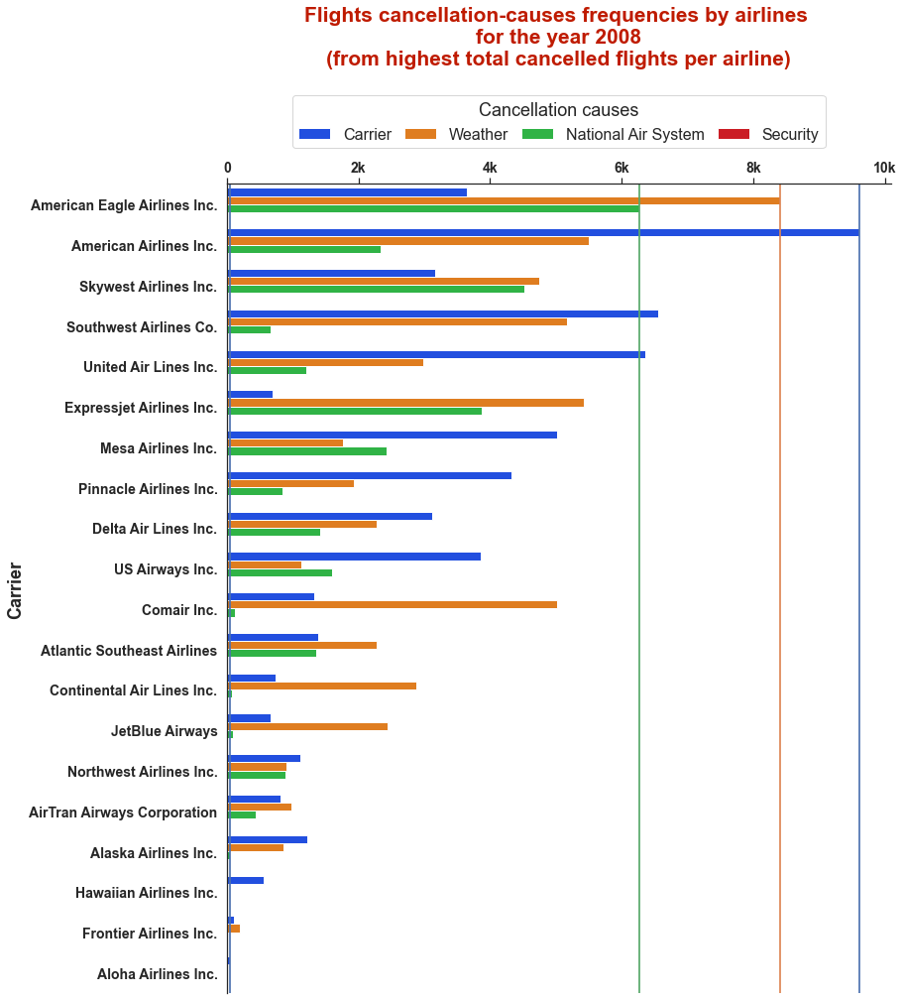

In [78]:
# cancellation causes per airline

plt.figure(figsize=(12,15))

ax = sns.countplot(data=airline_cancelled,
                   y='Carrier',order = airline_cancelled['Carrier'].value_counts().index,
                   hue='CancellationCode',hue_order=['A','B','C','D'],
                   palette='bright');

sns.despine(top=False,bottom=True)

title = 'Flights cancellation-causes frequencies by airlines \nfor the year 2008'
plt.title(title + '\n(from highest total cancelled flights per airline)',
          fontsize=21,color='#BF1B00',weight='bold',y=1.14)

plt.xlabel('')
plt.ylabel('Carrier',fontsize=18,weight='bold')

ax.xaxis.tick_top()

plt.xticks(np.arange(0,12000,2000),
           [0] + [str(n)+'k' for n in range(2,11,2)],
           #[0,'2k','4k','6k','8k','10k'],
           fontsize=14,weight='bold')
plt.yticks(fontsize=14,weight='bold')
plt.legend(title='Cancellation causes',title_fontsize=18,
           loc='upper center',#loc='upper right',
           #edgecolor='black', #prop={'size': 22},
           labels=['Carrier', 'Weather', 'National Air System', 'Security'],ncol = 4,
           #bbox_to_anchor=(1.2,.66),
           bbox_to_anchor=(.5,1.12),framealpha = .8,fontsize=14,prop={'size':16},columnspacing=.8)

# drawing max and min lines
max_min_lines = {'carrier':(9609,42),
                 'weather':(8408,0),
                 'NAS':(6275,0)}
colors = (color for color in list(sns.color_palette()))
for m in max_min_lines:
    
    max,min = max_min_lines[m]
    color=next(colors)
    plt.axvline(max,color=color,linewidth=1.7, linestyle ='-')
    plt.axvline(min ,color=color,linewidth=1.7, linestyle ='-');

#'-', '--', '-.', ':', 'None', ' ', '', 'solid', 'dashed', 'dashdot', 'dotted'

print('\nHint: Colored lines indicate the Max and Min frequencies');
#plt.grid(True,axis='x');

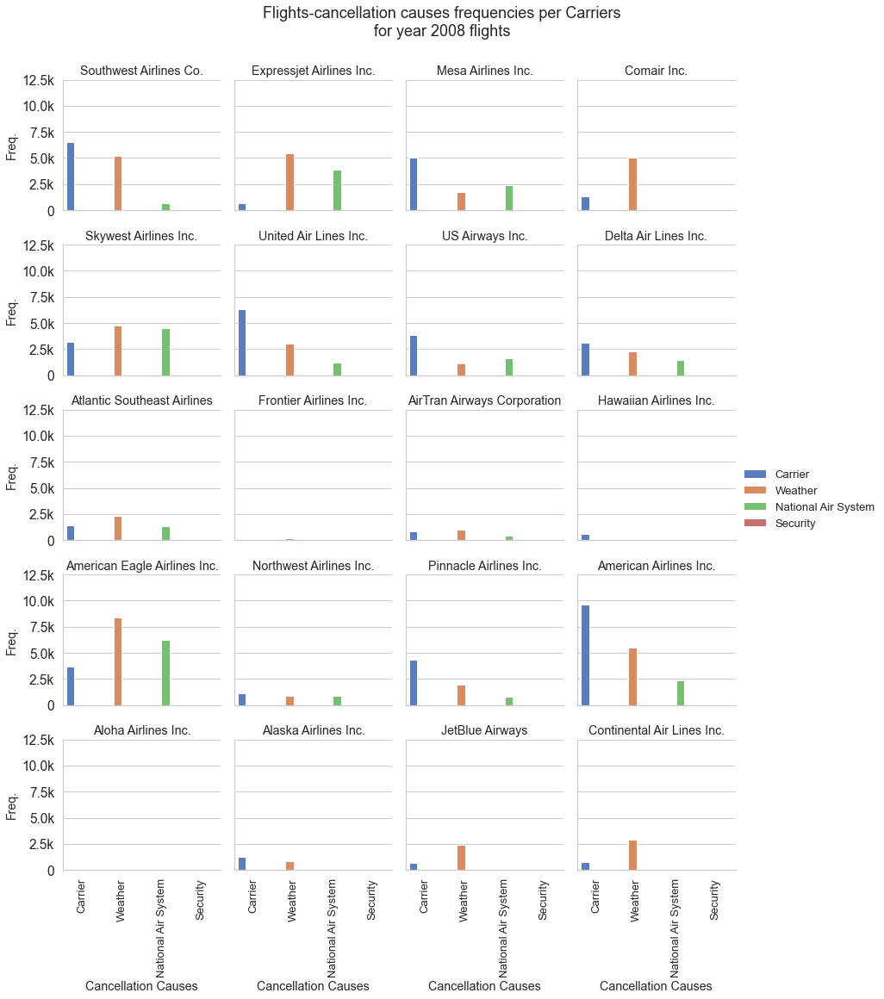

In [79]:
# # univariate plots of CancellationCode or flight cancellation-causes codes within Carriers
# for the whole data points df_inv (7,009,728 rows)
# A = carrier, B = weather, C = NAS, D = security

sns.set(font_scale=1.19,style='whitegrid')
g = sns.FacetGrid(data=df_inv,col='Carrier'
                  ,col_wrap=4
                 )#,xlim=(0,300))
g.fig.suptitle('Flights-cancellation causes frequencies per Carriers\nfor year 2008 flights\n',fontsize=18)

order = df_inv['CancellationCode'].value_counts().sort_index().index

g.map(sns.countplot,'CancellationCode', order = order,
                    hue=df_inv['CancellationCode'],hue_order= order,
                    color = sns.color_palette()[0],palette='muted')
g.set_titles('{col_name}')
g.add_legend(labels=['Carrier', 'Weather', 'National Air System', 'Security'])
g.set_ylabels('Freq.');#,color='blue',fontsize=15);

yticklabels = [str(n/1000) + 'k' for n in g.axes[0].get_yticks()]
g.set_yticklabels(labels = [0] +yticklabels[1:],fontsize=15.5)

g.set_xlabels('Cancellation Causes')
g.set_xticklabels([cause.replace('\n',' ') for cause in causes],
                  rotation=90);

In [80]:
# flights cancellation causes times per airlines
print('\nFlights cancellation-causes times per Airlines\n\n(Sorted from highest total cancellation times)')

airline_cancelled_dummies = pd.get_dummies(data=airline_cancelled,
                                           columns=['CancellationCode'],
                                           prefix='',
                                           prefix_sep='')
airline_cancelled_dummies['Total flights-cancellation causes times'] = \
                                                            airline_cancelled_dummies['A'] + airline_cancelled_dummies['B'] + \
                                                            airline_cancelled_dummies['C'] + airline_cancelled_dummies['D']
airline_cancelled_dummies.drop(columns='Month',inplace=True)
airline_cancelled_dummies.rename(columns={'A':'Carrier cancellation',
                                          'B':'Weather cancellation',
                                          'C':'National Air system cancellation',
                                          'D':'Security cancellation'},
                                 inplace=True)

airline_cancelled_dummies.groupby('Carrier').sum()\
                                            .sort_values(by='Total flights-cancellation causes times',ascending=False)\
                                            #.iloc[:,[0,1,2,3]]\
                                            #.plot(kind='barh',figsize=(15,15));


Flights cancellation-causes times per Airlines

(Sorted from highest total cancellation times)


,Carrier cancellation,Weather cancellation,National Air system cancellation,Security cancellation,Total flights-cancellation causes times
Carrier,,,,,
American Eagle Airlines Inc.,3644.0,8408.0,6275.0,4.0,18331.0
American Airlines Inc.,9609.0,5495.0,2334.0,2.0,17440.0
Skywest Airlines Inc.,3162.0,4748.0,4525.0,1.0,12436.0
Southwest Airlines Co.,6554.0,5167.0,666.0,2.0,12389.0
United Air Lines Inc.,6352.0,2987.0,1202.0,0.0,10541.0
Expressjet Airlines Inc.,697.0,5424.0,3871.0,0.0,9992.0
Mesa Airlines Inc.,5020.0,1766.0,2433.0,0.0,9219.0
Pinnacle Airlines Inc.,4329.0,1932.0,838.0,1.0,7100.0
Delta Air Lines Inc.,3113.0,2283.0,1417.0,0.0,6813.0


In [81]:
#{'A':'Carrier cancellation',
# 'B':'Weather cancellation',
# 'C':'National Air system cancellation',
# 'D':'Security cancellation'},

print('\n','Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security')

airline_cancelled.groupby(['Carrier','CancellationCode']).size().to_frame('Times')


 Cancellation Codes: A = Carrier , B = Weather , C = National Air system , D = Security


Times
Carrier                     CancellationCode       
AirTran Airways Corporation A                   815
                            B                   976
                            C                   445
Alaska Airlines Inc.        A                  1222
                            B                   865
...                                             ...
US Airways Inc.             B                  1131
                            C                  1594
United Air Lines Inc.       A                  6352
                            B                  2987
                            C                  1202

[63 rows x 1 columns]

## <font color='#AD1FFF'>16<sup>th</sup></font> <font color='#5FB1FF'>Arrival delays per airlines</font> <a id='16th'></a>

- **Carriers 'American Airlines Inc.', 'Mesa Airlines Inc.', 'Comair Inc.', 'United Air Lines Inc.', 'JetBlue Airways', and 'Continental Air Lines Inc.', had the most arrival delays means** exceeding 11 up to about 13 minutes during year 2008. However, **'Southwest Airlines Co.', 'Alaska Airlines Inc.', 'Pinnacle Airlines Inc.', 'US Airways Inc.', and 'Hawaiian Airlines Inc.', had the lowest arrival delays means** from about 1 to about 5 minutes amongst the other carriers.


- What was of surprising, **arrival delays mean of 'Aloha Airlines Inc.' was about negative 3 minutes**, indicating almost no notable arrival delays within this carrier flights.

        

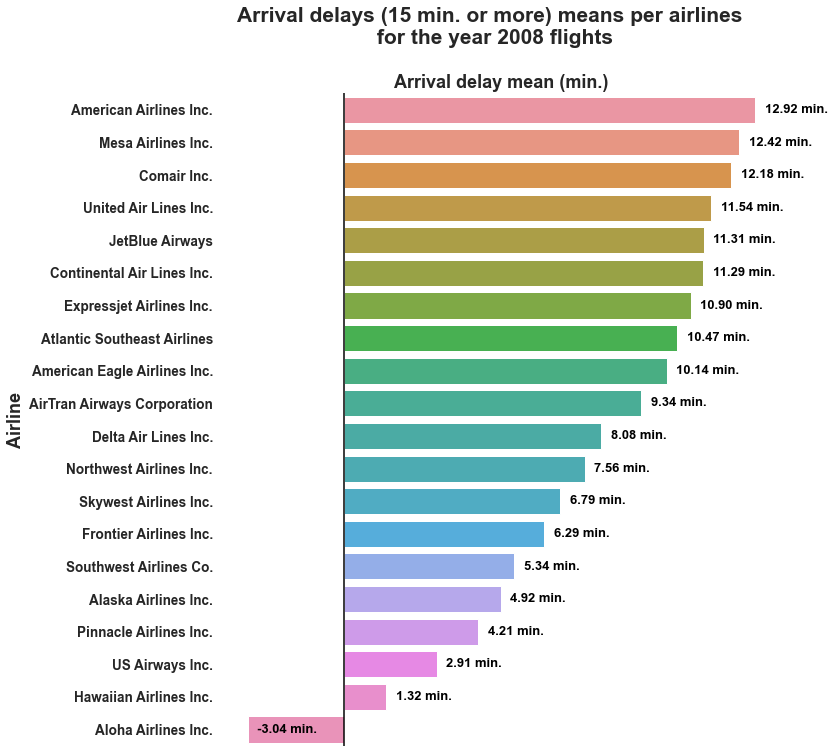

In [82]:
# ArrDelay means per Airlines

# airlines_arr_means = df_inv.loc[~(df_inv['ArrDelay'].isin(zero_or_null)),['Carrier','ArrDelay']] \
#                             .groupby('Carrier').mean() \
#                             .sort_values(by='ArrDelay',ascending=False)

airlines_arr_means = df_inv[~(df_inv['ArrDelay'].isin(zero_or_null))][['Carrier','ArrDelay']]\
                                                                                    .groupby('Carrier').mean()\
                                                                                    .sort_values(by='ArrDelay',ascending=False)

plt.figure(figsize=[10,12])

sns.barplot(data=airlines_arr_means, y=airlines_arr_means.index , x='ArrDelay')#,linestyles='')

sns.despine(left=True,bottom=True)
sns.set_theme(font_scale=1.19,style='ticks')

plt.suptitle('Arrival delays (15 min. or more) means per airlines \n for the year 2008 flights',fontsize=21,weight='bold')
plt.ylabel('Airline',fontsize=18,weight='bold')
plt.title('Arrival delay mean (min.)',fontsize=18,weight='bold')
plt.xticks([])
plt.xlabel('')

#plt.ylim((0,18))
#plt.grid(True)

loc , labels = plt.xticks(fontsize=13.5)
loc , labels = plt.yticks(fontsize=13.5)
plt.axvline(color='black')


# get the current tick locations and labels
locs, labels = plt.yticks(weight='bold') 

# loop through each pair of locations and labels
for loc, label in zip(locs, labels):
    # get the text property for the label to get the correct count
    mean = airlines_arr_means.loc[label.get_text(),'ArrDelay']
    
    string = '{:0.2f} min.'.format(mean)
    
    # print the annotation next to the bar
    plt.text(mean+.3, loc, s=string, va = 'center', color = 'black',fontsize=13,weight='bold');

## <font color='#AD1FFF'>17<sup>th</sup></font> <font color='#5FB1FF'>Arrival delays by delay causes Vs. Airlines</font> <a id='17th'></a>

- **On average**, amongst other delay-causes, **'Weather' had the highest impact on flights arrival delays within almost all carriers, except in case of 'Frontier Airlines Inc.'** where probably by far,'Security' went up with the highest impact on flights arrival delays. Then, also on average, 'Carrier' and 'NAS' or national air system, were swapping the second and the third highest impacts, except in few carriers where 'Security' may exceed like in 'Delta Air Lines Inc.' and 'Aloha Airlines Inc.'.


- **In general, arrival delays due to 'Weather' had the highest medians**, with the widest third quartile ranges starting from those medians, and higher greater-values distributions, **within almost all carriers, notably in 'JetBlue Airways', except in case of 'Frontier Airlines Inc.'** where flights arrival delays due to 'Security' went up with the highest median and the widest second quartile range, and higher greater-values distribution.

- Then, also in general, arrival delays due to 'Carrier' and 'NAS' or national air system, were swapping the second and the third highest medians, as well lower-values distributions except in few carriers where **arrival delays due to 'Security' may had greater medians and more greater-values distributions, like in 'United Air Lines Inc.', 'Delta Air Lines Inc.' and 'Aloha Airlines Inc.'**.

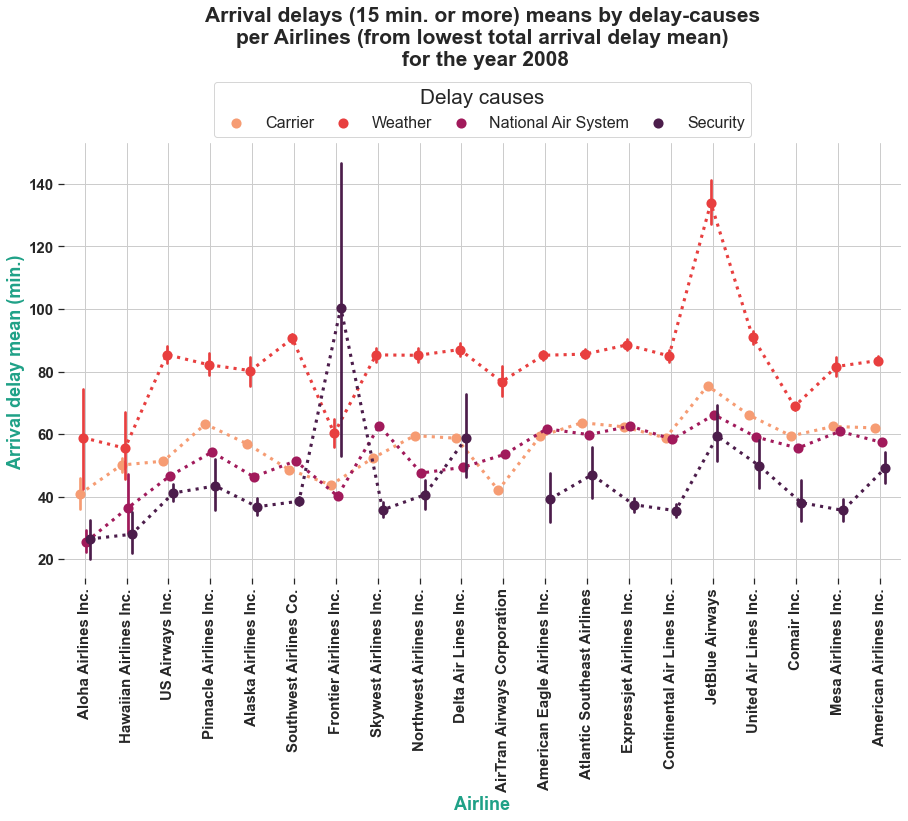

In [83]:
plt.figure(figsize = [15,8])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.pointplot(data = melt_15, x = 'Carrier', y = 'ArrDelay', hue = 'Cause',
                   order=airlines_arr_means.index[::-1],
                   linestyles='dotted',dodge= 0.237,scale=1.15
                  ,palette = 'rocket_r')

title='Arrival delays (15 min. or more) means by delay-causes\n'
ax.set_title(title+ 'per Airlines (from lowest total arrival delay mean)\n for the year 2008',
             fontsize=21,weight='bold',y=1.165)
ax.set_xlabel('Airline',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay mean (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)

plt.xticks(fontsize=15,weight='bold',rotation=90)
plt.yticks(fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large')#,color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

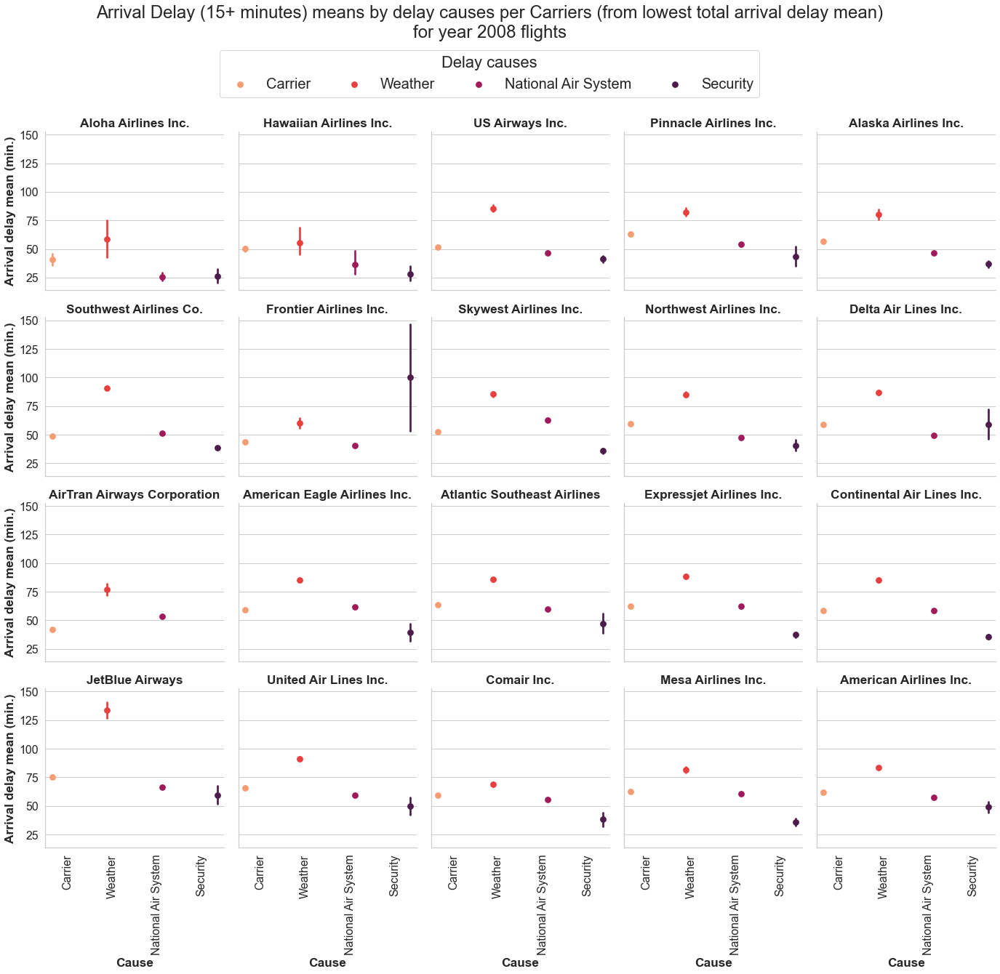

In [84]:
# ArrDelay means by causes per Carriers for flights with 15+ minutes arrival delay
sns.set(font_scale=1.44,style='whitegrid')

g = sns.FacetGrid(data=melt_15,col='Carrier',
                  col_order=airlines_arr_means.index[::-1],
                  col_wrap=5,
                 height=4)#,xlim=(0,300))
title='Arrival Delay (15+ minutes) means by delay causes per Carriers (from lowest total arrival delay mean)\n'
g.fig.suptitle(title+'for year 2008 flights',
               fontsize=24,x=0.331,y=1.06)
g.map(sns.pointplot,'Cause','ArrDelay', order=melt_15.Cause.unique(),
                            hue=melt_15['Cause'],hue_order=melt_15.Cause.unique(),
                            palette = 'rocket_r',
                            dodge=.7)#,linestyles='',scale=1.15,

g.set_titles('{col_name}',weight='bold')
g.add_legend(title='Delay causes',#title_fontsize =25,
             loc='upper center',
             ncol=4,
             prop={'size':20},
             bbox_to_anchor=(0.331,1.015),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=22)
g.set_xticklabels(rotation=90)#,fontsize=13.5)
#g.set_yticklabels(g.axes[0].get_yticks().astype('int'),fontsize=13.5)
g.set_xlabels('Cause',weight='bold')
g.set_ylabels('Arrival delay mean (min.)',weight='bold');#,color='blue',fontsize=15);

In [85]:
print('\nFlights delays means per months and causes')

columns={'ArrDelay':'Arrival delay mean (min.)','Minutes':'Cause delay mean (min.)'}
melt_15.groupby(['Carrier','Cause']).mean().rename(columns=columns)
#melt_15[list(set(melt_15.columns) -{'Cancelled'})].groupby(['Carrier','Cause']).mean().rename(columns=columns)


Flights delays means per months and causes


Arrival delay mean (min.)  \
Carrier                     Cause                                            
AirTran Airways Corporation Carrier                              42.115972   
                            National Air System                  53.588426   
                            Weather                              76.769874   
Alaska Airlines Inc.        Carrier                              56.899871   
                            National Air System                  46.367842   
...                                                                    ...   
US Airways Inc.             Weather                              85.449527   
United Air Lines Inc.       Carrier                              66.042223   
                            National Air System                  59.105156   
                            Security                             49.883721   
                            Weather                              91.000000   

                                                 Cause delay mean (min.)  
Carrier                     Cause                                         
AirTran Airways Corporation Carrier                            31.822994  
                            National Air System                26.499704  
                            Weather                            51.468619  
Alaska Airlines Inc.        Carrier                            38.939147  
                            National Air System                19.703027  
...                                                                  ...  
US Airways Inc.             Weather                            40.166798  
United Air Lines Inc.       Carrier                            36.718466  
                            National Air System                29.436918  
                            Security                           38.627907  
                            Weather                            41.386162  

[79 rows x 2 columns]

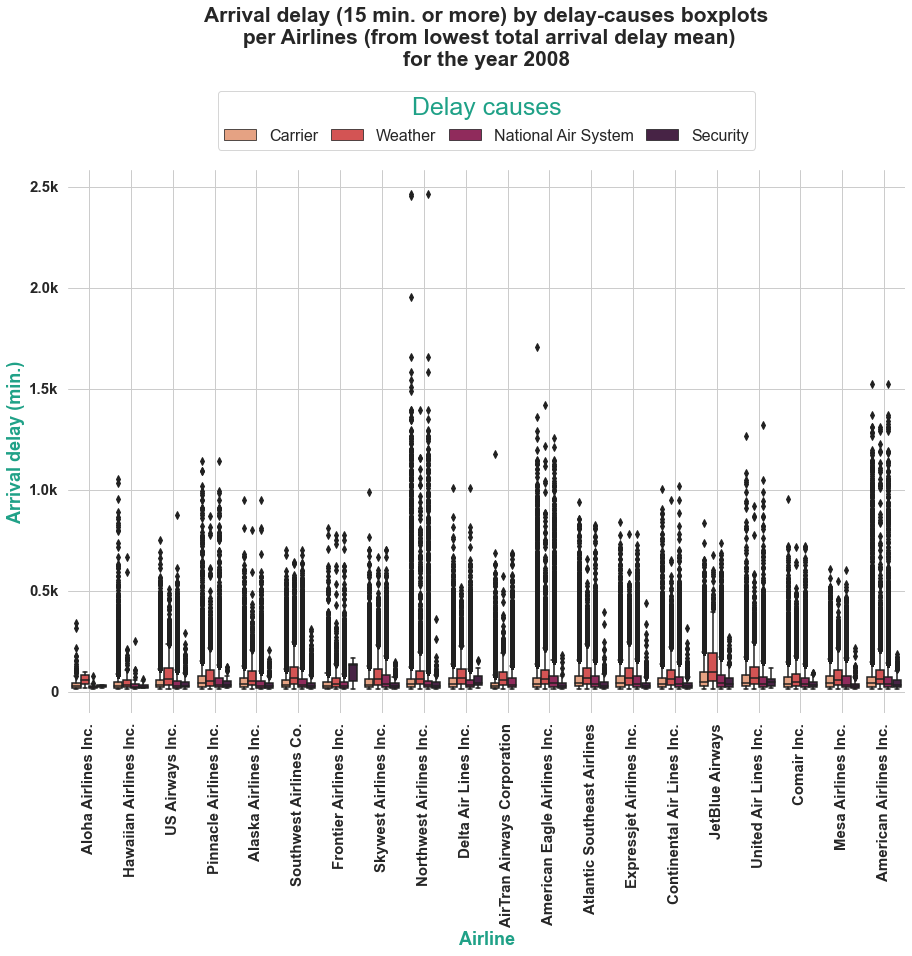

In [86]:
plt.figure(figsize = [15,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.boxplot(data = melt_15, x = 'Carrier', y = 'ArrDelay', hue = 'Cause',
                 order=airlines_arr_means.index[::-1],
                 dodge= 0.2,#scale=1.15 ,linestyles='',
                 palette = 'rocket_r')

title = 'Arrival delay (15 min. or more) by delay-causes boxplots\n per Airlines (from lowest total arrival delay mean)'
        
ax.set_title(title+'\nfor the year 2008',fontsize=21,weight='bold',y=1.18)

ax.set_xlabel('Airline',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)

plt.xticks(fontsize=15,weight='bold',rotation=90)

plt.yticks(np.arange(0,3000,500),
           [0] + [str(n)+'k' for n in np.arange(0.5,3,0.5)],
           #[0] + [str(n/10)+'k' for n in range(5,30,5)],
           fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

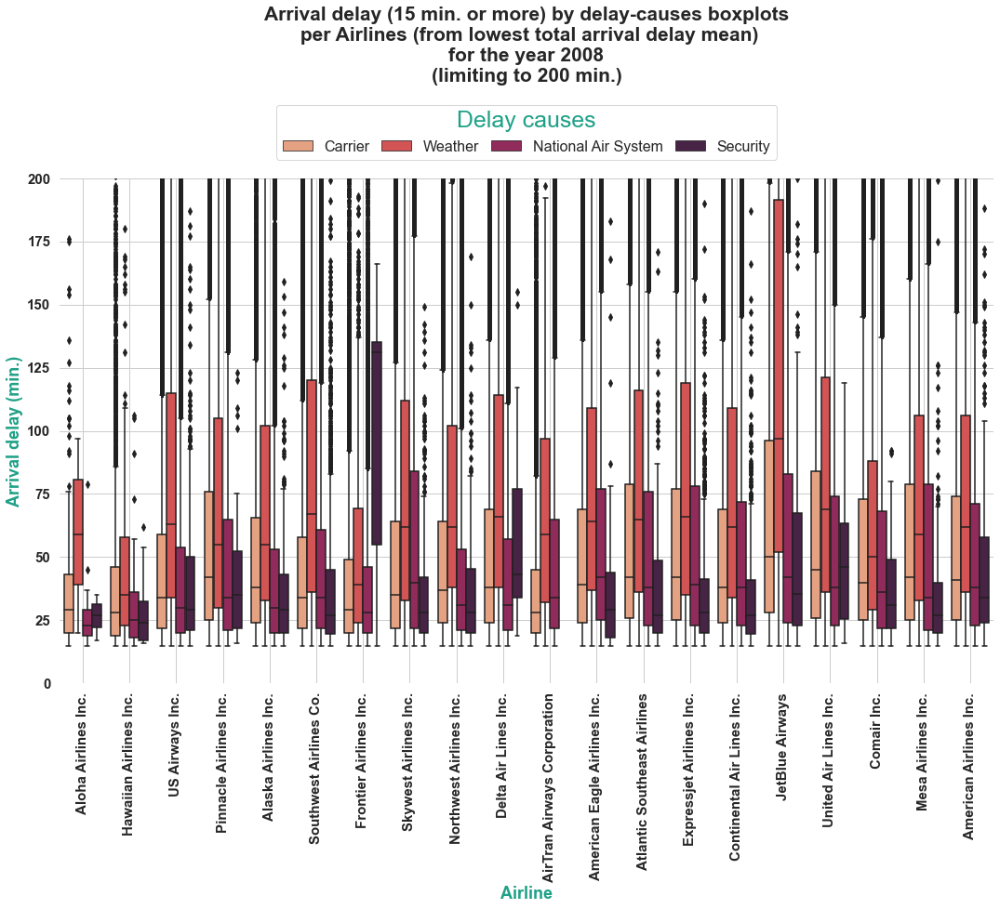

In [87]:
plt.figure(figsize = [18,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.boxplot(data = melt_15, x = 'Carrier', y = 'ArrDelay', hue = 'Cause',
                 order=airlines_arr_means.index[::-1],
                 dodge= 0.2,#scale=1.15 ,linestyles='',
                 palette = 'rocket_r')

title = 'Arrival delay (15 min. or more) by delay-causes boxplots\n per Airlines (from lowest total arrival delay mean)'
        
ax.set_title(title +'\nfor the year 2008'+ '\n(limiting to 200 min.)',
             fontsize=21,weight='bold',y=1.18)
ax.set_xlabel('Airline',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)
plt.ylim(0,200)
plt.xticks(fontsize=15,weight='bold',rotation=90)
plt.yticks(fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large',color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

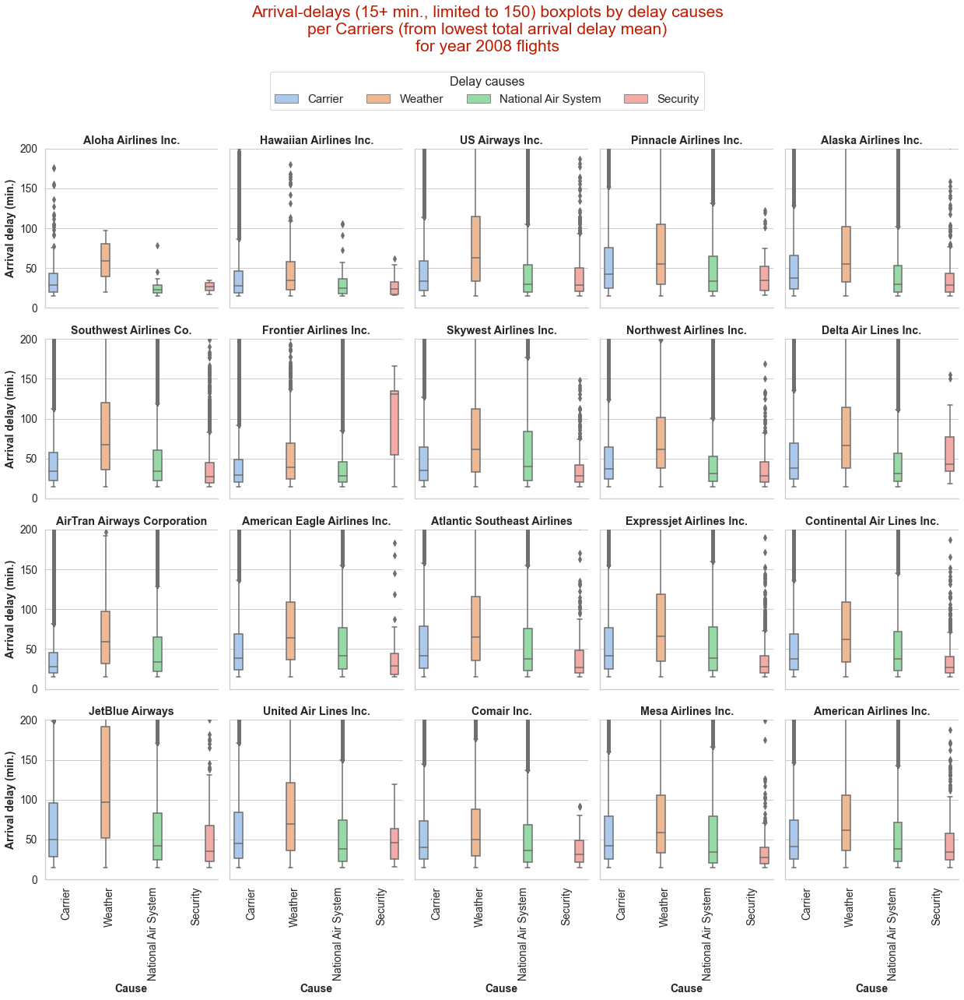

In [88]:
# # bivariate plots of Arrival-delays (15+ min., limited to 150) boxplots  per delay causes by Carriers for year 2008 flights
# 1.5+ million flights, 20 Carriers

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='box',
                data=melt_15,col='Carrier', col_order=airlines_arr_means.index[::-1],
                col_wrap=5,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',#'rocket_r',
                height=3.5,facet_kws=dict(ylim=(0,200))
                )
title = 'Arrival-delays (15+ min., limited to 150) boxplots by delay causes'
g.fig.suptitle(title+'\nper Carriers (from lowest total arrival delay mean)'+'\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.35,
               y=1.15)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=15,
             bbox_to_anchor=(0.35,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels([cause.replace('\n',' ') for cause in causes],
                  rotation=90,fontsize=13.7)#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
#ytickslabels = [0] + [str(n/1000)+'k' for n in ytickslabels[1:]]
g.set_yticklabels(ytickslabels,fontsize=13.7);#fontsize=12,color='blue',weight='bold';

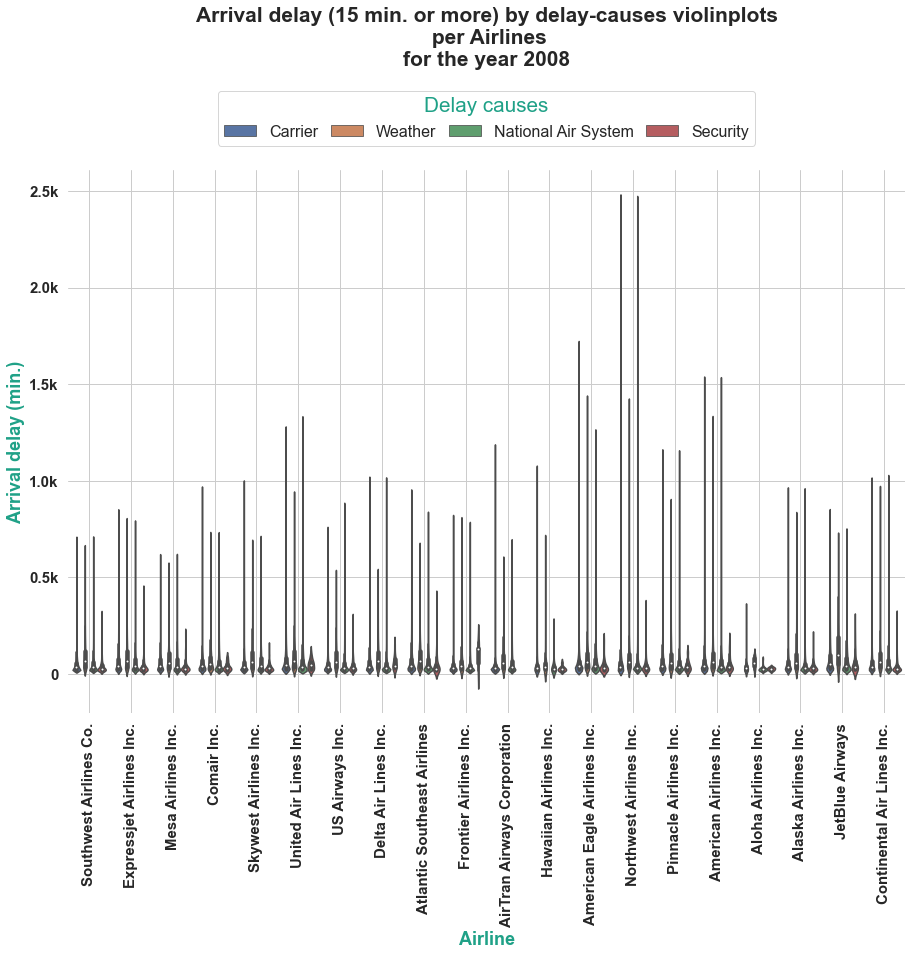

In [89]:
plt.figure(figsize = [15,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.violinplot(data = melt_15, x = 'Carrier', y = 'ArrDelay', hue = 'Cause',
                    #order=airlines_arr_means.index,
                    dodge= 0.2,#scale=1.15 ,linestyles='',
                   )#palette = 'rocket_r')

title = 'Arrival delay (15 min. or more) by delay-causes violinplots\n per Airlines' # (from highest total arrival delay mean)'
        
ax.set_title(title+'\nfor the year 2008',fontsize=21,weight='bold',y=1.18)

ax.set_xlabel('Airline',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)

plt.xticks(fontsize=15,weight='bold',rotation=90)

plt.yticks(np.arange(0,3000,500),
           [0] + [str(n)+'k' for n in np.arange(0.5,3,0.5)],
           #[0] + [str(n/10)+'k' for n in range(5,30,5)],
           fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large', color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);

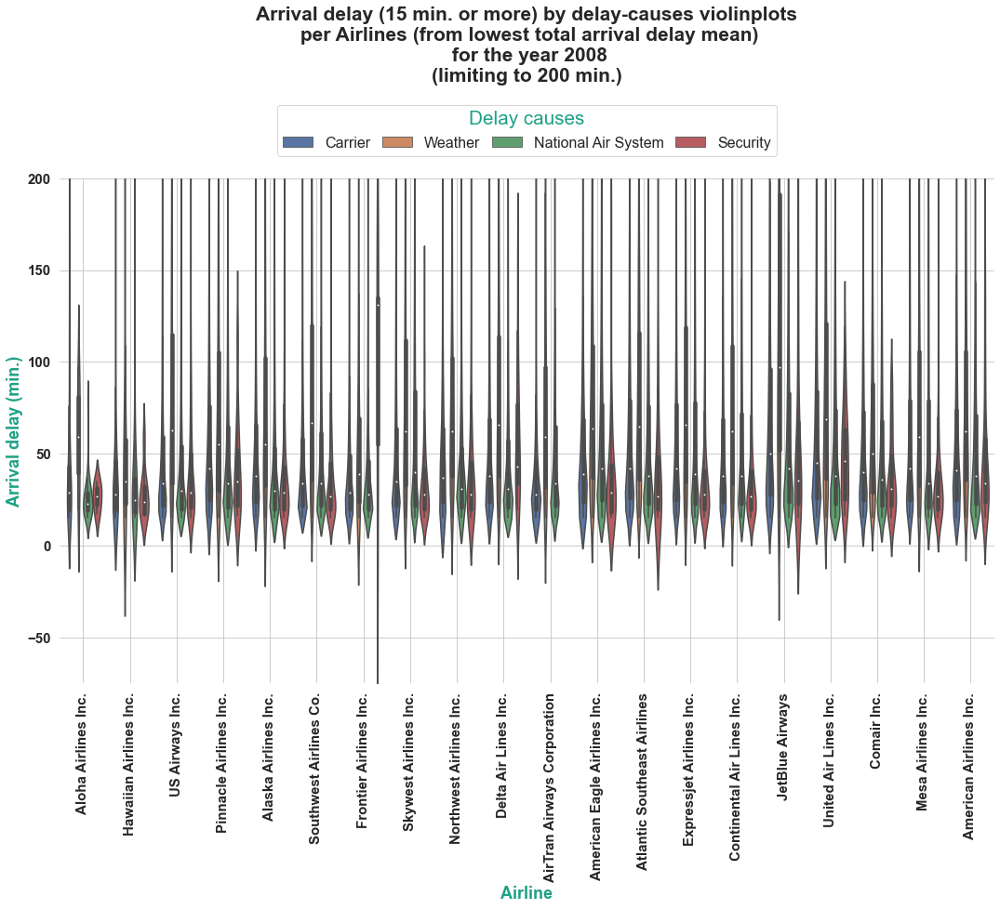

In [90]:
plt.figure(figsize = [18,10])

#plt.suptitle('Arrival delays means by delay causes \n per Airlines\n for the year 2008',fontsize=21,weight='bold')

ax = sns.violinplot(data = melt_15, x = 'Carrier', y = 'ArrDelay', hue = 'Cause',
                    order=airlines_arr_means.index[::-1],
                    dodge= 0.2,#scale=1.15 ,linestyles='',
                   )#palette = 'rocket_r')

title = 'Arrival delay (15 min. or more) by delay-causes violinplots\n per Airlines (from lowest total arrival delay mean)'
ax.set_title(title + '\n for the year 2008' + '\n(limiting to 200 min.)',
             fontsize=21,weight='bold',y=1.18)
ax.set_xlabel('Airline',color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',y=-.2)
ax.set_ylabel('Arrival delay (min.)', color=sns.color_palette('viridis')[-3],
              fontsize=18,weight='bold',x=-.2)
plt.ylim(-75,200)
plt.xticks(fontsize=15,weight='bold',rotation=90)
plt.yticks(fontsize=15,weight='bold')

#ax.xaxis.tick_top()

legend = ax.legend(title = 'Delay causes', ncol = 4,  framealpha = .8, 
                   loc='upper center',bbox_to_anchor=(.5,1.16),
                   # labels=causes,  
                   fontsize=14,prop={'size':16},columnspacing=.8)
plt.setp(legend.get_title(),fontsize='x-large',color=sns.color_palette('viridis')[-3])  

sns.despine(left=True,bottom=True)
plt.grid(True);  

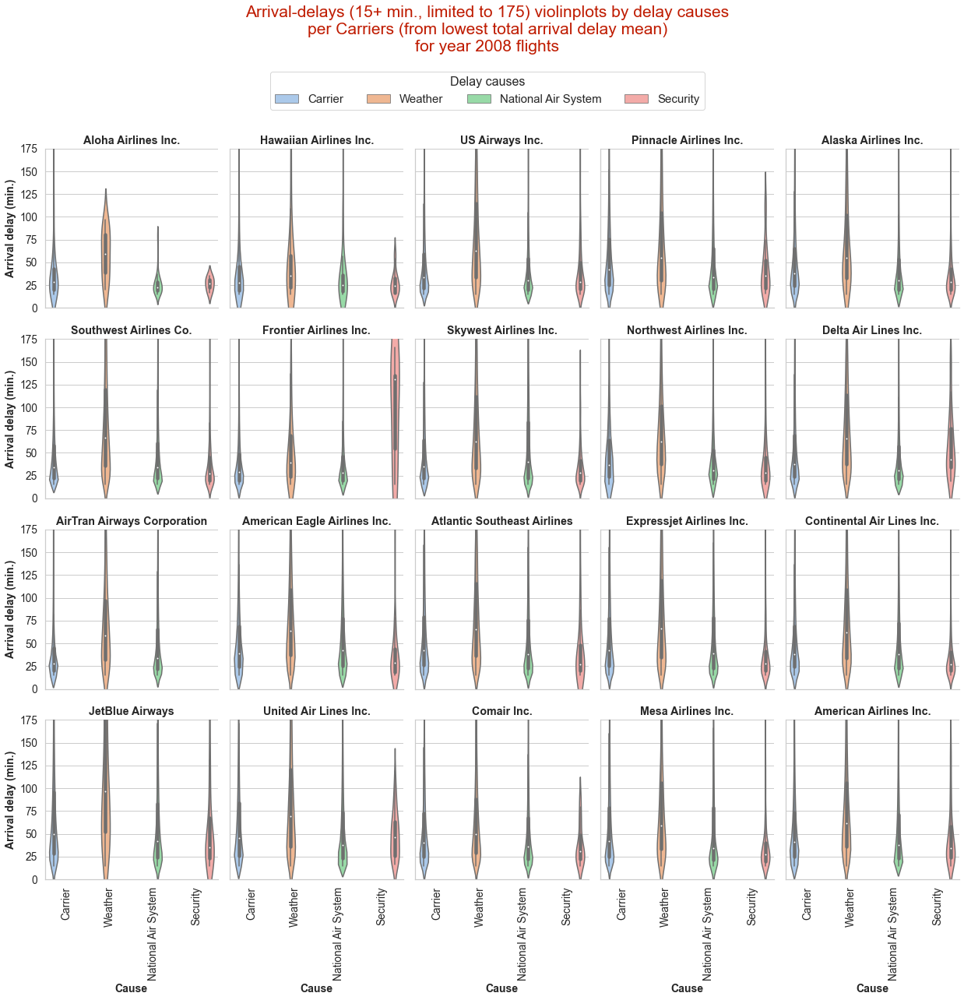

In [91]:
# # bivariate plots of Arrival-delays (15+ min., limited to 150) violinplots  per delay causes by Carriers for year 2008 flights
# 1.5+ million flights, 20 Carriers

sns.set(font_scale=1.19,style='whitegrid')

order = melt_15['Cause'].unique()

# g = sns.FacetGrid(data=melt_15,col='Month',
#                   col_wrap=4,
#                   hue='Cause',hue_order= order,palette='pastel'
#                  )#,xlim=(0,300))
g = sns.catplot(kind='violin',
                data=melt_15,col='Carrier', col_order=airlines_arr_means.index[::-1],
                col_wrap=5,
                x='Cause',order=order,
                y='ArrDelay',
                hue='Cause',hue_order= order,palette='pastel',#'rocket_r',
                height=3.5,facet_kws=dict(ylim=(0,175))
                )
title = 'Arrival-delays (15+ min., limited to 175) violinplots by delay causes'
g.fig.suptitle(title+'\nper Carriers (from lowest total arrival delay mean)'+'\nfor year 2008 flights',
               color='#BF1B00',
               fontsize=21,
               x=0.35,
               y=1.15)

# g.map(sns.barplot,'Cause','Minutes',order=order,)

g.set_titles('{col_name}',fontsize=18,weight='bold')

g.add_legend(title = 'Delay causes', #labels=['Carrier', 'Weather', 'National Air System', 'Security'])
             loc='upper center',
             ncol=4,
             fontsize=15,
             bbox_to_anchor=(0.35,1.073),
             frameon=True,framealpha=.8)
plt.setp(g._legend.get_title(),fontsize=16)

g.set_xlabels('Cause',weight='bold',fontsize=14)#
g.set_xticklabels([cause.replace('\n',' ') for cause in causes],
                  rotation=90,fontsize=13.7)#,weight='bold'
g.set_ylabels('Arrival delay (min.)',weight='bold',fontsize=14);

ytickslabels = (g.axes[0].get_yticks()).astype('int')
#ytickslabels = [0] + [str(n/1000)+'k' for n in ytickslabels[1:]]
g.set_yticklabels(ytickslabels,fontsize=13.7);#fontsize=12,color='blue',weight='bold';

## <center><font color='#09aed9'>«Conclusions»</font><a id='Conclusion'></a><center>

    
* **1**<sup>**st**</sup>: <u>**related to arrival delays and delay causes in general**</u>⮚
    <br>➷ 'Carrier' as well 'Weather' were the most common to cancel a flight. 
    <br>➷ Flights-cancellation due 'Security' doesn't seem to be the common.
    <br>➷ Most arrival delays were of 15 minutes to about 78 minutes.
    <br>➷ More higher frequencies were for "Carrier" and "National Air System" lower-delays values than other delay-causes delays.
    <br>➷ 'Carrier' delays exceeded with the highest spread and outliers.
    <br>➷ 'NAS' delays had more lower-values frequencies.
    <br>➷ In general, Weather-delays had the highest mean, median, the wider IQR, and a wider range from its higher median to its third quartile over other-causes delays. 
    <br>➷ Flights that had weather-delays were probably to have the most arrival delays in general.
    <br>➷ Arrival delays due to 'Weather' had a higher mean, median (which is about 62 minutes), with a larger third quartile range, and a more wider greater values distribution from about 55 minutes to about 225 minutes than arrival delays due to other causes.
    <br>➷ Much more frequencies for arrival delays due to 'NAS'.
    <br>➷ For the whole flights of 15+ min. arrival delay, in general, arrival-delays due to 'Security' had the lowest median, ranges, as well outliers.
    <br>➷ For all delayed or flights of 15+ arrival delay, there were some kind of linearity between arrival delays and delays of different delay-causes, at some point before 250 minutes of causes-delays (and about 50 minutes for sampled data). 
    <br>➷ In general, arrival delays had more stronger moderate correlation with carrier-delays.
    <br>➷ 'Carrier' and 'NAS'-delays had more higher correlation than 'Weather'-delays with arrival delays.
<br>
    
* **2**<sup>**nd**</sup>: <u>**related to 'Months'**</u>⮚
    <br>➷ All 2008 months had close-ratios of recorded total flights frequencies.
    <br>➷ Months 'Feb', 'Dec', 'Jan', and 'Mar', had the highest flights-cancellation counts.
    <br>➷ 'May', 'Nov', and 'Oct' had the lowest flights-cancellation counts.
    <br>➷ 'Feb' exceeded in the ratio of cancelled flights, then 'Dec' and 'Jan',  which are notable to be of 'Winter' season.
    <br>➷ "Weather" had the highest impact to cancel flights within months 'Feb', 'Dec', 'Jan', 'Mar', as well 'Sep', almost for half of the year.
    <br>➷ Months 'Dec', 'Jun', 'Feb', and 'Mar' had the highest arrival delays means.
    <br>➷ 'Sep' and 'Nov' had the lowest arrival delays means.
    <br>➷ 'Weather' had the highest impact on flights arrival delays within different 2008 months.
<br>
    
* **3**<sup>**rd**</sup> <u>**related to 'Carriers'**</u>⮚
    <br>➷ 'Southwest Airlines Co.' recorded the highest total flights count within 2008; more than twice of carrier's in next order.
    <br>➷ Carriers 'American Eagle Airlines Inc.', 'American Airlines Inc.', 'Skywest Airlines Inc.', 'Southwest Airlines Co.', 'United Air Lines Inc.', and 'Expressjet Airlines Inc.', had the highest flights-cancellation counts.
    <br>➷ 'Hawaiian Airlines Inc.', 'Frontier Airlines Inc.', and 'Aloha Airlines Inc.' had the lowest flights-cancellation counts.
    <br>➷ "Carrier" procedures had the highest impact to cancel flights within 11 Airlines carriers of 20.
    <br>➷ "Weather" had the highest impact to cancel flights within 9 Airlines carriers of 20.
    <br>➷ "NAS" or National Air System had the second highest impact to cancel flights within 5 Airlines carriers of 20.
    <br>➷ 'American Airlines Inc.'  had more cancellations due to 'Carrier'.
    <br>➷ 'Hawaiian Airlines Inc.'s flights-cancellation were because of 'Carrier', as a majority.
    <br>➷ 'Aloha Airlines Inc.'s 42 cancelled-flights were because of 'Carrier'.
    <br>➷ Carriers 'American Airlines Inc.', 'Mesa Airlines Inc.', 'Comair Inc.', 'United Air Lines Inc.', 'JetBlue Airways', and 'Continental Air Lines Inc.', had the highest arrival delays means.
    <br>➷ 'Pinnacle Airlines Inc.', 'US Airways Inc.', and 'Hawaiian Airlines Inc.', had the lowest arrival delays means.
    <br>➷ Arrival delays mean of 'Aloha Airlines Inc.' was about negative 3 minutes, indicating almost no arrival delays.
    <br>➷ On average, 'Weather' had the highest impact on flights arrival delays within almost all carriers, notably in 'JetBlue Airways', except in case of 'Frontier Airlines Inc.'
    <br>➷ Arrival delays due to 'Security' may had greater medians and more greater-values distributions, like in 'United Air Lines Inc.', 'Delta Air Lines Inc.' and 'Aloha Airlines Inc.'.